In [1]:
import pandas as pd
from sklearn import metrics
from sklearn.model_selection import train_test_split
import seaborn as sn
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import classification_report
import random
import shap
import xgboost
from matplotlib.patches import Patch

/home/jn/anaconda3/lib/python3.10/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
path = '../Dataset/'
data = pd.read_csv(path+'NF-UQ-NIDS-v2.csv')
data.head()

,IPV4_SRC_ADDR,L4_SRC_PORT,IPV4_DST_ADDR,L4_DST_PORT,PROTOCOL,L7_PROTO,IN_BYTES,IN_PKTS,OUT_BYTES,OUT_PKTS,...,TCP_WIN_MAX_OUT,ICMP_TYPE,ICMP_IPV4_TYPE,DNS_QUERY_ID,DNS_QUERY_TYPE,DNS_TTL_ANSWER,FTP_COMMAND_RET_CODE,Label,Attack,Dataset
0,192.168.100.148,65389,192.168.100.7,80,6,7.0,420,3,0,0,...,0.0,35840.0,140.0,0.0,0.0,0.0,0.0,1.0,DoS,NF-BoT-IoT-v2
1,192.168.100.148,11154,192.168.100.5,80,6,7.0,280,2,40,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,DoS,NF-BoT-IoT-v2
2,192.168.1.31,42062,192.168.1.79,1041,6,0.0,44,1,40,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Benign,NF-ToN-IoT-v2
3,192.168.1.34,46849,192.168.1.79,9110,6,0.0,44,1,40,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Benign,NF-ToN-IoT-v2
4,192.168.1.30,50360,192.168.1.152,1084,6,0.0,44,1,40,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Benign,NF-ToN-IoT-v2


In [3]:
data.Attack.value_counts()

Attack
Benign            1415361
DDoS              1224094
DoS               1006900
scanning           213222
Reconnaissance     147854
xss                138248
password            64500
injection           38830
Bot                  8144
Brute Force          7023
Infilteration        6631
Exploits             1757
Fuzzers              1229
Backdoor             1042
Generic               953
mitm                  418
ransomware            172
Analysis              140
Theft                 135
Shellcode              73
Worms                  10
Name: count, dtype: int64

In [4]:
len(data)

4276737

In [5]:
data.Label.value_counts()

Label
1.0    2861375
0.0    1415361
Name: count, dtype: int64

In [3]:
data = data.dropna(axis=0)
len(data)

4276736

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4276736 entries, 0 to 4276735
Data columns (total 46 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   IPV4_SRC_ADDR                object 
 1   L4_SRC_PORT                  int64  
 2   IPV4_DST_ADDR                object 
 3   L4_DST_PORT                  int64  
 4   PROTOCOL                     int64  
 5   L7_PROTO                     float64
 6   IN_BYTES                     int64  
 7   IN_PKTS                      int64  
 8   OUT_BYTES                    int64  
 9   OUT_PKTS                     int64  
 10  TCP_FLAGS                    int64  
 11  CLIENT_TCP_FLAGS             int64  
 12  SERVER_TCP_FLAGS             int64  
 13  FLOW_DURATION_MILLISECONDS   int64  
 14  DURATION_IN                  int64  
 15  DURATION_OUT                 int64  
 16  MIN_TTL                      int64  
 17  MAX_TTL                      int64  
 18  LONGEST_FLOW_PKT             int64  
 19  SHORT

In [8]:
data.Label.value_counts()

Label
1.0    2861375
0.0    1415361
Name: count, dtype: int64

In [9]:
data.Label.value_counts()

Label
1.0    2861375
0.0    1415361
Name: count, dtype: int64

In [4]:
data.Label.value_counts()[1]

2861375

In [11]:
print(len(data))

4276736


In [4]:
data = data.drop(columns=['IPV4_SRC_ADDR', 'IPV4_DST_ADDR'], axis=1)

In [13]:
data.iloc[0]

L4_SRC_PORT                            65389
L4_DST_PORT                               80
PROTOCOL                                   6
L7_PROTO                                 7.0
IN_BYTES                                 420
IN_PKTS                                    3
OUT_BYTES                                  0
OUT_PKTS                                   0
TCP_FLAGS                                  2
CLIENT_TCP_FLAGS                           2
SERVER_TCP_FLAGS                           0
FLOW_DURATION_MILLISECONDS           4293092
DURATION_IN                             1875
DURATION_OUT                               0
MIN_TTL                                   64
MAX_TTL                                   64
LONGEST_FLOW_PKT                         140
SHORTEST_FLOW_PKT                        140
MIN_IP_PKT_LEN                             0
MAX_IP_PKT_LEN                           140
SRC_TO_DST_SECOND_BYTES             140280.0
DST_TO_SRC_SECOND_BYTES                  0.0
RETRANSMIT

In [5]:
# from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

# scaler = StandardScaler()
scaler = MinMaxScaler()

for i in data.columns[:-2]:
    data[i] = scaler.fit_transform(data[i].values.reshape(-1,1))

In [6]:
data.head()

,L4_SRC_PORT,L4_DST_PORT,PROTOCOL,L7_PROTO,IN_BYTES,IN_PKTS,OUT_BYTES,OUT_PKTS,TCP_FLAGS,CLIENT_TCP_FLAGS,...,TCP_WIN_MAX_OUT,ICMP_TYPE,ICMP_IPV4_TYPE,DNS_QUERY_ID,DNS_QUERY_TYPE,DNS_TTL_ANSWER,FTP_COMMAND_RET_CODE,Label,Attack,Dataset
0,0.997772,0.001221,0.023529,0.028226,5.644426e-06,0.000010,0.000000e+00,0.000000,0.008969,0.008969,...,0.0,0.54902,0.54902,0.0,0.0,0.0,0.0,1.0,DoS,NF-BoT-IoT-v2
1,0.170199,0.001221,0.023529,0.028226,3.753948e-06,0.000005,2.432072e-07,0.000009,0.098655,0.008969,...,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0,1.0,DoS,NF-BoT-IoT-v2
2,0.641825,0.015885,0.023529,0.000000,5.671433e-07,0.000000,2.432072e-07,0.000009,0.098655,0.008969,...,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,Benign,NF-ToN-IoT-v2
3,0.714870,0.139010,0.023529,0.000000,5.671433e-07,0.000000,2.432072e-07,0.000009,0.098655,0.008969,...,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,Benign,NF-ToN-IoT-v2
4,0.768444,0.016541,0.023529,0.000000,5.671433e-07,0.000000,2.432072e-07,0.000009,0.098655,0.008969,...,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,Benign,NF-ToN-IoT-v2


In [41]:
train_data, test_data = train_test_split(data, random_state=42, test_size=0.2, shuffle=True)

In [17]:
train_data.Label.value_counts()

Label
1.0    2289167
0.0    1132221
Name: count, dtype: int64

In [18]:
test_data.Label.value_counts()

Label
1.0    572208
0.0    283140
Name: count, dtype: int64

In [19]:
# from imblearn.over_sampling import SMOTE

# sm = SMOTE(random_state = 42)
# X_train_oversampled, y_train_oversampled = sm.fit_resample(train_data[train_data.columns[:-1]], train_data[train_data.columns[-1]])
# # X_train = pd.DataFrame(X_train_oversampled, columns=X_train.columns)

In [20]:
# train_data = pd.concat([X_train_oversampled, y_train_oversampled], axis=1)

In [42]:
attack_df1 = train_data[train_data['Label']==1.0]
attack_df1 = attack_df1.sample(n=min(train_data.Label.value_counts()), random_state=42)

ben_df1 = train_data[train_data['Label']==0.0]
ben_df1 = ben_df1.sample(n=min(train_data.Label.value_counts()), random_state=42)

train_data = pd.concat([attack_df1, ben_df1], ignore_index=False)
train_data = train_data.sample(frac=1) #shuffling
len(train_data)

2264442

In [22]:
train_data.Attack.value_counts()

Attack
Benign            1132221
DDoS               484217
DoS                398079
scanning            84441
Reconnaissance      58746
xss                 55037
password            25454
injection           15396
Bot                  3213
Brute Force          2662
Infilteration        2628
Exploits              680
Fuzzers               514
Backdoor              415
Generic               366
mitm                  157
ransomware             68
Theft                  56
Analysis               55
Shellcode              31
Worms                   6
Name: count, dtype: int64

In [23]:
train_data.Label.value_counts()

Label
1.0    1132221
0.0    1132221
Name: count, dtype: int64

In [24]:
min(test_data.Label.value_counts())

283140

In [43]:
attack_df1 = test_data[test_data['Label']==1.0]
attack_df1 = attack_df1.sample(n=min(test_data.Label.value_counts()), random_state=42)

ben_df1 = test_data[test_data['Label']==0.0]
ben_df1 = ben_df1.sample(n=min(test_data.Label.value_counts()), random_state=42)

test_data = pd.concat([attack_df1, ben_df1], ignore_index=False)
test_data = test_data.sample(frac=1) #shuffling
len(test_data)

566280

In [26]:
test_data.Attack.value_counts()

Attack
Benign            283140
DDoS              120998
DoS                99684
scanning           21023
Reconnaissance     14733
xss                13675
password            6463
injection           3820
Bot                  791
Brute Force          723
Infilteration        679
Exploits             160
Fuzzers              115
Generic              104
Backdoor              93
mitm                  40
Theft                 18
ransomware            11
Analysis               8
Shellcode              2
Name: count, dtype: int64

In [27]:
test_data.Label.value_counts()

Label
0.0    283140
1.0    283140
Name: count, dtype: int64

In [44]:
train_data = train_data[train_data.columns[:-2]]
train_data.head()

,L4_SRC_PORT,L4_DST_PORT,PROTOCOL,L7_PROTO,IN_BYTES,IN_PKTS,OUT_BYTES,OUT_PKTS,TCP_FLAGS,CLIENT_TCP_FLAGS,...,NUM_PKTS_1024_TO_1514_BYTES,TCP_WIN_MAX_IN,TCP_WIN_MAX_OUT,ICMP_TYPE,ICMP_IPV4_TYPE,DNS_QUERY_ID,DNS_QUERY_TYPE,DNS_TTL_ANSWER,FTP_COMMAND_RET_CODE,Label
4064209,0.917433,0.051713,0.023529,0.000000,1.839165e-05,0.000036,0.000012,0.000073,0.134529,0.134529,...,0.000009,0.125002,0.976577,0.0,0.0,0.000000,0.000000,0.000000e+00,0.0,0.0
4204740,0.380163,0.051713,0.023529,0.000000,1.968797e-05,0.000036,0.000011,0.000063,0.134529,0.134529,...,0.000009,0.125002,0.976577,0.0,0.0,0.000000,0.000000,0.000000e+00,0.0,0.0
3267754,0.932631,0.051713,0.023529,0.000000,1.995804e-05,0.000036,0.000011,0.000063,0.995516,0.995516,...,0.000009,0.125002,0.976577,0.0,0.0,0.000000,0.000000,0.000000e+00,0.0,0.0
2823446,0.422141,0.001221,0.066667,0.758065,7.291842e-07,0.000005,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000e+00,0.0,1.0
3289186,0.806973,0.000809,0.066667,0.021129,9.857490e-07,0.000000,0.000001,0.000009,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.0,0.782681,0.000031,1.397001e-08,0.0,0.0


In [45]:
test_data = test_data[test_data.columns[:-2]]
test_data.head()

,L4_SRC_PORT,L4_DST_PORT,PROTOCOL,L7_PROTO,IN_BYTES,IN_PKTS,OUT_BYTES,OUT_PKTS,TCP_FLAGS,CLIENT_TCP_FLAGS,...,NUM_PKTS_1024_TO_1514_BYTES,TCP_WIN_MAX_IN,TCP_WIN_MAX_OUT,ICMP_TYPE,ICMP_IPV4_TYPE,DNS_QUERY_ID,DNS_QUERY_TYPE,DNS_TTL_ANSWER,FTP_COMMAND_RET_CODE,Label
221940,0.859480,0.001526,0.023529,0.000000,5.671433e-07,0.000000,2.432072e-07,0.000009,0.098655,0.008969,...,0.000000,0.015625,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4148919,0.041688,0.001221,0.066667,0.758065,7.291842e-07,0.000005,0.000000e+00,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2108411,0.879774,0.051713,0.023529,0.000000,2.157845e-05,0.000052,1.138818e-05,0.000063,0.995516,0.995516,...,0.000009,0.125002,0.976577,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2037760,0.693523,0.015854,0.023529,0.000000,5.671433e-07,0.000000,2.432072e-07,0.000009,0.098655,0.008969,...,0.000000,0.015625,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2234366,0.264378,0.051713,0.023529,0.000000,1.462419e-05,0.000047,4.091962e-06,0.000082,1.000000,0.982063,...,0.000000,0.125002,0.976577,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [30]:
# attack_df1 = data[data['Label']==1.0]
# attack_df1 = attack_df1.sample(n=data.Label.value_counts()[1], random_state=42)

# ben_df1 = data[data['Label']==0.0]
# ben_df1 = ben_df1.sample(n=data.Label.value_counts()[1], random_state=42)

# data = pd.concat([attack_df1, ben_df1], ignore_index=False)
# data = data.sample(frac=1) #shuffling
# len(data)

In [46]:
X_train, X_test, y_train, y_test = train_data[train_data.columns[:-1]], test_data[test_data.columns[:-1]], train_data[train_data.columns[-1]], test_data[test_data.columns[-1]] 

In [47]:
y_train = [int(i) for i in y_train]
y_test = [int(i) for i in y_test]

In [48]:
X_train, X_test, y_train, y_test = np.array(X_train), np.array(X_test), np.array(y_train), np.array(y_test) 

In [34]:
# from imblearn.over_sampling import SMOTE
# sm = SMOTE(random_state = 2)
# X_train, y_train = sm.fit_resample(X_train, y_train.ravel())
# print(np.count_nonzero(y_train == 1))
# print(np.count_nonzero(y_train == 0))

In [49]:
unique_classes = ['Benign','Attack']

In [7]:
xgb_classifier = xgboost.XGBClassifier(objective='binary:logistic', verbosity=2, n_estimators=100, max_depth=5)

In [51]:
xgb_model = xgb_classifier.fit(X_train, y_train)
xgb_predicted_values = xgb_model.predict(X_test)

In [52]:
print(classification_report(y_test , xgb_predicted_values, target_names=unique_classes))

              precision    recall  f1-score   support

      Benign       0.99      1.00      0.99    283140
      Attack       0.99      0.99      0.99    283140

    accuracy                           0.99    566280
   macro avg       0.99      0.99      0.99    566280
weighted avg       0.99      0.99      0.99    566280



In [53]:
print(metrics.accuracy_score(y_test, xgb_predicted_values))
print(metrics.precision_score(y_test, xgb_predicted_values, average='weighted'))
print(metrics.recall_score(y_test, xgb_predicted_values, average='weighted'))
print(metrics.f1_score(y_test, xgb_predicted_values, average='weighted'))

0.9903722540086176
0.990414695688123
0.9903722540086176
0.9903720457019775


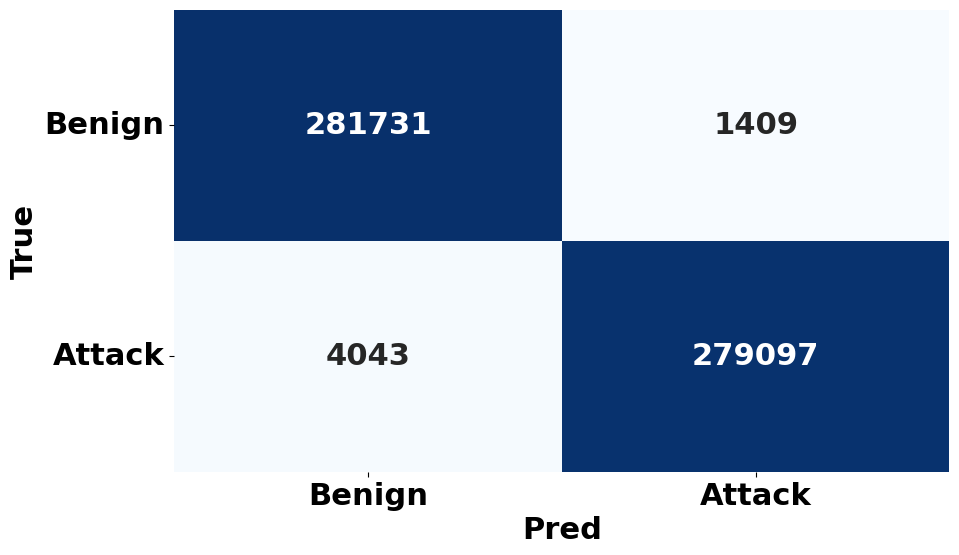

In [55]:
xgb_cm = metrics.confusion_matrix(y_test, xgb_predicted_values)

fig, ax = plt.subplots()
sn.heatmap(xgb_cm, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues,
            cbar=False)
ax.set(xlabel="Pred", ylabel="True", xticklabels=unique_classes,
       yticklabels=unique_classes)
plt.rcParams["figure.figsize"] = (10,6)
plt.yticks(rotation=0)
plt.rcParams.update({'font.size': 22,'font.weight':'bold'})
plt.show()


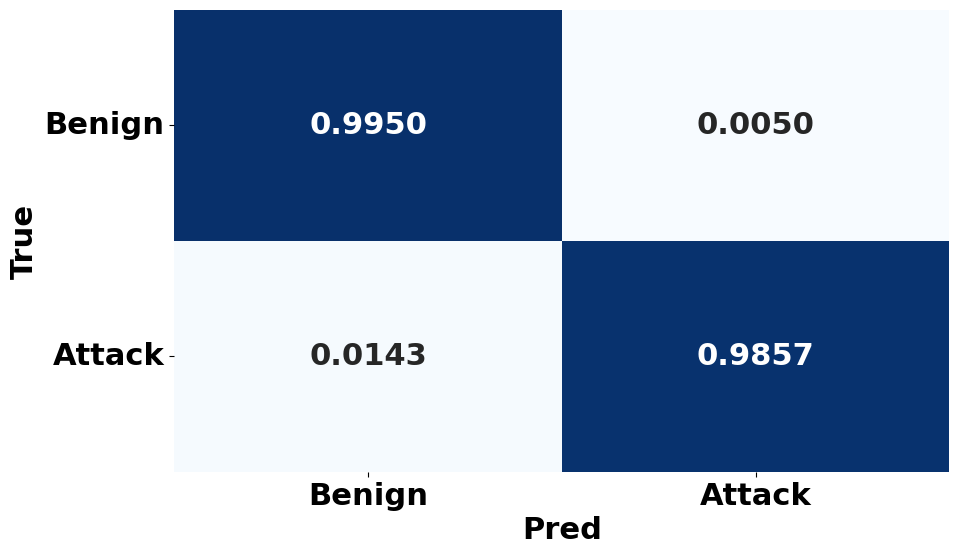

In [56]:
cm = xgb_cm.astype('float') / xgb_cm.sum(axis=1)[:, np.newaxis]

fig, ax = plt.subplots()
sn.heatmap(cm, annot=True, fmt='.4f', xticklabels=unique_classes,
       yticklabels=unique_classes, cmap=plt.cm.Blues,
            cbar=False)
plt.rcParams["figure.figsize"] = (10,6)
plt.yticks(rotation=0)
plt.ylabel('True')
plt.xlabel('Pred')
plt.show(block=False)

False Positive Rate (FPR): 0.0050
False Negative Rate (FNR): 0.0143


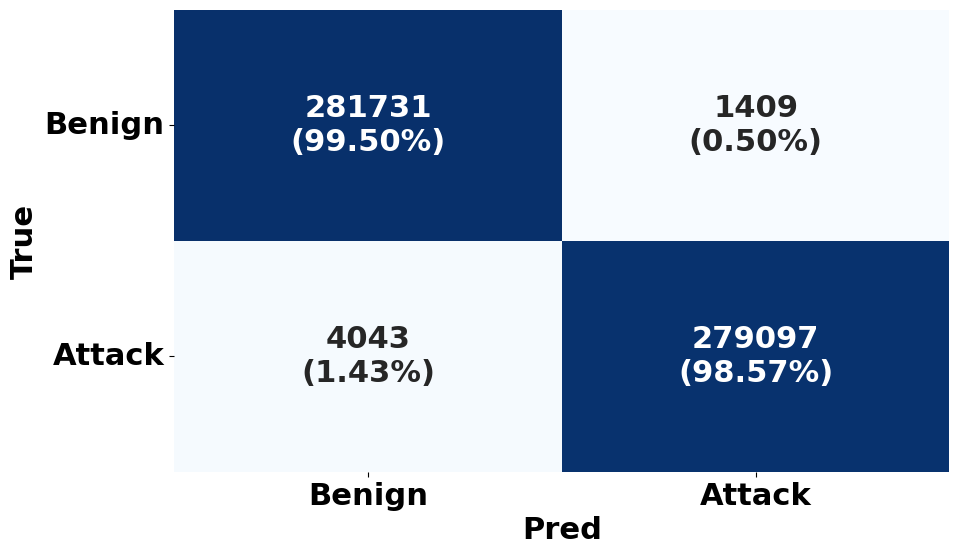

In [57]:
def calculate_fpr_fnr(confusion_matrix):
    """
    Calculate and print the False Positive Rate (FPR) and False Negative Rate (FNR) from a confusion matrix.

    Parameters:
    - confusion_matrix: 2D array-like, the confusion matrix

    Returns:
    - FPR: False Positive Rate
    - FNR: False Negative Rate
    """
    # Extract TN, FP, FN, and TP from the confusion matrix
    TN, FP, FN, TP = confusion_matrix.ravel()

    # Calculate FPR and FNR
    FPR = FP / (FP + TN)
    FNR = FN / (FN + TP)

    # Print FPR and FNR
    print(f"False Positive Rate (FPR): {FPR:.4f}")
    print(f"False Negative Rate (FNR): {FNR:.4f}")
    
    return FPR, FNR



# Confusion matrix values
# xgb_cm = np.array([[219483, 265], [1122, 218626]])

calculate_fpr_fnr(xgb_cm)

# Calculate normalized values for each cell
normalized_cm = xgb_cm.astype('float') / xgb_cm.sum(axis=1)[:, np.newaxis]

# Combine values and normalized values into one string for annotation
annot = np.empty_like(xgb_cm).astype(str)
for i in range(xgb_cm.shape[0]):
    for j in range(xgb_cm.shape[1]):
        annot[i, j] = f"{xgb_cm[i, j]}\n({normalized_cm[i, j]:.2%})"

fig, ax = plt.subplots()
sn.heatmap(xgb_cm, annot=annot, fmt='', ax=ax, cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", xticklabels=unique_classes, yticklabels=unique_classes)
plt.rcParams["figure.figsize"] = (10, 6)
plt.yticks(rotation=0)
plt.rcParams.update({'font.size': 22, 'font.weight': 'bold'})
plt.show()


In [58]:
# Get predicted probabilities for the positive class
y_prob = xgb_model.predict_proba(X_test)[:,1]

# Calculate Brier score for binary classification
brier_score_pos = metrics.brier_score_loss(y_test, y_prob)
print(f'Brier score (binary): {brier_score_pos:.4f}')

Brier score (binary): 0.0080


              precision    recall  f1-score   support

      Benign       0.93      0.99      0.96    283140
      Attack       0.99      0.93      0.96    283140

    accuracy                           0.96    566280
   macro avg       0.96      0.96      0.96    566280
weighted avg       0.96      0.96      0.96    566280

0.9601628169809988
0.9621325301775522
0.9601628169809988
0.9601203229338032
Brier score (binary): 0.0380


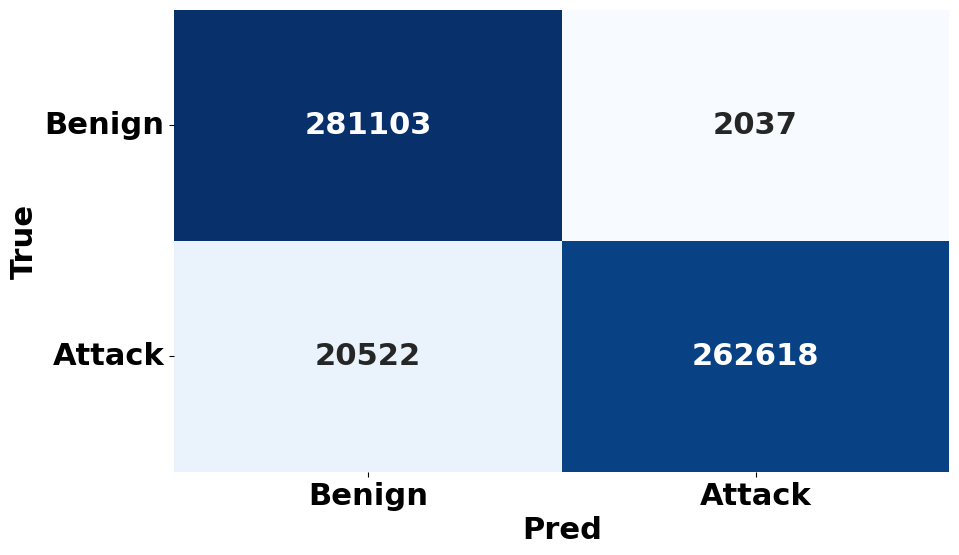

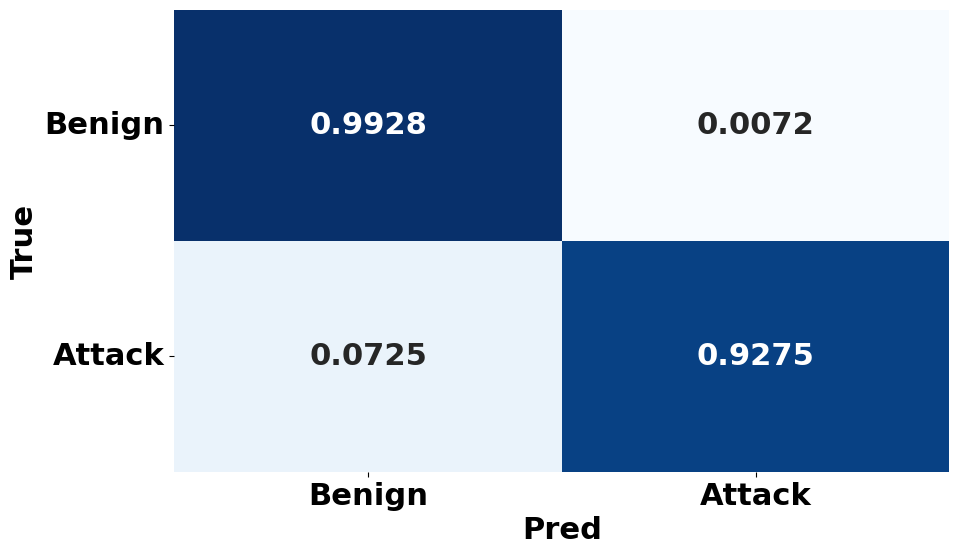

In [59]:
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier(max_depth=5, random_state=42)
rf_model = rf_clf.fit(X_train, y_train)
rf_predicted_values = rf_model.predict(X_test)


print(classification_report(y_test , rf_predicted_values, target_names=unique_classes))

print(metrics.accuracy_score(y_test, rf_predicted_values))
print(metrics.precision_score(y_test, rf_predicted_values, average='weighted'))
print(metrics.recall_score(y_test, rf_predicted_values, average='weighted'))
print(metrics.f1_score(y_test, rf_predicted_values, average='weighted'))


# Calculate multiclass Brier score
y_prob_rf = rf_clf.predict_proba(X_test)[:,1]
# Calculate Brier score for binary classification
brier_score_pos = metrics.brier_score_loss(y_test, y_prob_rf)
print(f'Brier score (binary): {brier_score_pos:.4f}')


rf_cm = metrics.confusion_matrix(y_test, rf_predicted_values)

fig, ax = plt.subplots()
sn.heatmap(rf_cm, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues,
            cbar=False)
ax.set(xlabel="Pred", ylabel="True", xticklabels=unique_classes,
       yticklabels=unique_classes)
plt.rcParams["figure.figsize"] = (10,6)
plt.yticks(rotation=0)
plt.rcParams.update({'font.size': 22,'font.weight':'bold'})
plt.show()


cm = rf_cm.astype('float') / rf_cm.sum(axis=1)[:, np.newaxis]

fig, ax = plt.subplots()
sn.heatmap(cm, annot=True, fmt='.4f', xticklabels=unique_classes,
       yticklabels=unique_classes, cmap=plt.cm.Blues,
            cbar=False)
plt.rcParams["figure.figsize"] = (10,6)
plt.yticks(rotation=0)
plt.ylabel('True')
plt.xlabel('Pred')
plt.show(block=False)

              precision    recall  f1-score   support

      Benign       0.94      0.97      0.96    283140
      Attack       0.97      0.94      0.96    283140

    accuracy                           0.96    566280
   macro avg       0.96      0.96      0.96    566280
weighted avg       0.96      0.96      0.96    566280

0.9572896800169527
0.957658517540777
0.9572896800169527
0.9572810729755342
Brier score (binary): 0.0310


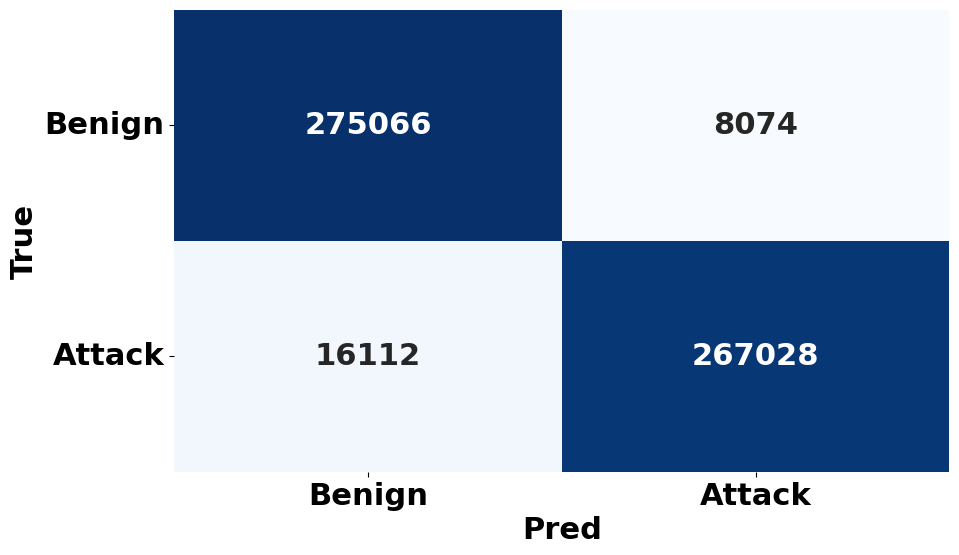

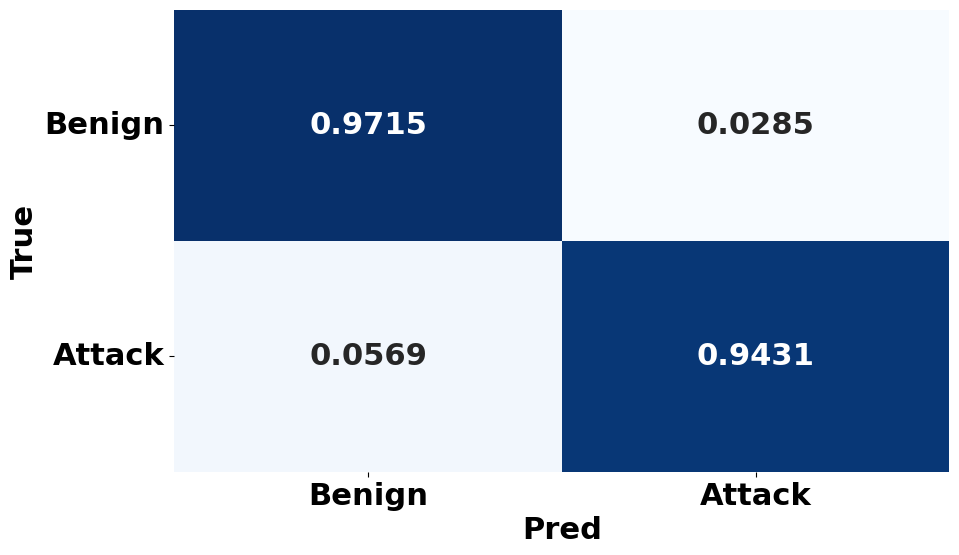

In [60]:
from sklearn.tree import DecisionTreeClassifier

dt_clf = DecisionTreeClassifier(max_depth=5, random_state=42)
dt_model = dt_clf.fit(X_train, y_train)
dt_predicted_values = dt_model.predict(X_test)


print(classification_report(y_test , dt_predicted_values, target_names=unique_classes))

print(metrics.accuracy_score(y_test, dt_predicted_values))
print(metrics.precision_score(y_test, dt_predicted_values, average='weighted'))
print(metrics.recall_score(y_test, dt_predicted_values, average='weighted'))
print(metrics.f1_score(y_test, dt_predicted_values, average='weighted'))



# Calculate multiclass Brier score
y_prob_dt = dt_clf.predict_proba(X_test)[:,1]
# Calculate Brier score for binary classification
brier_score_pos = metrics.brier_score_loss(y_test, y_prob_dt)
print(f'Brier score (binary): {brier_score_pos:.4f}')



dt_cm = metrics.confusion_matrix(y_test, dt_predicted_values)

fig, ax = plt.subplots()
sn.heatmap(dt_cm, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues,
            cbar=False)
ax.set(xlabel="Pred", ylabel="True", xticklabels=unique_classes,
       yticklabels=unique_classes)
plt.rcParams["figure.figsize"] = (10,6)
plt.yticks(rotation=0)
plt.rcParams.update({'font.size': 22,'font.weight':'bold'})
plt.show()



cm = dt_cm.astype('float') / dt_cm.sum(axis=1)[:, np.newaxis]

fig, ax = plt.subplots()
sn.heatmap(cm, annot=True, fmt='.4f', xticklabels=unique_classes,
       yticklabels=unique_classes, cmap=plt.cm.Blues,
            cbar=False)
plt.rcParams["figure.figsize"] = (10,6)
plt.yticks(rotation=0)
plt.ylabel('True')
plt.xlabel('Pred')
plt.show(block=False)


In [8]:
# from sklearn.model_selection import cross_val_score, StratifiedKFold
# # from sklearn.model_selection import cross_val_score, KFold

In [9]:
# X, y = data[data.columns[:-3]], data.Label

In [10]:
# X.head()

,L4_SRC_PORT,L4_DST_PORT,PROTOCOL,L7_PROTO,IN_BYTES,IN_PKTS,OUT_BYTES,OUT_PKTS,TCP_FLAGS,CLIENT_TCP_FLAGS,...,NUM_PKTS_512_TO_1024_BYTES,NUM_PKTS_1024_TO_1514_BYTES,TCP_WIN_MAX_IN,TCP_WIN_MAX_OUT,ICMP_TYPE,ICMP_IPV4_TYPE,DNS_QUERY_ID,DNS_QUERY_TYPE,DNS_TTL_ANSWER,FTP_COMMAND_RET_CODE
0,0.997772,0.001221,0.023529,0.028226,5.644426e-06,0.000010,0.000000e+00,0.000000,0.008969,0.008969,...,0.0,0.0,0.007813,0.0,0.54902,0.54902,0.0,0.0,0.0,0.0
1,0.170199,0.001221,0.023529,0.028226,3.753948e-06,0.000005,2.432072e-07,0.000009,0.098655,0.008969,...,0.0,0.0,0.007813,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0
2,0.641825,0.015885,0.023529,0.000000,5.671433e-07,0.000000,2.432072e-07,0.000009,0.098655,0.008969,...,0.0,0.0,0.015625,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0
3,0.714870,0.139010,0.023529,0.000000,5.671433e-07,0.000000,2.432072e-07,0.000009,0.098655,0.008969,...,0.0,0.0,0.015625,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0
4,0.768444,0.016541,0.023529,0.000000,5.671433e-07,0.000000,2.432072e-07,0.000009,0.098655,0.008969,...,0.0,0.0,0.015625,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0


In [11]:
# num_folds = 5
# # kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)
# skf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

In [ ]:
# cross_val_results = cross_val_score(xgb_model, X, y, cv=kf)
# print(f'Cross-Validation Results (Accuracy): {cross_val_results}')
# print(f'Mean Accuracy: {cross_val_results.mean()}')

# # Cross-Validation Results (Accuracy): [0.92957607 0.92895476 0.93093574 0.92964747 0.92960245]
# # Mean Accuracy: 0.9297432993263242

In [12]:
# st_cross_val_results = cross_val_score(xgb_classifier, X, y, cv=skf)
# print(f'Stratified Cross-Validation Results (Accuracy): {st_cross_val_results}')
# print(f'Mean Accuracy: {st_cross_val_results.mean()}')

# # Stratified Cross-Validation Results (Accuracy): [0.98920439 0.9894686  0.98907812 0.98918918 0.98954576]
# # Mean Accuracy: 0.9892972117270782

Stratified Cross-Validation Results (Accuracy): [0.98920439 0.9894686  0.98907812 0.98918918 0.98954576]
Mean Accuracy: 0.9892972117270782


In [61]:
# tp_instances = np.where((y_test == 1) & (xgb_predicted_values == 1))[0]
# tn_instances = np.where((y_test == 0) & (xgb_predicted_values == 0))[0]
# fp_instances = np.where((y_test == 0) & (xgb_predicted_values == 1))[0]
# fn_instances = np.where((y_test == 1) & (xgb_predicted_values == 0))[0]

tp_instances, tn_instances, fp_instances, fn_instances = [],[],[],[]

for i in range(len(y_test)):
    if y_test[i]==1:
        if xgb_predicted_values[i]==1:
            tp_instances.append(i)
        else:
            fn_instances.append(i)
    
    else:
        if xgb_predicted_values[i]==0:
            tn_instances.append(i)
        else:
            fp_instances.append(i)

In [62]:
print(len(tp_instances), len(tn_instances), len(fp_instances),len(fn_instances))

279097 281731 1409 4043


In [63]:
print(len([x for x in y_prob[tp_instances] if x>=0.70])*100/len(tp_instances))
print(len([x for x in y_prob[tn_instances] if x<=0.30])*100/len(tn_instances))
print(len([x for x in y_prob[fp_instances] if x>=0.70])*100/len(fp_instances))
print(len([x for x in y_prob[fn_instances] if x<=0.30])*100/len(fn_instances))

99.44463752745462
99.23331120820924
53.867991483321504
67.5488498639624


In [64]:
print(len([x for x in y_prob[tp_instances] if x>=0.75])*100/len(tp_instances))
print(len([x for x in y_prob[tn_instances] if x<=0.25])*100/len(tn_instances))
print(len([x for x in y_prob[fp_instances] if x>=0.75])*100/len(fp_instances))
print(len([x for x in y_prob[fn_instances] if x<=0.25])*100/len(fn_instances))

99.22894190908538
98.92344115486048
44.28672817601136
62.82463517190205


In [65]:
print(len([x for x in y_prob[tp_instances] if x>=0.80])*100/len(tp_instances))
print(len([x for x in y_prob[tn_instances] if x<=0.20])*100/len(tn_instances))
print(len([x for x in y_prob[fp_instances] if x>=0.80])*100/len(fp_instances))
print(len([x for x in y_prob[fn_instances] if x<=0.20])*100/len(fn_instances))

98.99389817876938
98.45703880652111
36.40880056777856
56.17116002968093


In [66]:
print(len([x for x in y_prob[tp_instances] if x>=0.85])*100/len(tp_instances))
print(len([x for x in y_prob[tn_instances] if x<=0.15])*100/len(tn_instances))
print(len([x for x in y_prob[fp_instances] if x>=0.85])*100/len(fp_instances))
print(len([x for x in y_prob[fn_instances] if x<=0.15])*100/len(fn_instances))

98.39016542635714
97.38118985841103
28.459900638750888
43.63096710363591


In [67]:
print(len([x for x in y_prob[tp_instances] if x>=0.9])*100/len(tp_instances))
print(len([x for x in y_prob[tn_instances] if x<=0.1])*100/len(tn_instances))
print(len([x for x in y_prob[fp_instances] if x>=0.9])*100/len(fp_instances))
print(len([x for x in y_prob[fn_instances] if x<=0.1])*100/len(fn_instances))

97.52666635614142
94.22960199623044
19.801277501774308
20.776651001731388


In [68]:
def plot_overlapping_shap(shap_values_instance1, shap_values_instance2, feature_names, feature_values, label_exp, raw_prediction_prob=None, pred_val=None, color_instance1=None, color_instance2=None, bar_width1=0.75, bar_width2=0.9):
    """
    Plot two overlapping SHAP bar plots for two instances.

    Parameters:
    - shap_values_instance1: 1D array-like, SHAP values for the first instance.
    - shap_values_instance2: 1D array-like, SHAP values for the second instance.
    - feature_names: list of feature names.
    - feature_values: list of feature values.
    - label_exp: label for the second instance.
    - raw_prediction_prob: Probability of the prediction to be displayed as text.
    - pred_val: Prediction value to be displayed as text.
    - color_instance1: tuple or list of colors for the first instance, default to bright colors.
    - color_instance2: tuple or list of colors for the second instance, default to transparent colors.
    - bar_width1: width of the bars for the first instance.
    - bar_width2: width of the bars for the second instance.
    """
    
    light_red, light_green = (1.0, 0.71, 0.71, 0.5), (0.56, 0.93, 0.56, 0.5)  # Light orange

    # Default colors
    if color_instance1 is None:
        color_instance1 = ['deepskyblue' if v < 0 else 'deeppink' for v in shap_values_instance1]
    if color_instance2 is None:
        color_instance2 = [light_green if v < 0 else light_red for v in shap_values_instance2]

    # Convert inputs to numpy arrays
    shap_values_instance1 = np.array(shap_values_instance1)
    shap_values_instance2 = np.array(shap_values_instance2)
    
    # Ensure the inputs are of the same length
    assert len(shap_values_instance1) == len(shap_values_instance2) == len(feature_names) == len(feature_values), \
        "All inputs must have the same length"

    # Create y-tick labels with feature values
    feature_labels = [f"{name} = {round(value, 4)}" for name, value in zip(feature_names, feature_values)]

    # Plotting
    fig, ax = plt.subplots()

    # Bar plot for the first instance
    bar1 = ax.barh(np.arange(len(feature_names)), shap_values_instance1, height=bar_width1, color=color_instance1, label='Instance 1')

    # Bar plot for the second instance with different width and transparency
    bar2 = ax.barh(np.arange(len(feature_names)), shap_values_instance2, height=bar_width2, color=color_instance2, label=label_exp)

    # Adding feature names with values as y-axis labels
    ax.set_yticks(np.arange(len(feature_names)))
    ax.set_yticklabels(feature_labels)

    # Adding labels and title
    ax.set_xlabel('SHAP value')

    # Add text for raw_prediction_prob and pred_val if provided
    title_text = ""
    if pred_val is not None:
        if int(pred_val) == 0:
            if raw_prediction_prob is not None:
                title_text += f"Raw Prediction Probability: {1-raw_prediction_prob:.3f}\n"
                title_text += f"Prediction Value: {pred_val:.0f}"
        else:
            if raw_prediction_prob is not None:
                title_text += f"Raw Prediction Probability: {raw_prediction_prob:.3f}\n"
                title_text += f"Prediction Value: {pred_val:.0f}"
    plt.title(title_text.strip())

    # Custom legend
    legend_elements = [
        Patch(facecolor='deeppink', edgecolor='deeppink', label='Instance 1 (positive)'),
        Patch(facecolor='deepskyblue', edgecolor='deepskyblue', label='Instance 1 (negative)'),
        Patch(facecolor=light_red, edgecolor=light_red, label=f'{label_exp} (positive)'),
        Patch(facecolor=light_green, edgecolor=light_green, label=f'{label_exp} (negative)')
    ]
    ax.legend(handles=legend_elements)
    
    # plt.show()


In [69]:
def top_20_features(shap_value_group):
    abs_shap_values = np.abs(shap_value_group)
    top_20_indices = np.argsort(abs_shap_values)[-20:]
    
    # Sort these indices based on the original absolute values in ascending order
    sorted_top_20_indices = top_20_indices[np.argsort(abs_shap_values[top_20_indices])]
    
    return sorted_top_20_indices

In [70]:
feature_names = train_data.columns

In [71]:
tp_tn_random_size = 100000
fp_fn_random_size = 1000

random_tp_instances = X_test[np.random.choice(tp_instances, size=tp_tn_random_size, replace=False)]
random_tn_instances = X_test[np.random.choice(tn_instances, size=tp_tn_random_size, replace=False)]
random_fp_instances = X_test[np.random.choice(fp_instances, size=len(fp_instances), replace=False)]
random_fn_instances = X_test[np.random.choice(fn_instances, size=len(fn_instances), replace=False)]

In [72]:
explainer = shap.TreeExplainer(xgb_classifier, X_train)
tp_shap_values = explainer(random_tp_instances,check_additivity=False)

100%|===================| 99738/100000 [03:30<00:00]        

In [73]:
tp_shap_values.feature_names = feature_names

In [74]:
tp_shap_values.shape

(100000, 41)

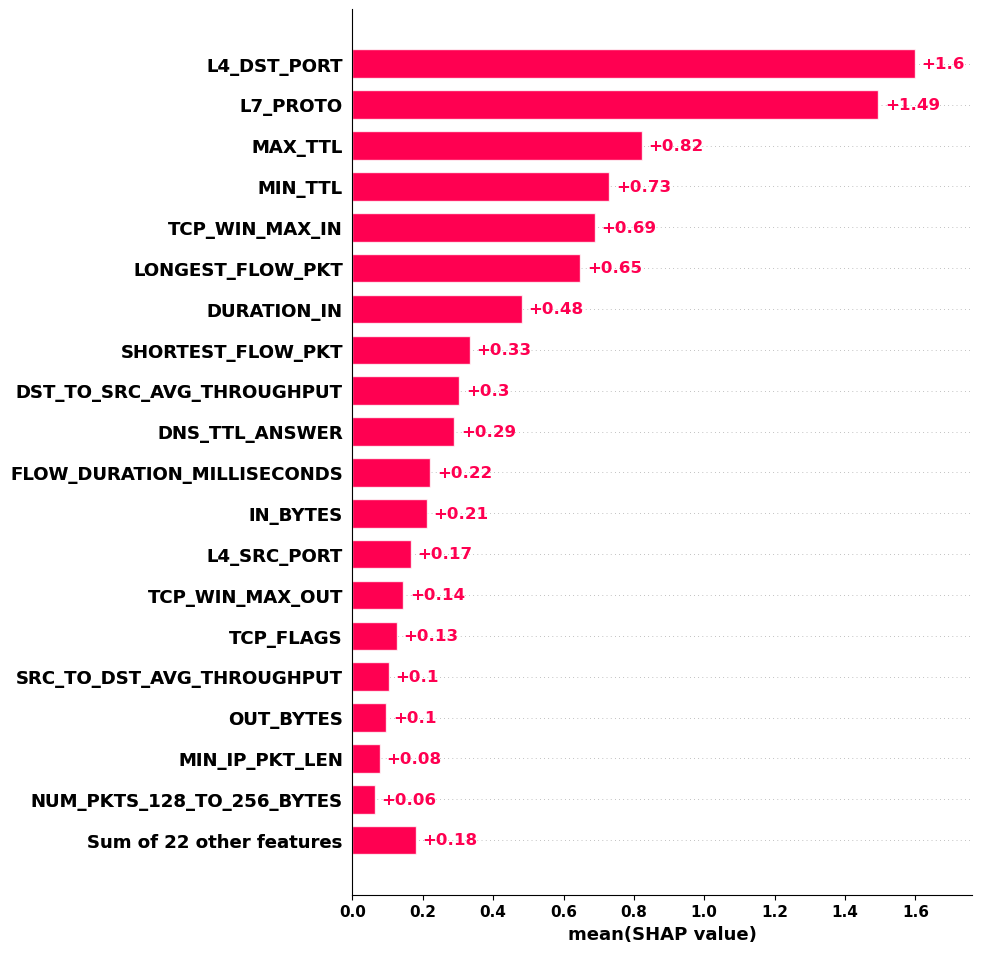

In [75]:
shap.plots.bar(tp_shap_values.mean(0),max_display=20)

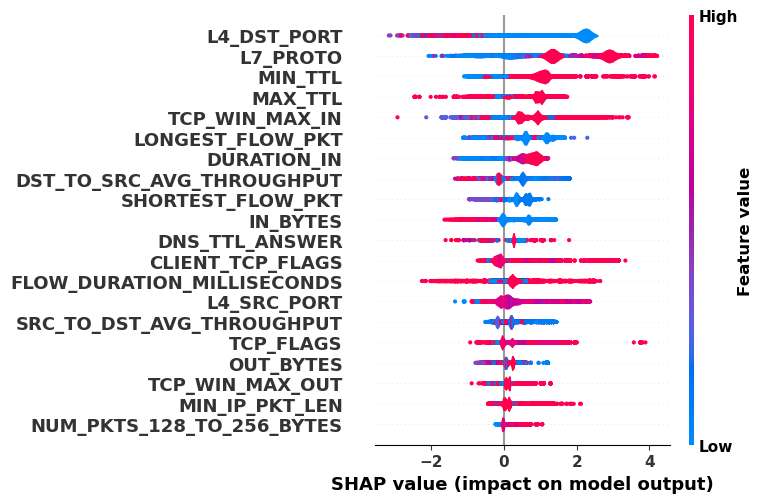

In [76]:
shap.summary_plot(tp_shap_values, plot_type="violin", class_names=unique_classes, plot_size=0.2,max_display=20)

In [ ]:
# randi = [random.randrange(tp_tn_random_size-1) for i in range(3)]

# for i in randi:
#     shap.plots.waterfall(tp_shap_values[i],max_display=15)

In [79]:
tp_shap_values_mean = tp_shap_values.values.mean(0)
tp_top_20_features = top_20_features(tp_shap_values_mean)
tp_top_20_features

array([28, 29, 18,  6, 26,  8, 34,  0,  4, 11, 39, 27, 17, 12, 16, 33, 14,
       15,  3,  1])

23680


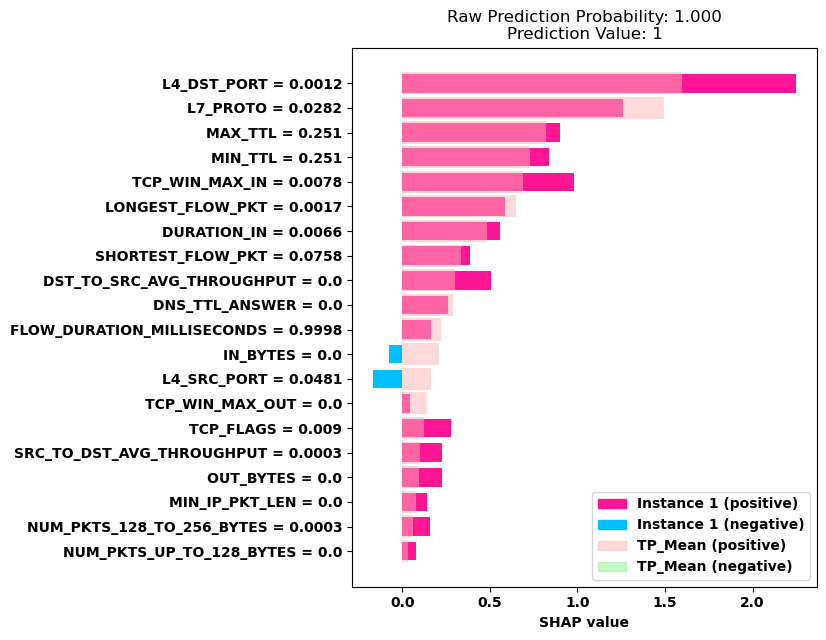

In [82]:
# tp_random_case = tp_shap_values[random.randrange(tp_tn_random_size-1)]
# # top_20_indices = lambda array: np.argsort(np.abs(array))[-20:]
# # tp_top_20_features = top_20_indices(tp_random_case.values)
# # print(tp_random_case[tp_top_20_features].values)
# # print(tp_random_case.values[tp_top_20_features])
# plot_overlapping_shap(tp_random_case.values[tp_top_20_features], tp_shap_values_mean[tp_top_20_features], feature_names[tp_top_20_features], tp_random_case.data[tp_top_20_features], 'TP_Mean')
# plt.rcParams["figure.figsize"] = (6,7)
# plt.yticks(rotation=0)
# plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
# plt.show()


# tp_random_case = tp_shap_values[random.randrange(tp_tn_random_size-1)]
rand_idx = random.choice(tp_instances)
print(rand_idx)
tp_random_case = explainer(X_test[rand_idx])
# top_20_indices = lambda array: np.argsort(np.abs(array))[-20:]
# tp_top_20_features = top_20_indices(tp_random_case.values)
# print(tp_random_case[tp_top_20_features].values)
# print(tp_random_case.values[tp_top_20_features])
plot_overlapping_shap(tp_random_case.values[tp_top_20_features], tp_shap_values_mean[tp_top_20_features], feature_names[tp_top_20_features], tp_random_case.data[tp_top_20_features], 'TP_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
plt.rcParams["figure.figsize"] = (6,7)
plt.yticks(rotation=0)
plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
plt.show()

In [83]:
tn_shap_values = explainer(random_tn_instances,check_additivity=False)

100%|===================| 99676/100000 [03:28<00:00]        

In [84]:
tn_shap_values.feature_names = feature_names

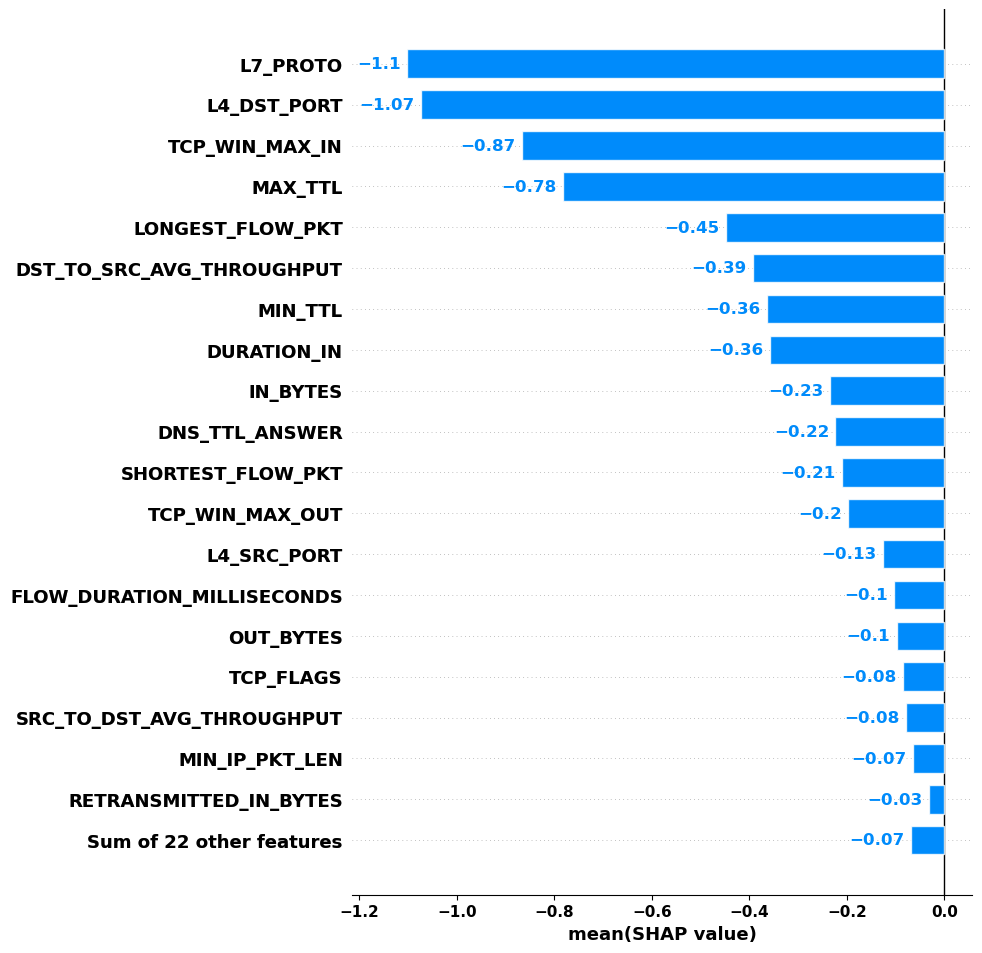

In [85]:
shap.plots.bar(tn_shap_values.mean(0),max_display=20)

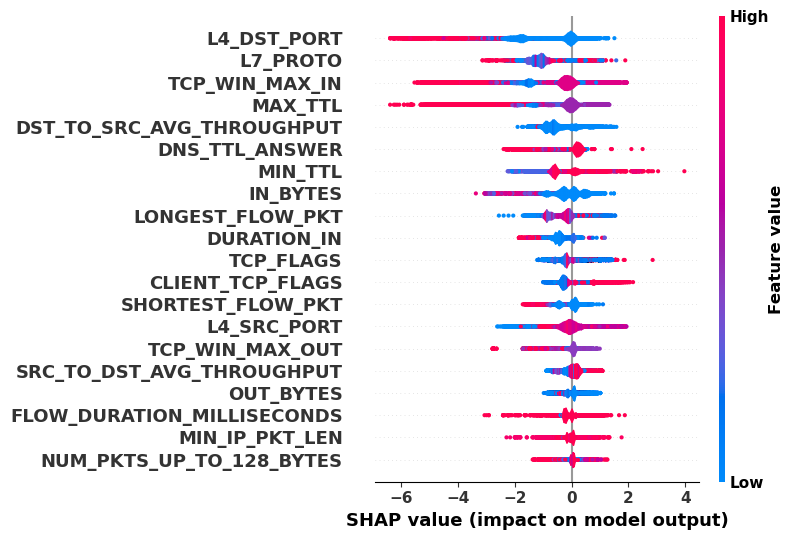

In [86]:
shap.summary_plot(tn_shap_values, plot_type="violin", class_names=unique_classes, plot_size=0.2,max_display=20)

In [ ]:
# randi = [random.randrange(tp_tn_random_size-1) for i in range(3)]

# for i in randi:
#     shap.plots.waterfall(tn_shap_values[i],max_display=15)

In [87]:
tn_shap_values_mean = tn_shap_values.values.mean(0)
tn_top_20_features = top_20_features(tn_shap_values_mean)
tn_top_20_features

array([29, 22, 18, 26,  8,  6, 11,  0, 34, 17, 39,  4, 12, 14, 27, 16, 15,
       33,  1,  3])

220308


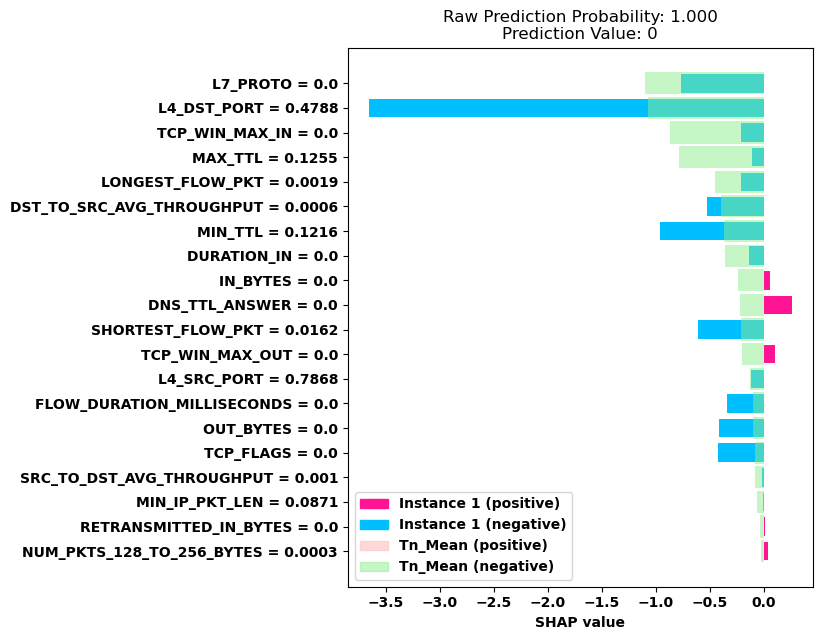

In [91]:
# tn_random_case = tn_shap_values[random.randrange(tp_tn_random_size-1)]
# # top_20_indices = lambda array: np.argsort(np.abs(array))[-20:]
# # tn_top_20_features = top_20_indices(tn_random_case.values)
# # print(tn_random_case[tn_top_20_features].values)
# # print(tn_random_case.values[tn_top_20_features])
# plot_overlapping_shap(tn_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], tn_random_case.data[tn_top_20_features], 'Tn_Mean')
# plt.rcParams["figure.figsize"] = (6,7)
# plt.yticks(rotation=0)
# plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
# plt.show()

# tn_random_case = tn_shap_values[random.randrange(tp_tn_random_size-1)]
rand_idx = random.choice(tn_instances)
print(rand_idx)
tn_random_case = explainer(X_test[rand_idx])
# top_20_indices = lambda array: np.argsort(np.abs(array))[-20:]
# tn_top_20_features = top_20_indices(tn_random_case.values)
# print(tn_random_case[tn_top_20_features].values)
# print(tn_random_case.values[tn_top_20_features])
plot_overlapping_shap(tn_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], tn_random_case.data[tn_top_20_features], 'Tn_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
plt.rcParams["figure.figsize"] = (6,7)
plt.yticks(rotation=0)
plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
plt.show()

In [92]:
fp_shap_values = explainer(random_fp_instances,check_additivity=False)

In [93]:
fp_shap_values.feature_names = feature_names

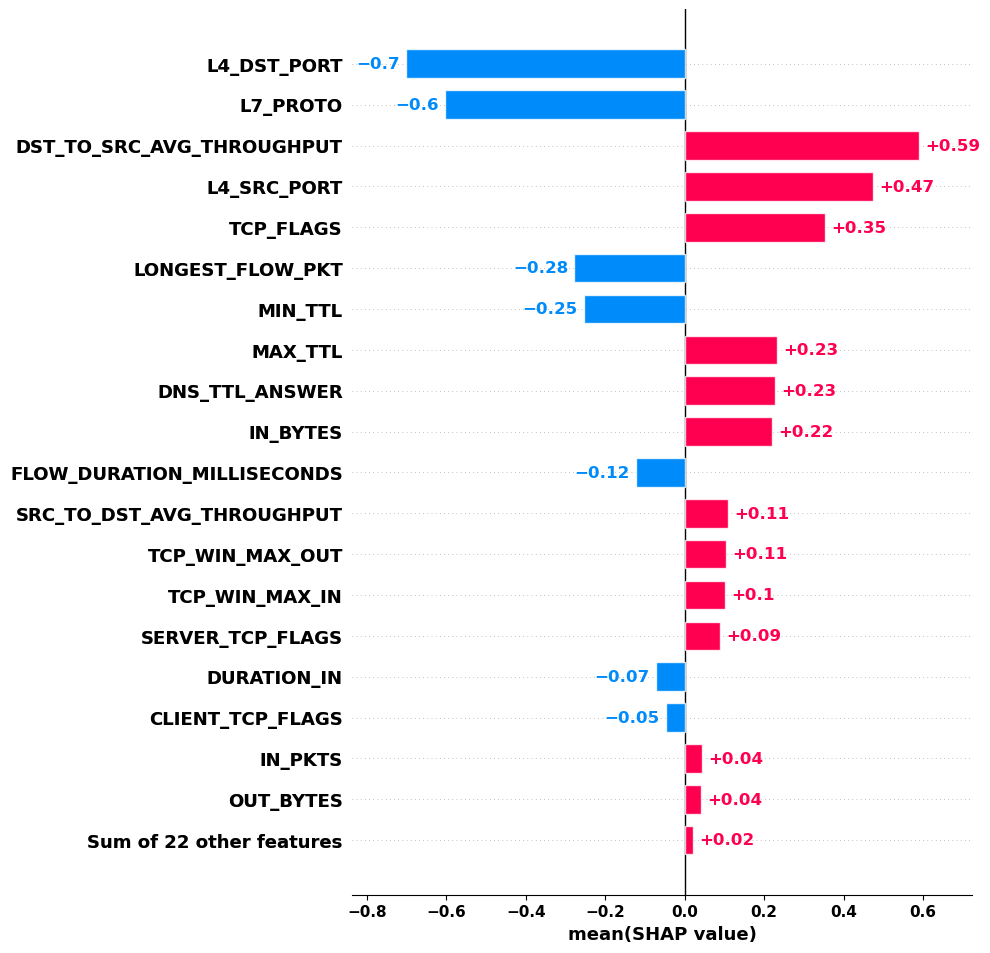

In [94]:
shap.plots.bar(fp_shap_values.mean(0),max_display=20)

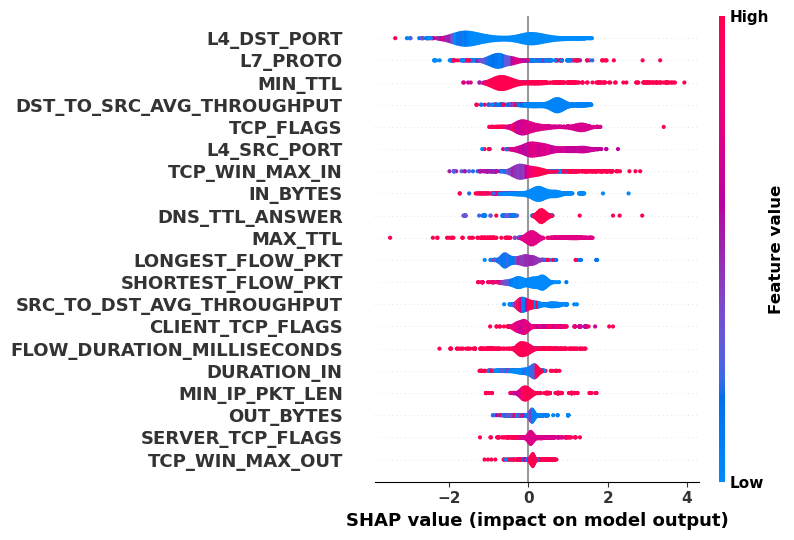

In [95]:
shap.summary_plot(fp_shap_values, plot_type="violin", class_names=unique_classes, plot_size=0.2,max_display=20)

In [ ]:
# randi = randi = [random.randrange(fp_fn_random_size-1) for i in range(3)]

# for i in randi:
#     shap.plots.waterfall(fp_shap_values[i],max_display=15)

In [96]:
fp_shap_values_mean = fp_shap_values.values.mean(0)
fp_top_20_features = top_20_features(fp_shap_values_mean)
fp_top_20_features

array([29,  6,  5,  9, 12, 10, 33, 34, 26, 11,  4, 39, 15, 14, 16,  8,  0,
       27,  3,  1])

384353


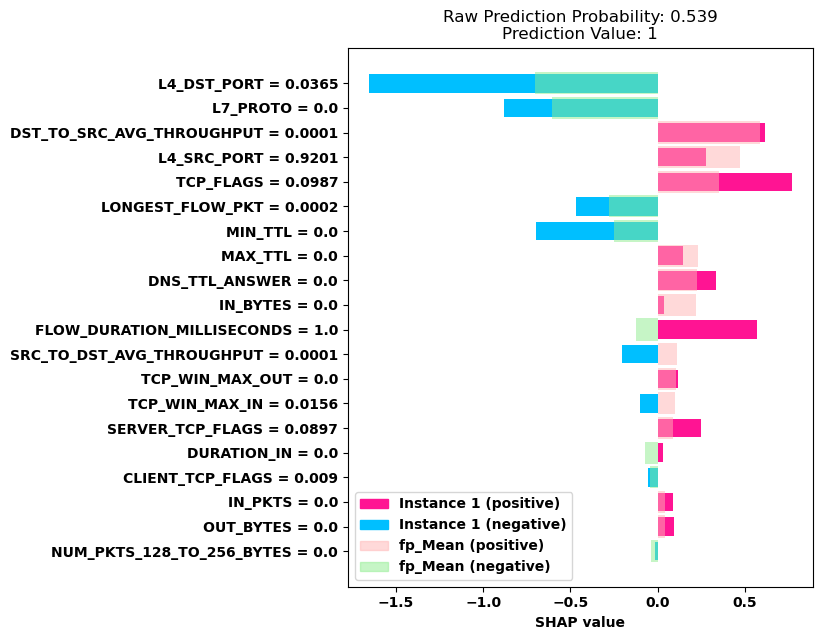

In [99]:
# fp_random_case = fp_shap_values[random.randrange(fp_fn_random_size-1)]
# # top_20_indices = lambda array: np.argsort(np.abs(array))[-20:]
# # fp_top_20_features = top_20_indices(fp_random_case.values)
# # print(fp_random_case[fp_top_20_features].values)
# # print(fp_random_case.values[fp_top_20_features])
# plot_overlapping_shap(fp_random_case.values[fp_top_20_features], fp_shap_values_mean[fp_top_20_features], feature_names[fp_top_20_features], fp_random_case.data[fp_top_20_features], 'fP_Mean')
# plt.rcParams["figure.figsize"] = (6,7)
# plt.yticks(rotation=0)
# plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
# plt.show()

# fp_random_case = fp_shap_values[random.randrange(fp_fn_random_size-1)]
rand_idx = random.choice(fp_instances)
print(rand_idx)
fp_random_case = explainer(X_test[rand_idx])
# top_20_indices = lambda array: np.argsort(np.abs(array))[-20:]
# fp_top_20_features = top_20_indices(fp_random_case.values)
# print(fp_random_case[fp_top_20_features].values)
# print(fp_random_case.values[fp_top_20_features])
plot_overlapping_shap(fp_random_case.values[fp_top_20_features], fp_shap_values_mean[fp_top_20_features], feature_names[fp_top_20_features], fp_random_case.data[fp_top_20_features], 'fp_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
plt.rcParams["figure.figsize"] = (6,7)
plt.yticks(rotation=0)
plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
plt.show()

In [100]:
fn_shap_values = explainer(random_fn_instances,check_additivity=False)

In [101]:
fn_shap_values.feature_names = feature_names

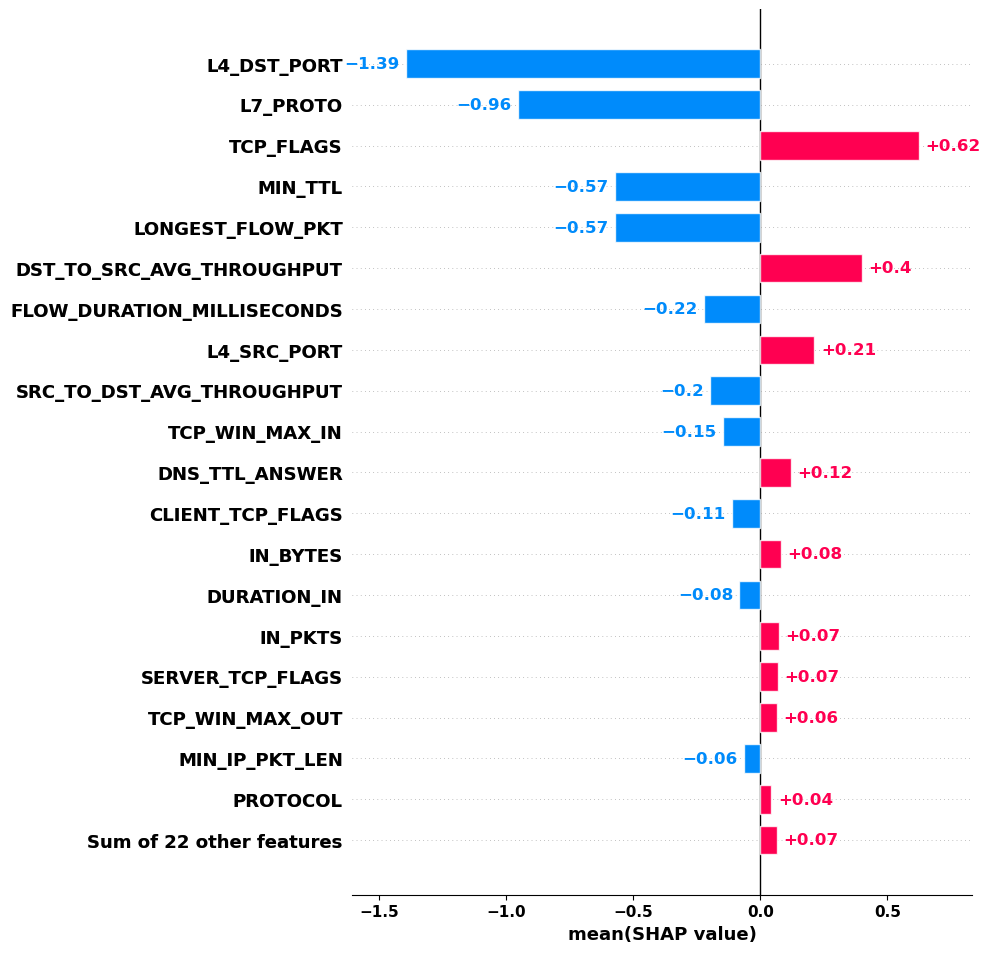

In [102]:
shap.plots.bar(fn_shap_values.mean(0),max_display=20)

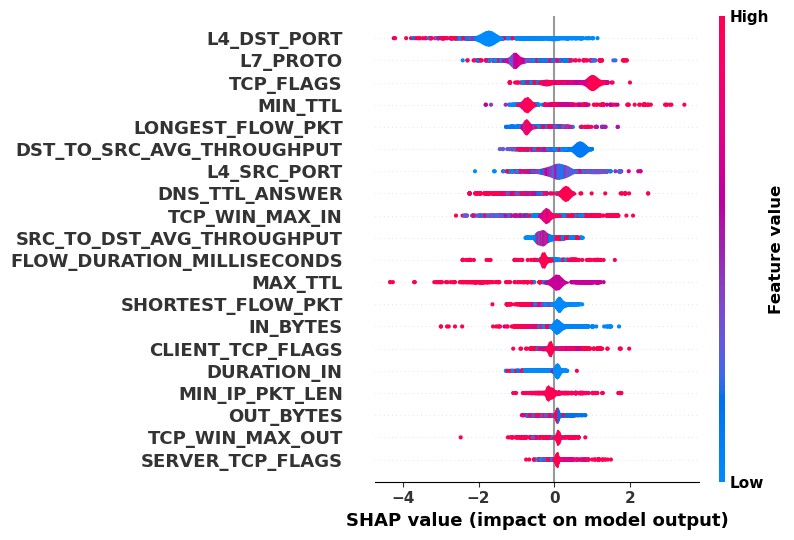

In [103]:
shap.summary_plot(fn_shap_values, plot_type="violin", class_names=unique_classes, plot_size=0.2,max_display=20)

In [ ]:
# randi = [random.randrange(fp_fn_random_size-1) for i in range(3)]

# for i in randi:
#     shap.plots.waterfall(fn_shap_values[i],max_display=15)

In [104]:
fn_shap_values_mean = fn_shap_values.values.mean(0)
fn_top_20_features = top_20_features(fn_shap_values_mean)
fn_top_20_features

array([17,  2, 18, 34, 10,  5, 12,  4,  9, 39, 33, 26,  0, 11, 27, 16, 14,
        8,  3,  1])

504407


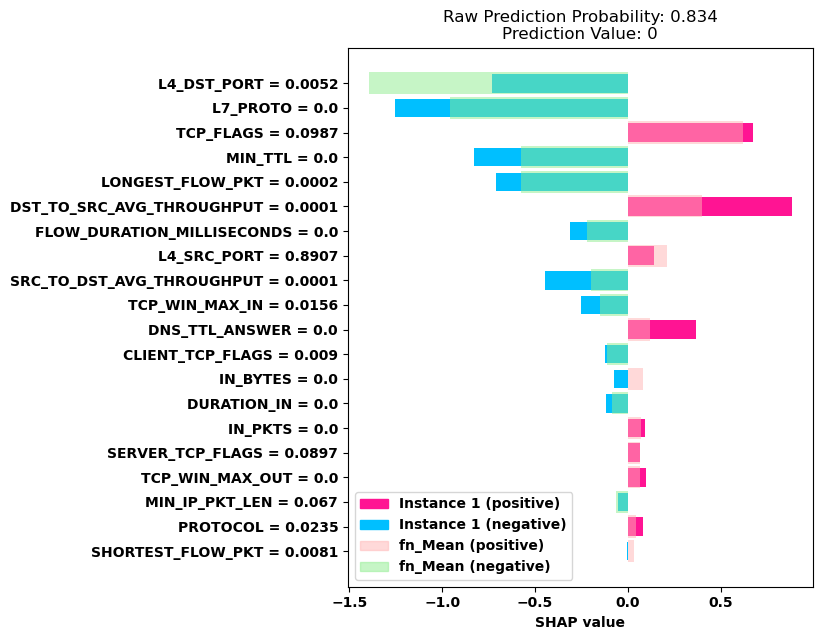

In [105]:
# fn_random_case = fn_shap_values[random.randrange(fp_fn_random_size-1)]
# # top_20_indices = lambda array: np.argsort(np.abs(array))[-20:]
# # fn_top_20_features = top_20_indices(fn_random_case.values)
# # print(fn_random_case[fn_top_20_features].values)
# # print(fn_random_case.values[fn_top_20_features])
# plot_overlapping_shap(fn_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], fn_random_case.data[fn_top_20_features], 'fn_Mean')
# plt.rcParams["figure.figsize"] = (6,7)
# plt.yticks(rotation=0)
# plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
# plt.show()


# fn_random_case = fn_shap_values[random.randrange(fp_fn_random_size-1)]
rand_idx = random.choice(fn_instances)
print(rand_idx)
fn_random_case = explainer(X_test[rand_idx])
# top_20_indices = lambda array: np.argsort(np.abs(array))[-20:]
# fn_top_20_features = top_20_indices(fn_random_case.values)
# print(fn_random_case[fn_top_20_features].values)
# print(fn_random_case.values[fn_top_20_features])
plot_overlapping_shap(fn_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], fn_random_case.data[fn_top_20_features], 'fn_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
plt.rcParams["figure.figsize"] = (6,7)
plt.yticks(rotation=0)
plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
plt.show()

------------------------------------------------------------------------------------------------------------------------------------------------------


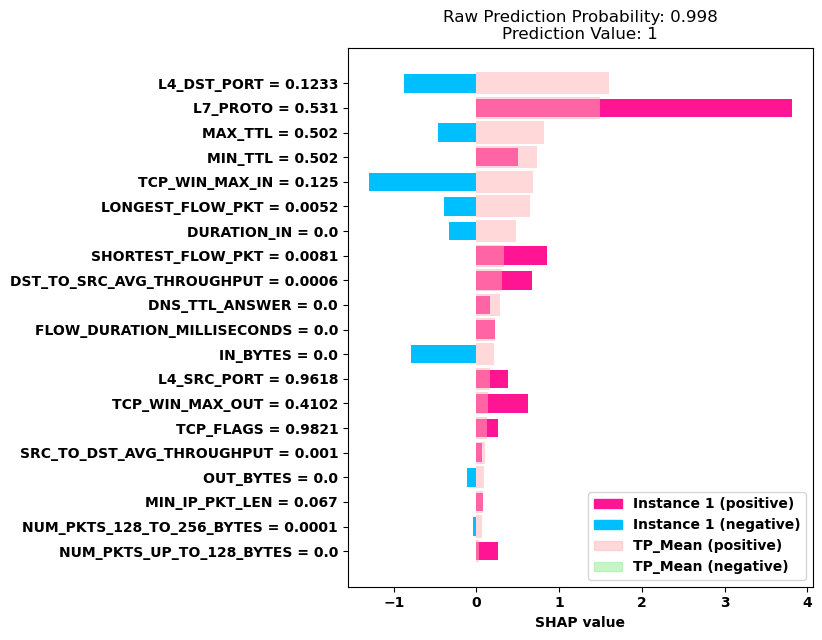

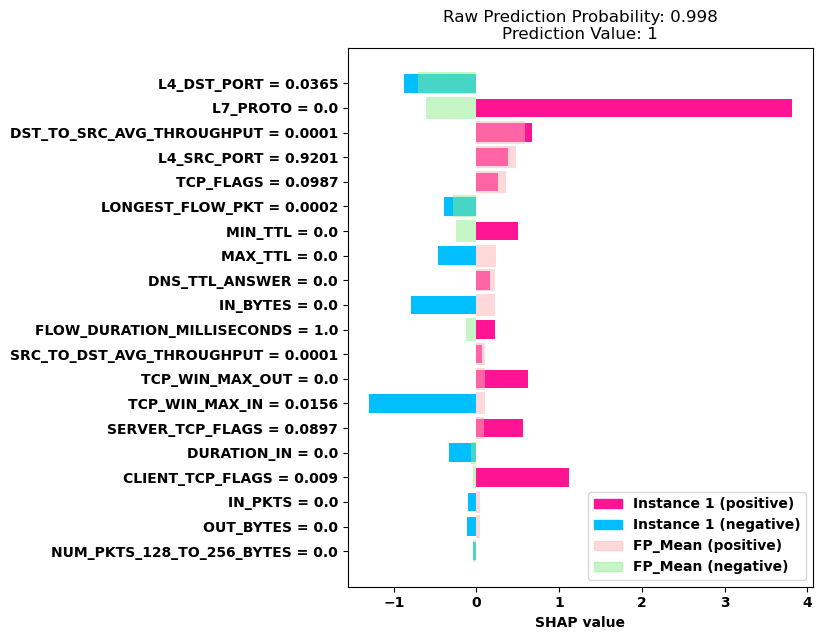

------------------------------------------------------------------------------------------------------------------------------------------------------


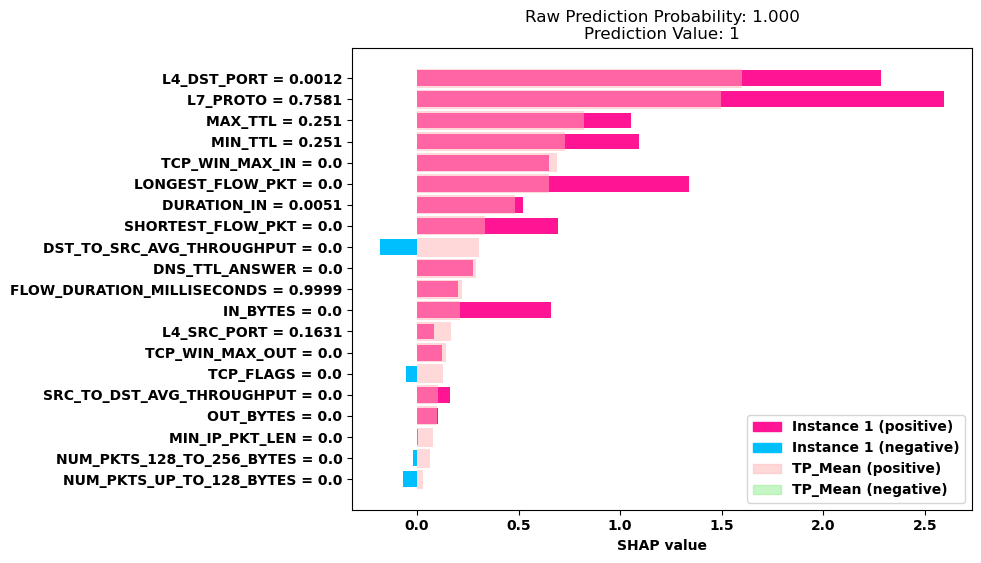

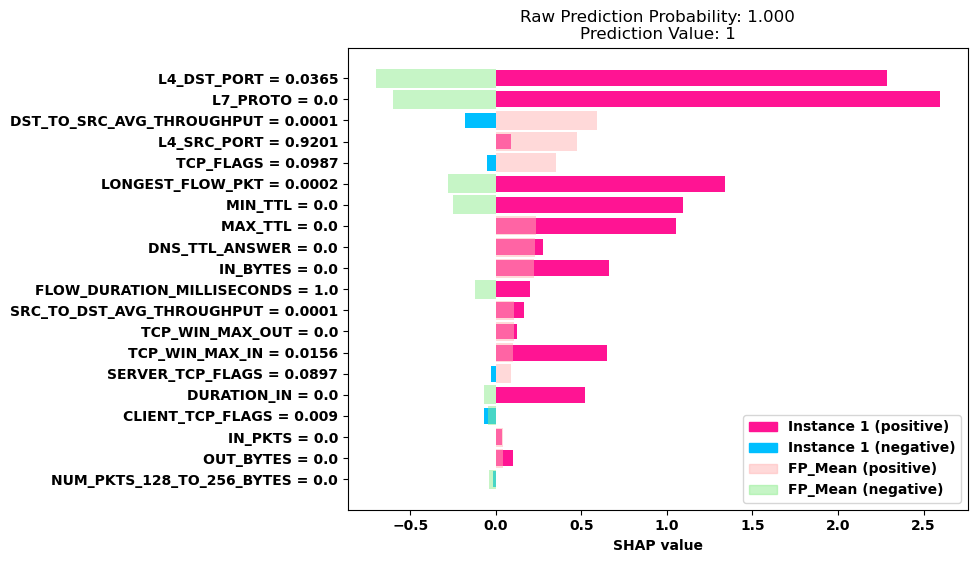

------------------------------------------------------------------------------------------------------------------------------------------------------


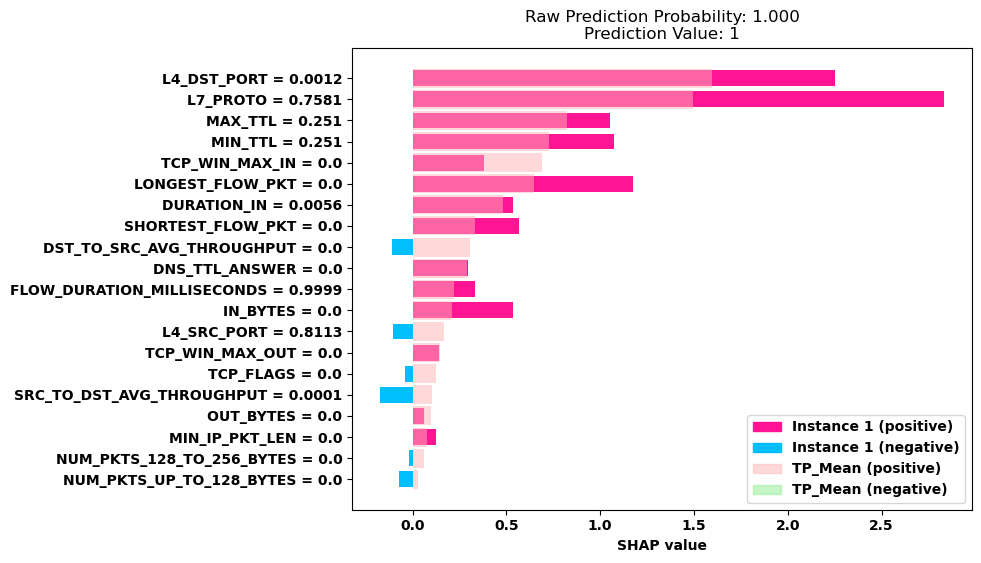

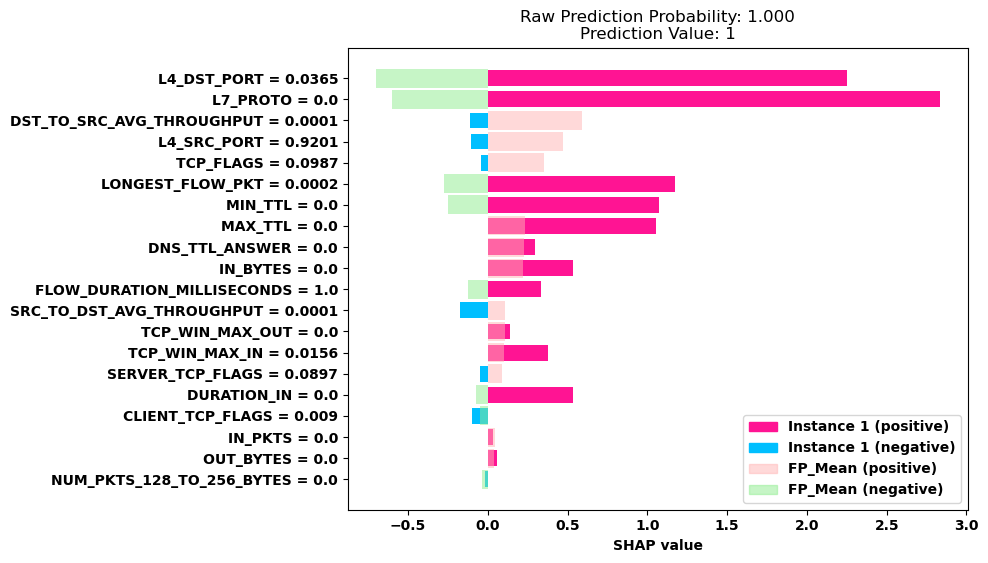

------------------------------------------------------------------------------------------------------------------------------------------------------


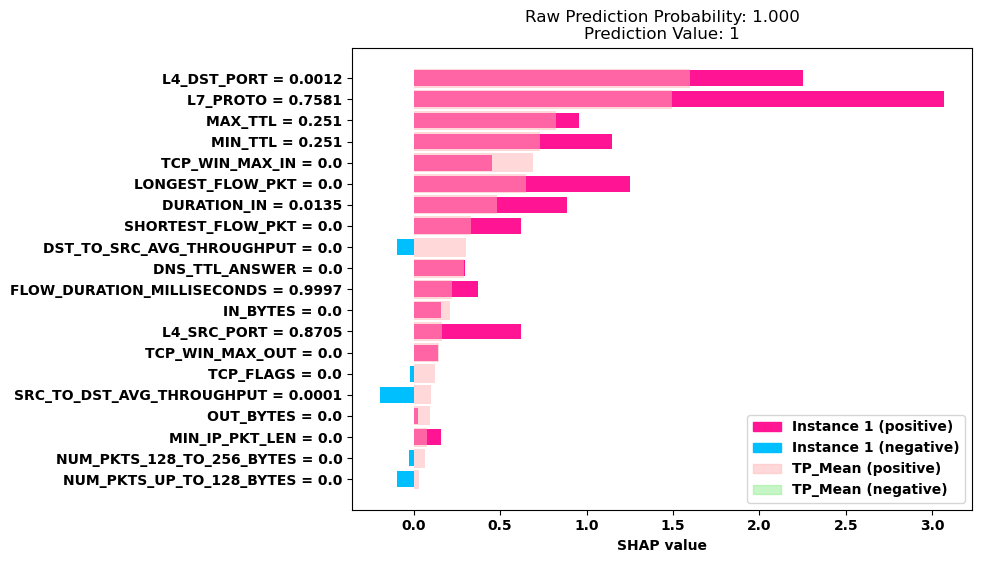

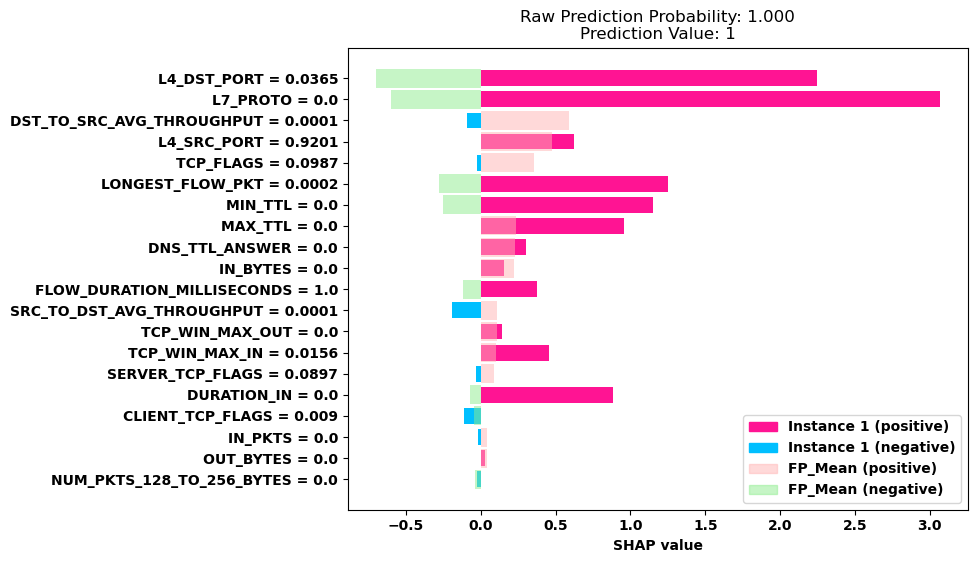

------------------------------------------------------------------------------------------------------------------------------------------------------


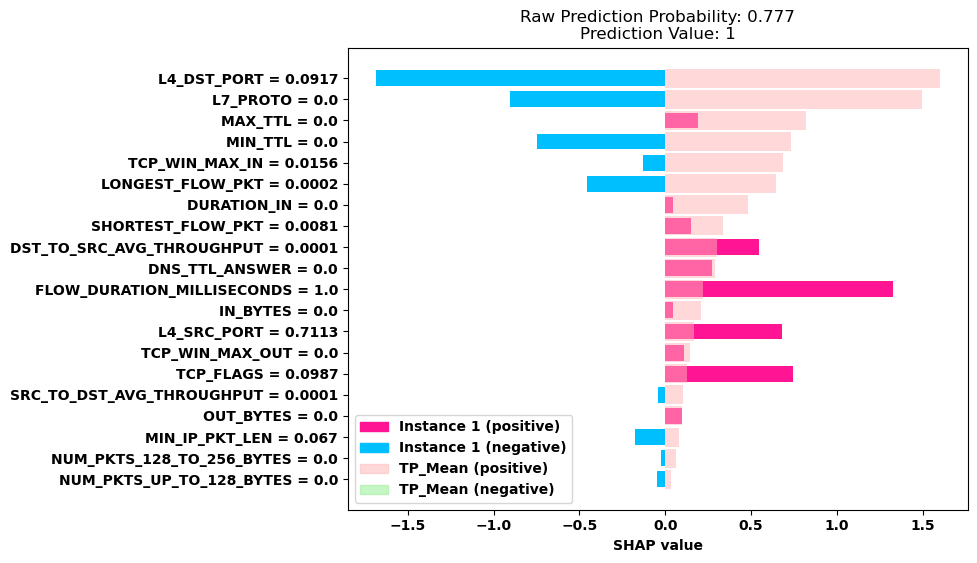

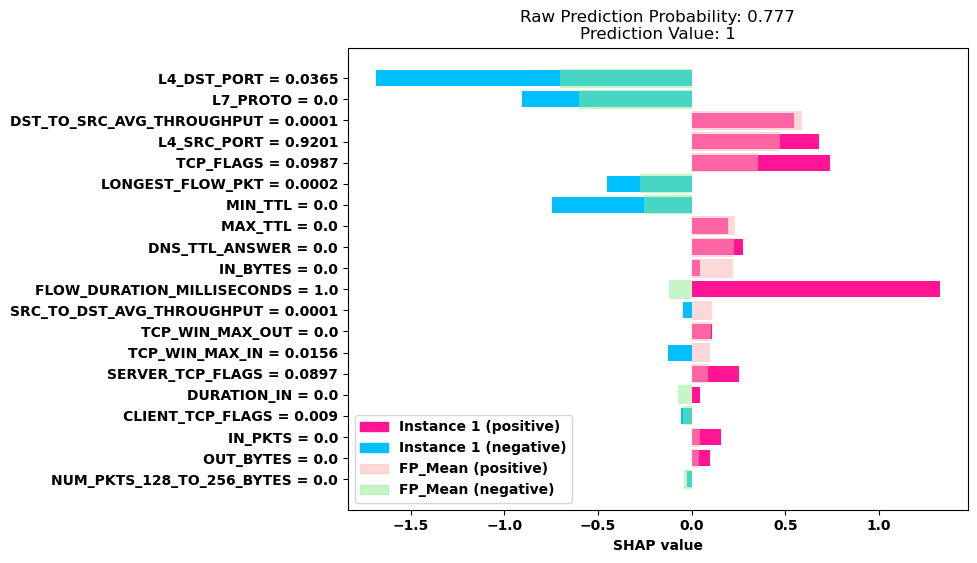

------------------------------------------------------------------------------------------------------------------------------------------------------


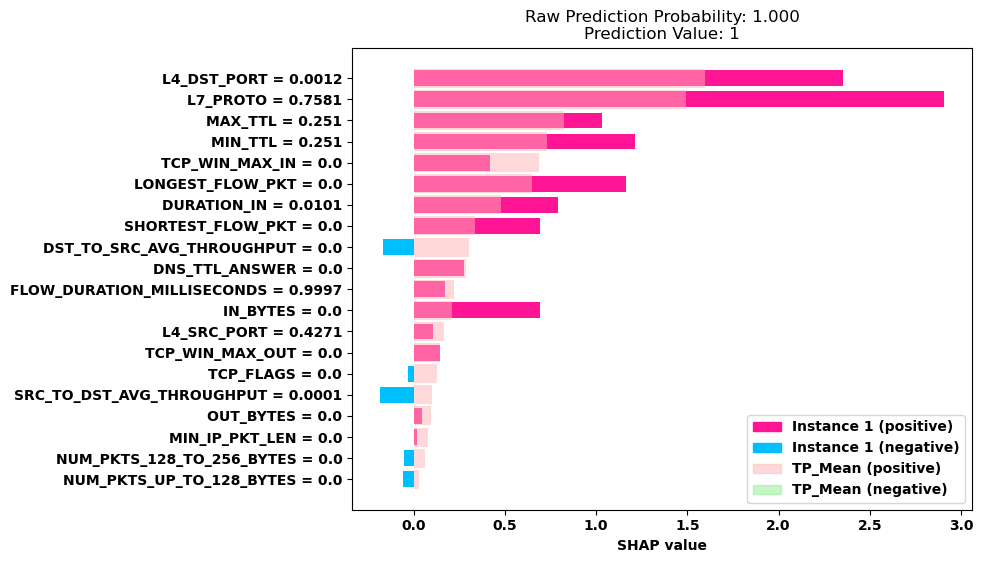

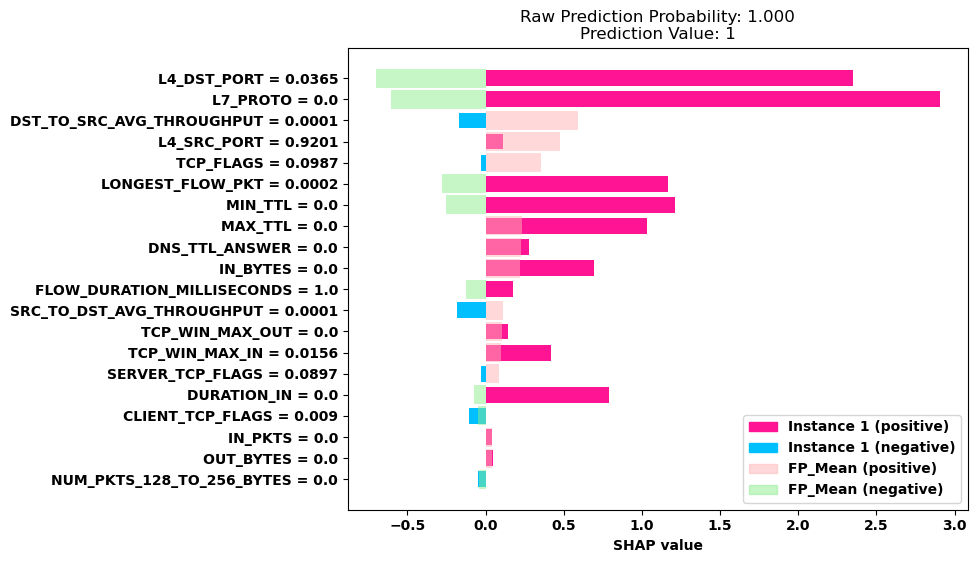

------------------------------------------------------------------------------------------------------------------------------------------------------


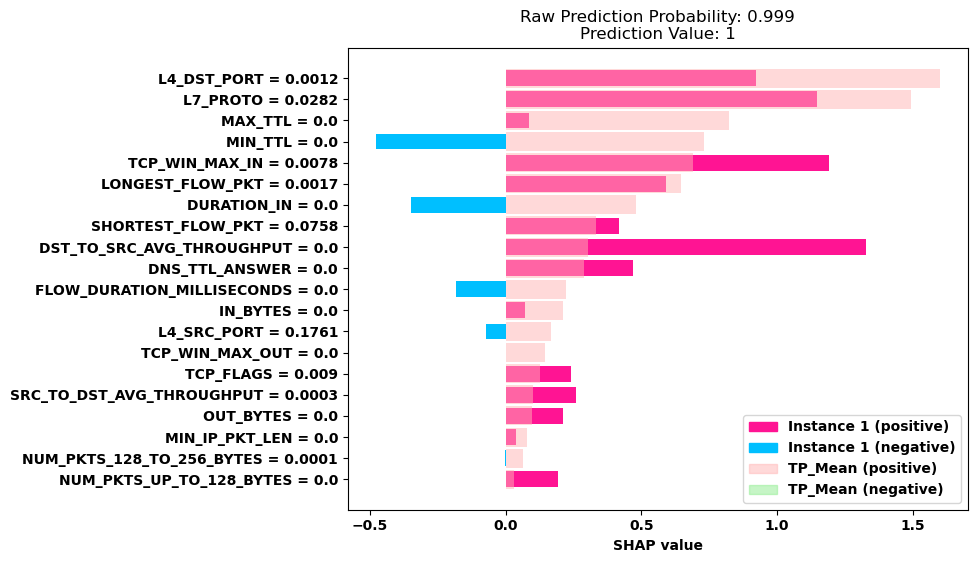

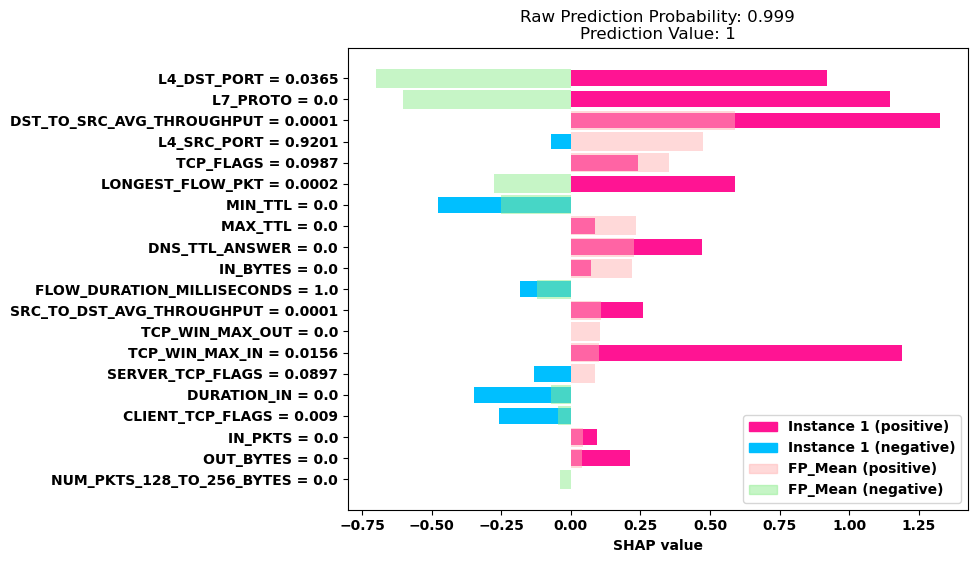

------------------------------------------------------------------------------------------------------------------------------------------------------


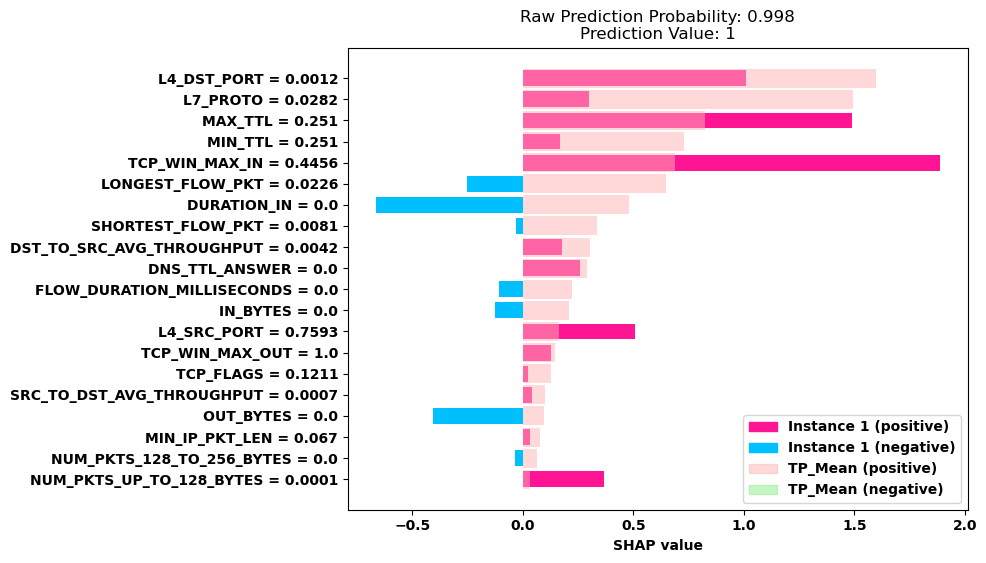

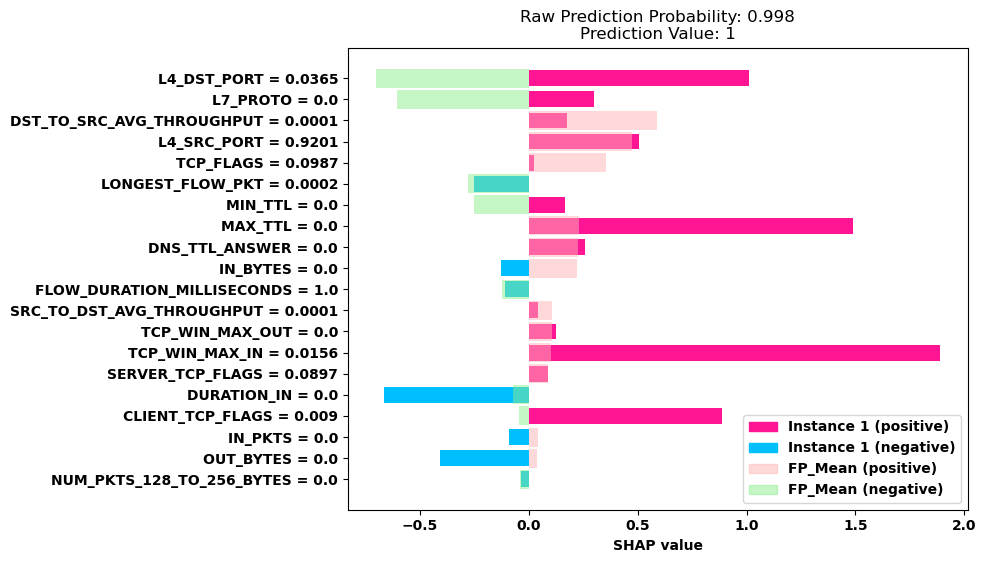

------------------------------------------------------------------------------------------------------------------------------------------------------


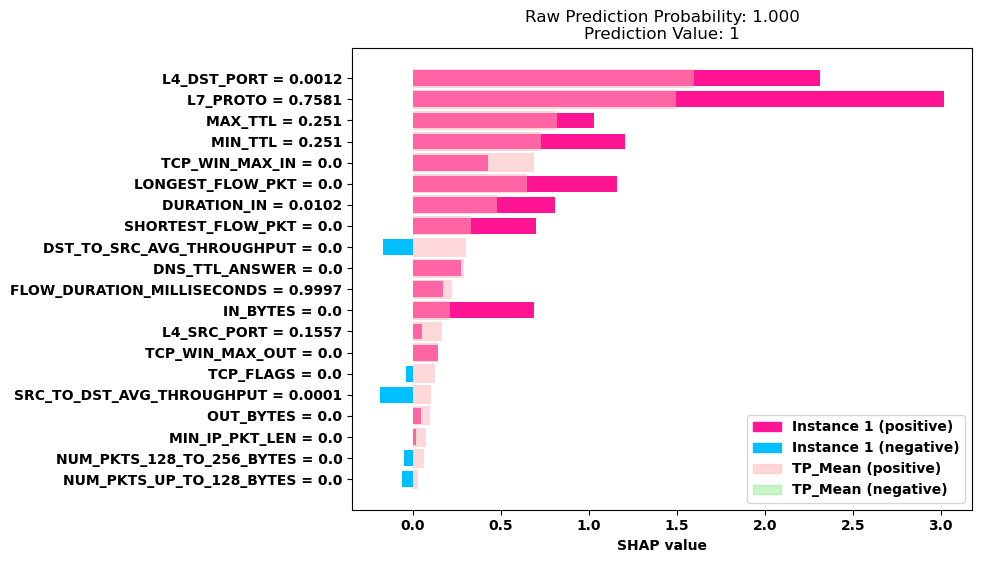

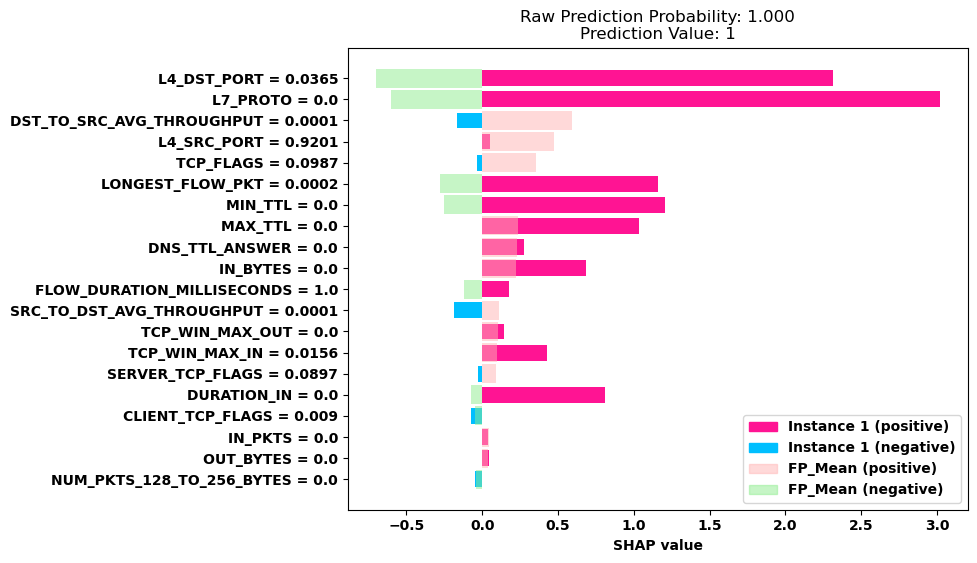

------------------------------------------------------------------------------------------------------------------------------------------------------


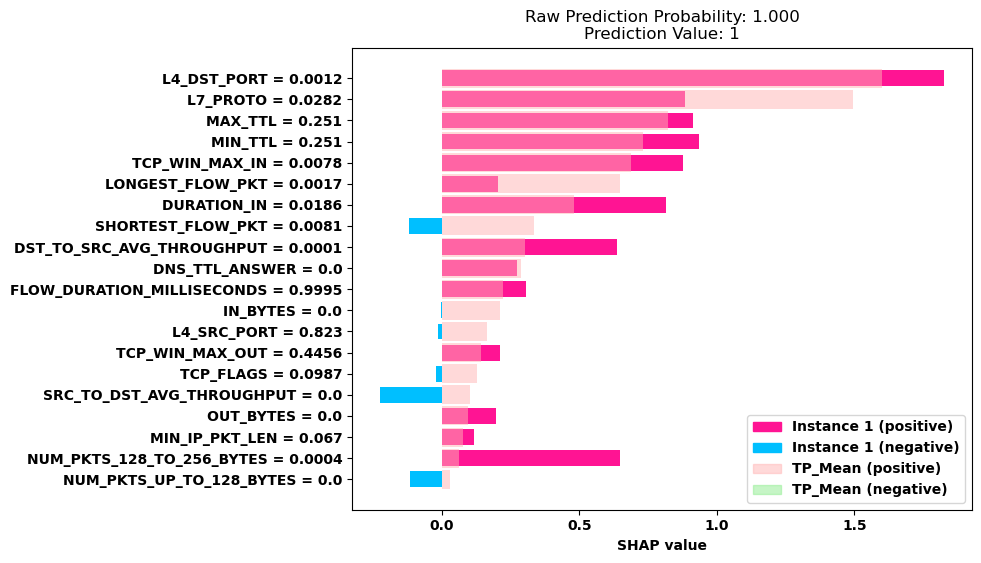

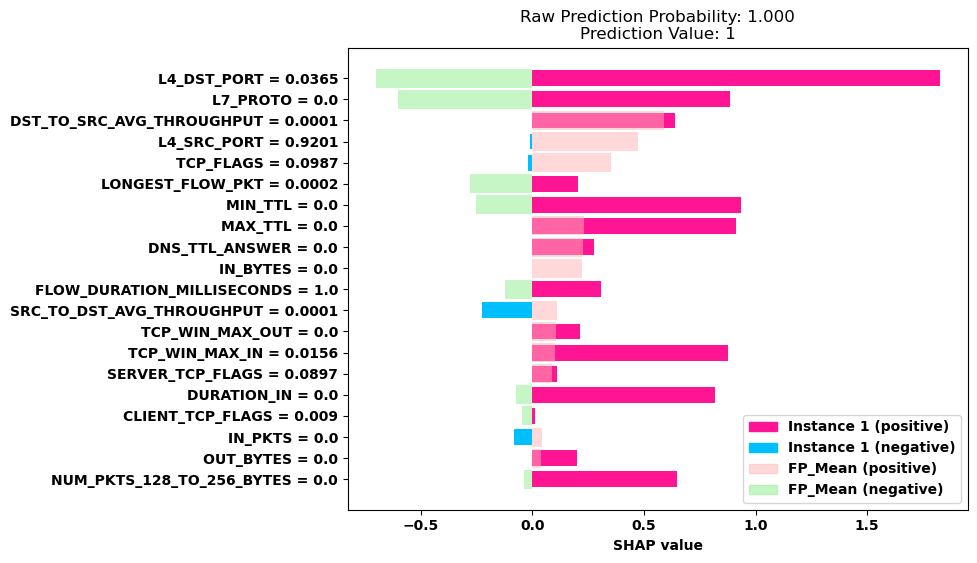

In [106]:
# tp_random_case = tp_shap_values[random.randrange(tp_tn_random_size-1)]
# # print(np.abs(tp_random_case.values))
# plot_overlapping_shap(tp_random_case.values[tp_top_20_features], tp_shap_values_mean[tp_top_20_features], feature_names[tp_top_20_features], tp_random_case.data[tp_top_20_features], 'TP_Mean')
# plot_overlapping_shap(tp_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], tn_random_case.data[tn_top_20_features], 'TN_Mean')
# plot_overlapping_shap(tp_random_case.values[fp_top_20_features], fp_shap_values_mean[fp_top_20_features], feature_names[fp_top_20_features], fp_random_case.data[fp_top_20_features], 'FP_Mean')
# plot_overlapping_shap(tp_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], fn_random_case.data[fn_top_20_features], 'FN_Mean')
# plt.rcParams["figure.figsize"] = (8,6)
# plt.yticks(rotation=0)
# plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
# plt.show()


for i in range(10):
    print('-'*150)
    rand_idx = random.choice(tp_instances)
    tp_random_case = explainer(X_test[rand_idx])
    # print(np.abs(tp_random_case.values))
    plot_overlapping_shap(tp_random_case.values[tp_top_20_features], tp_shap_values_mean[tp_top_20_features], feature_names[tp_top_20_features], tp_random_case.data[tp_top_20_features], 'TP_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    # plot_overlapping_shap(tp_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], tn_random_case.data[tn_top_20_features], 'TN_Mean')
    plot_overlapping_shap(tp_random_case.values[fp_top_20_features], fp_shap_values_mean[fp_top_20_features], feature_names[fp_top_20_features], fp_random_case.data[fp_top_20_features], 'FP_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    # plot_overlapping_shap(tp_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], fn_random_case.data[fn_top_20_features], 'FN_Mean')
    plt.rcParams["figure.figsize"] = (8,6)
    plt.yticks(rotation=0)
    plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
    plt.show()

------------------------------------------------------------------------------------------------------------------------------------------------------


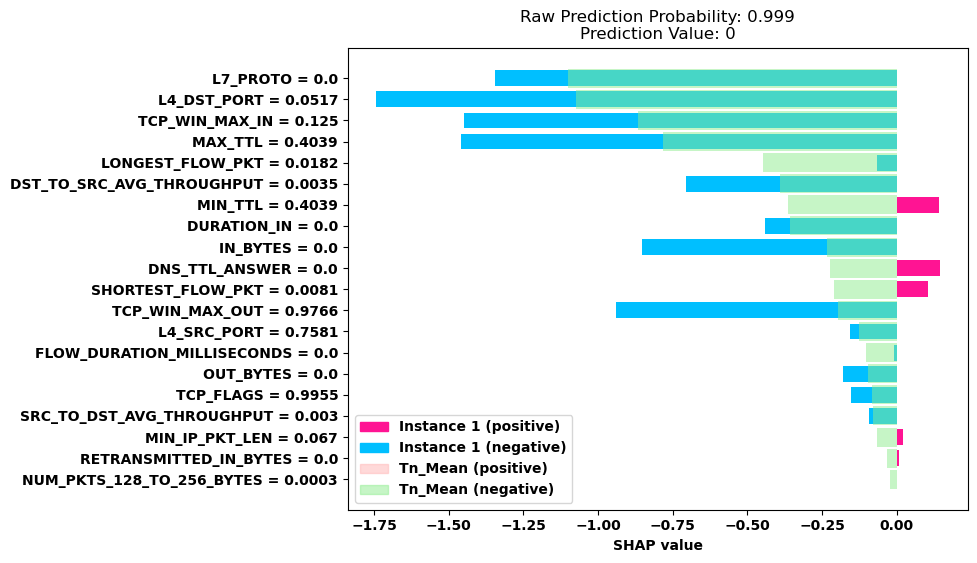

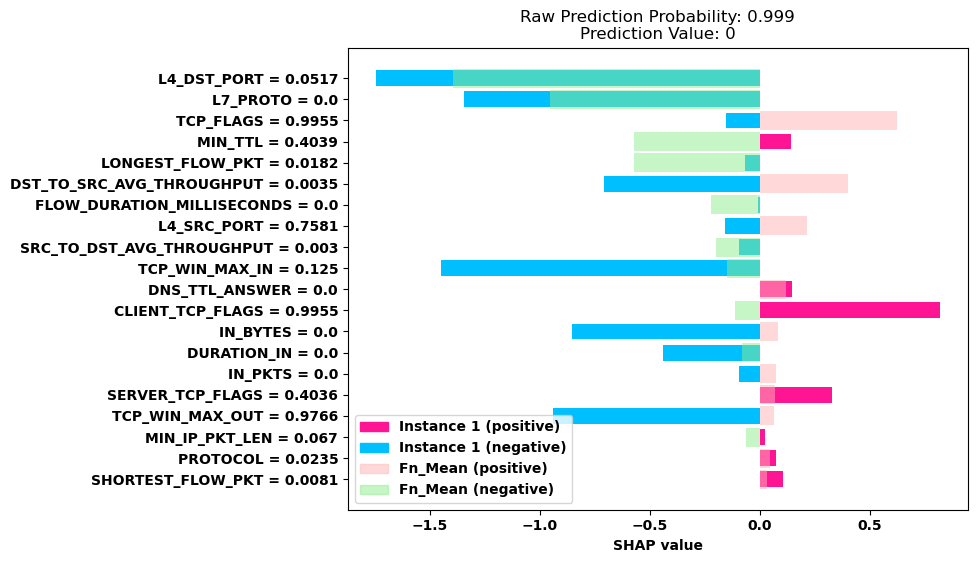

------------------------------------------------------------------------------------------------------------------------------------------------------


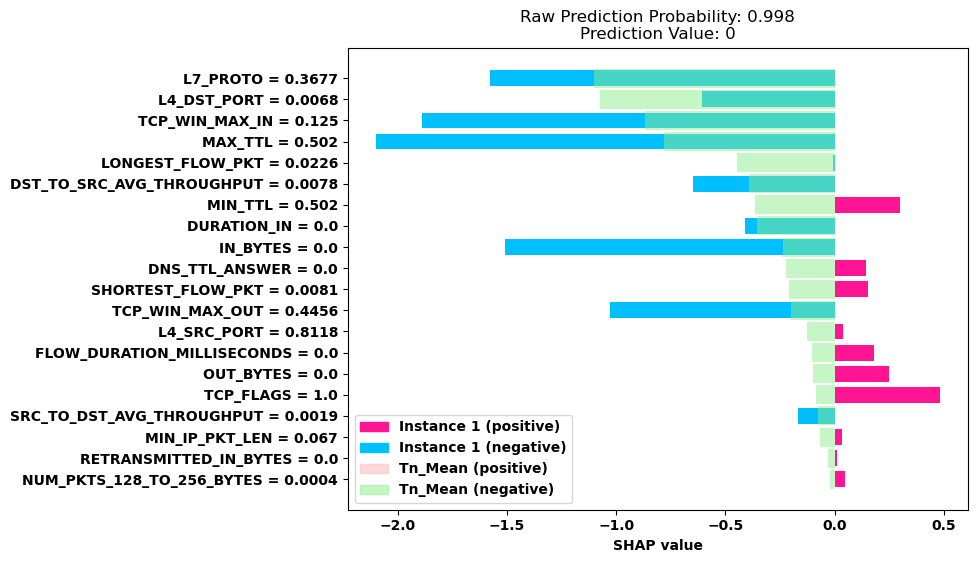

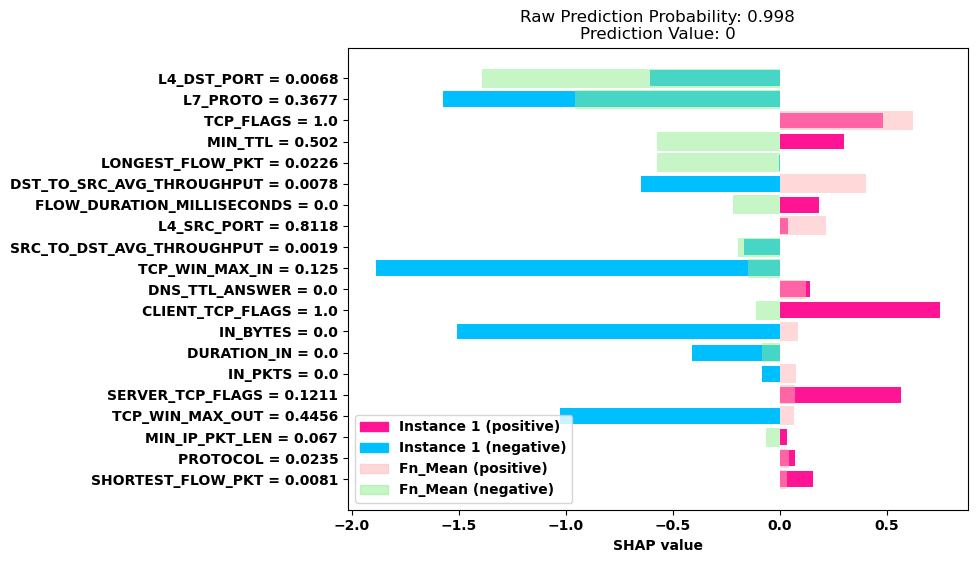

------------------------------------------------------------------------------------------------------------------------------------------------------


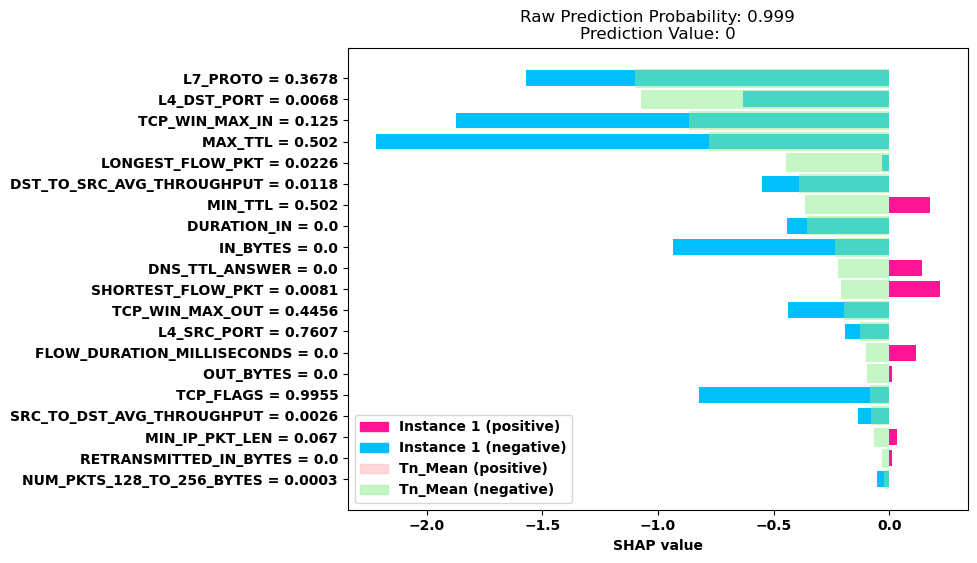

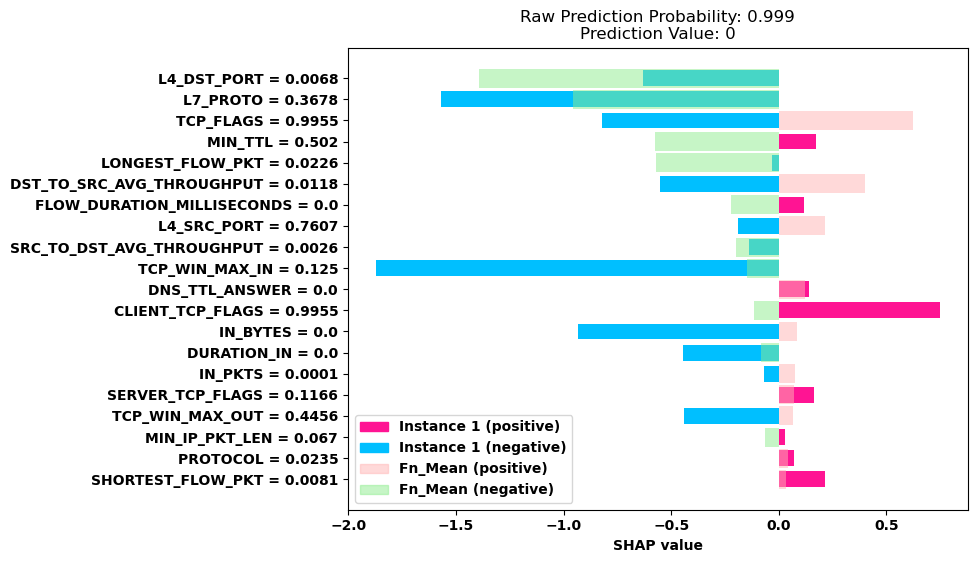

------------------------------------------------------------------------------------------------------------------------------------------------------


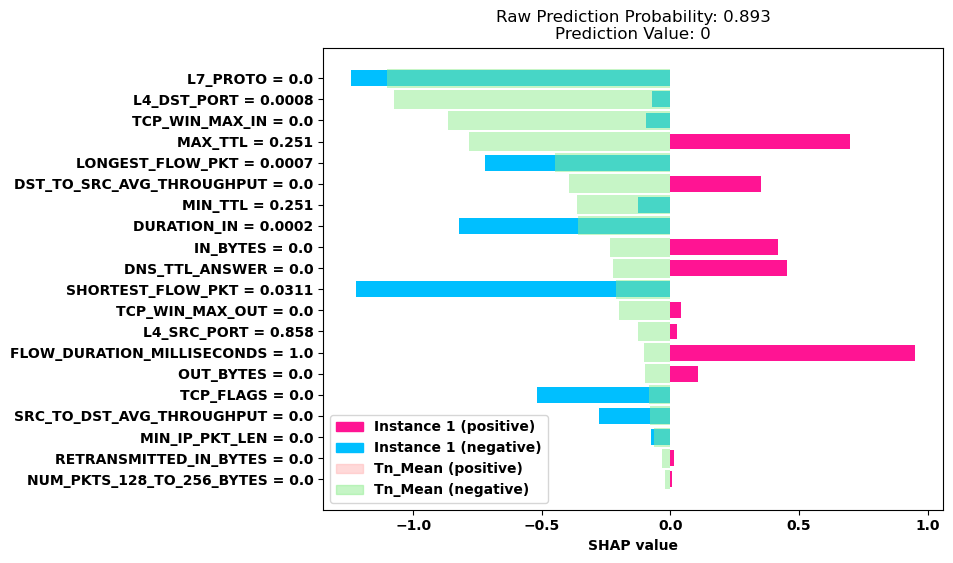

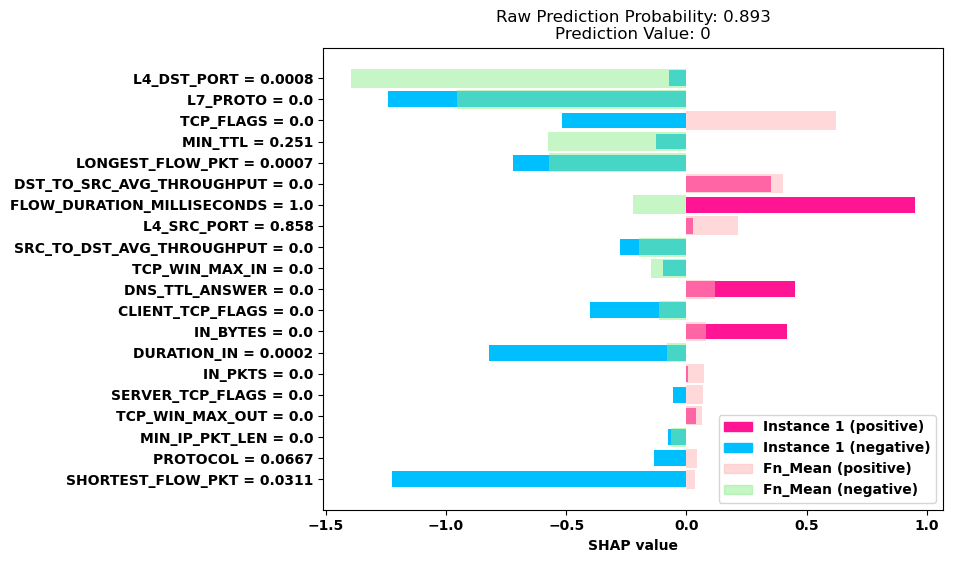

------------------------------------------------------------------------------------------------------------------------------------------------------


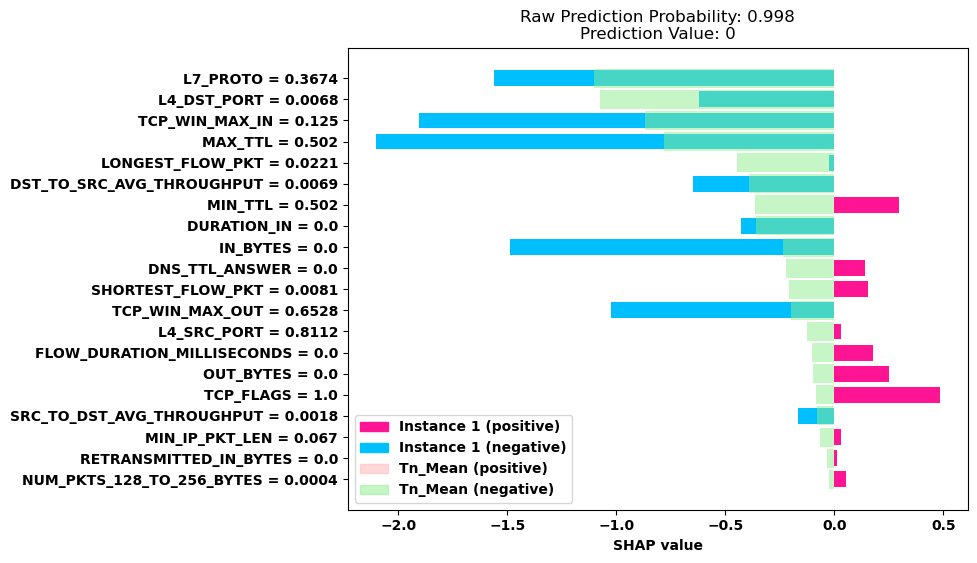

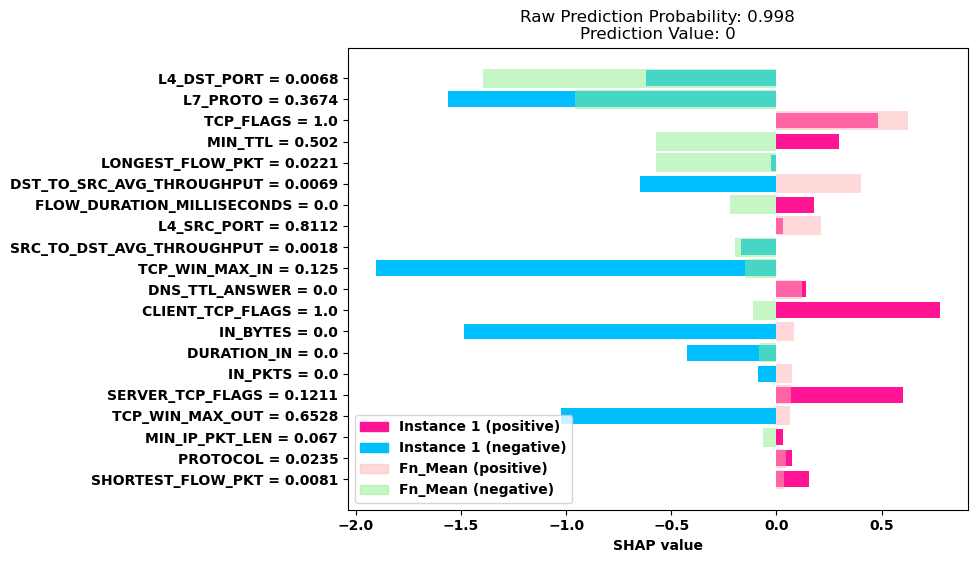

------------------------------------------------------------------------------------------------------------------------------------------------------


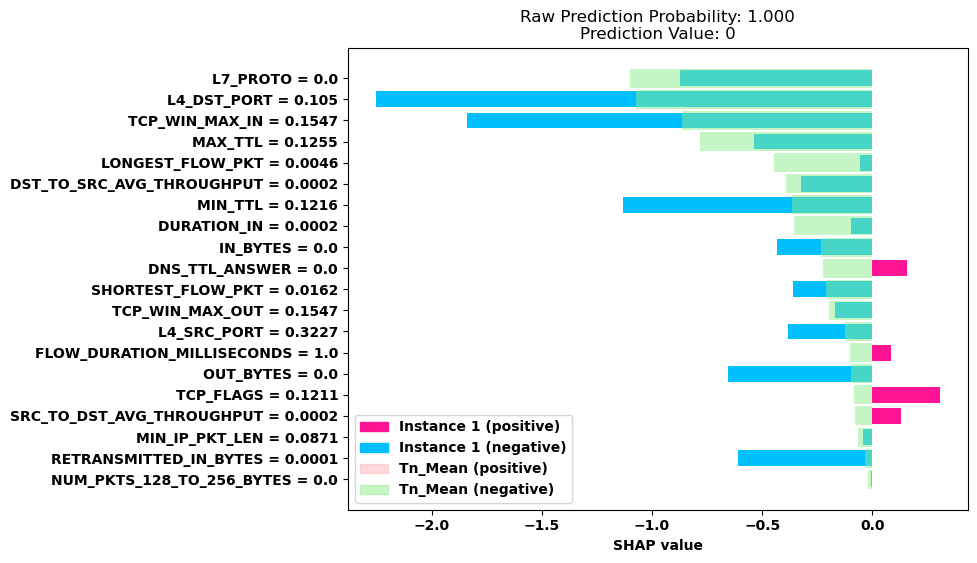

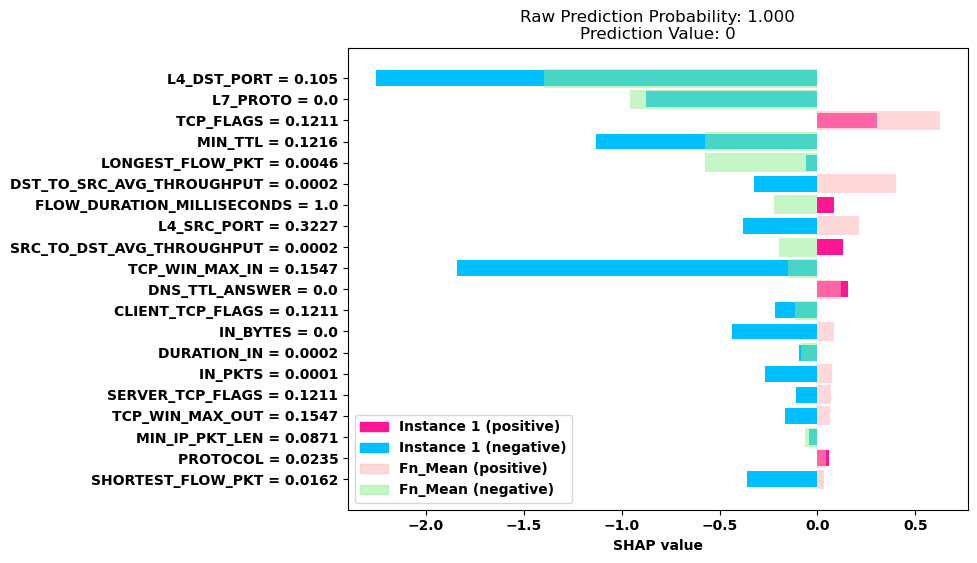

------------------------------------------------------------------------------------------------------------------------------------------------------


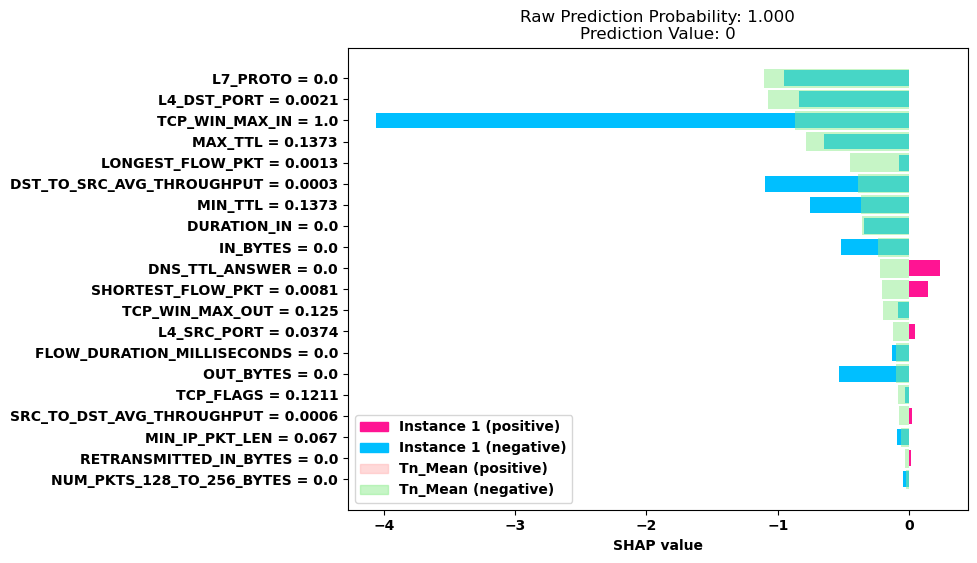

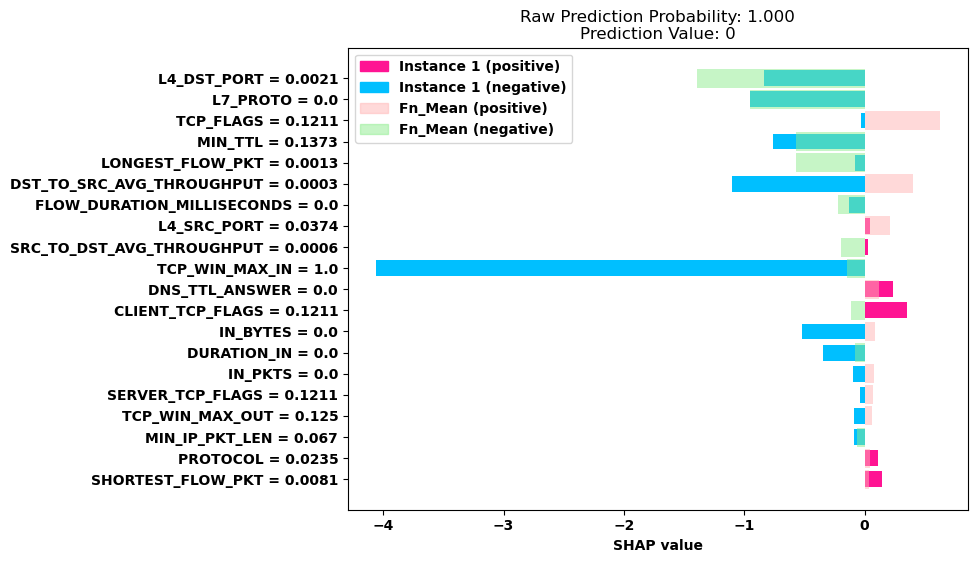

------------------------------------------------------------------------------------------------------------------------------------------------------


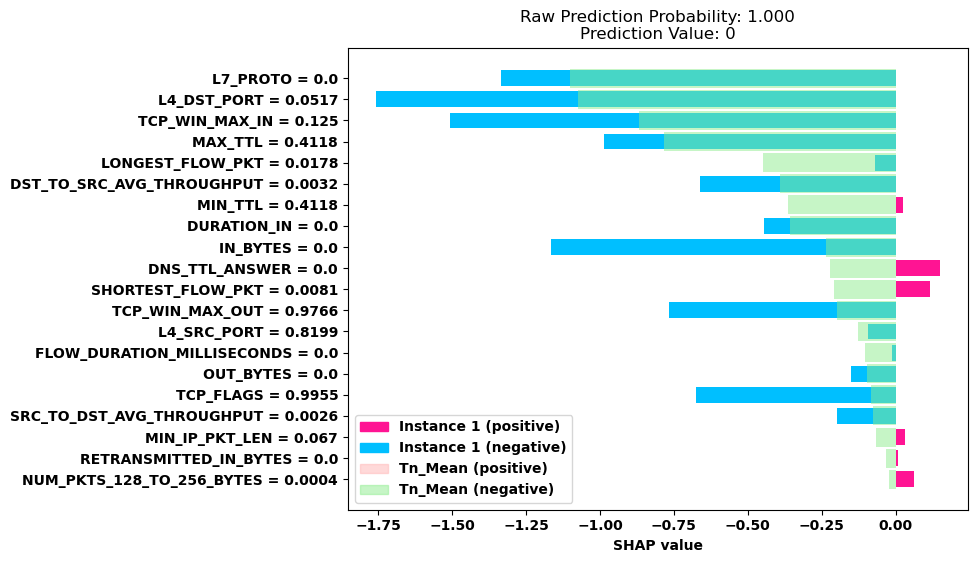

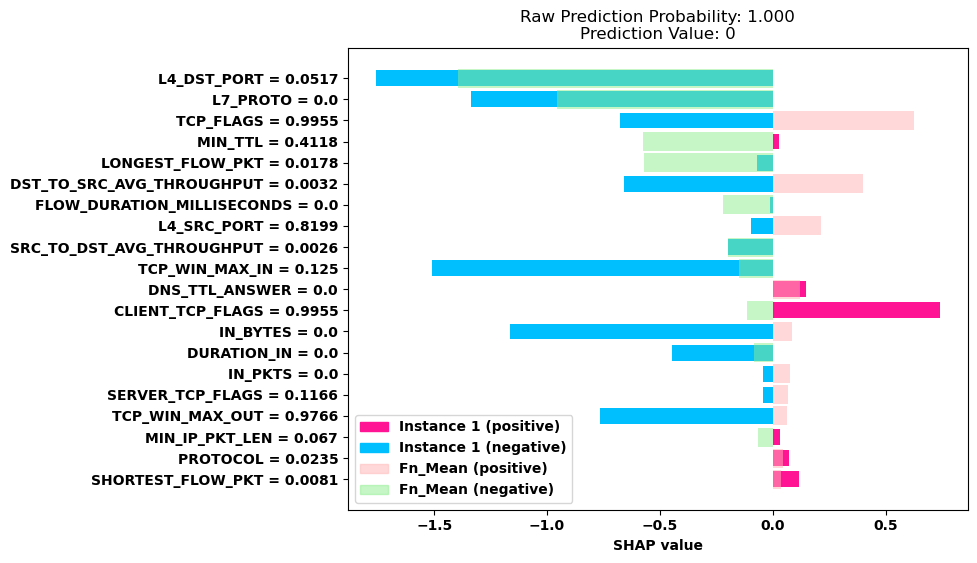

------------------------------------------------------------------------------------------------------------------------------------------------------


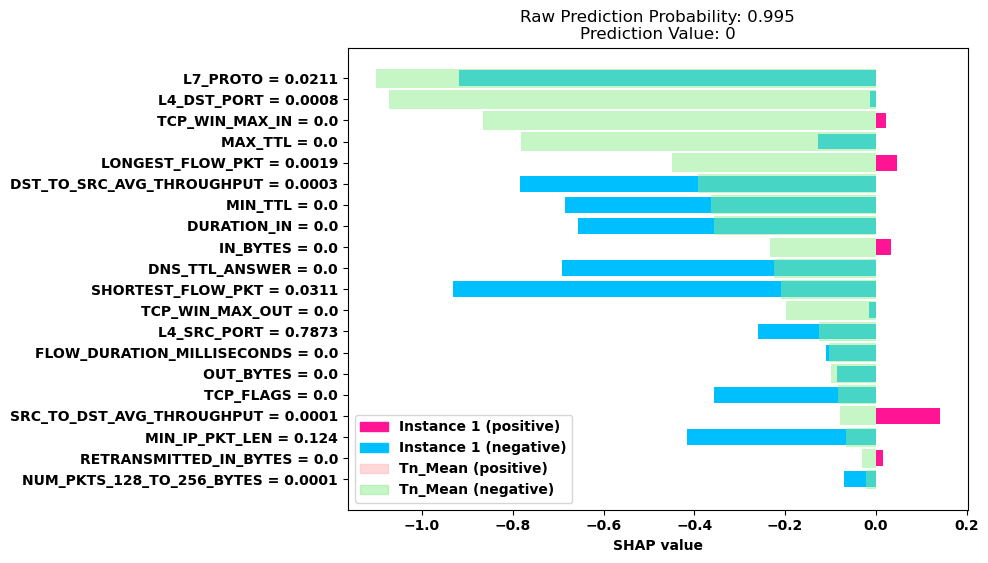

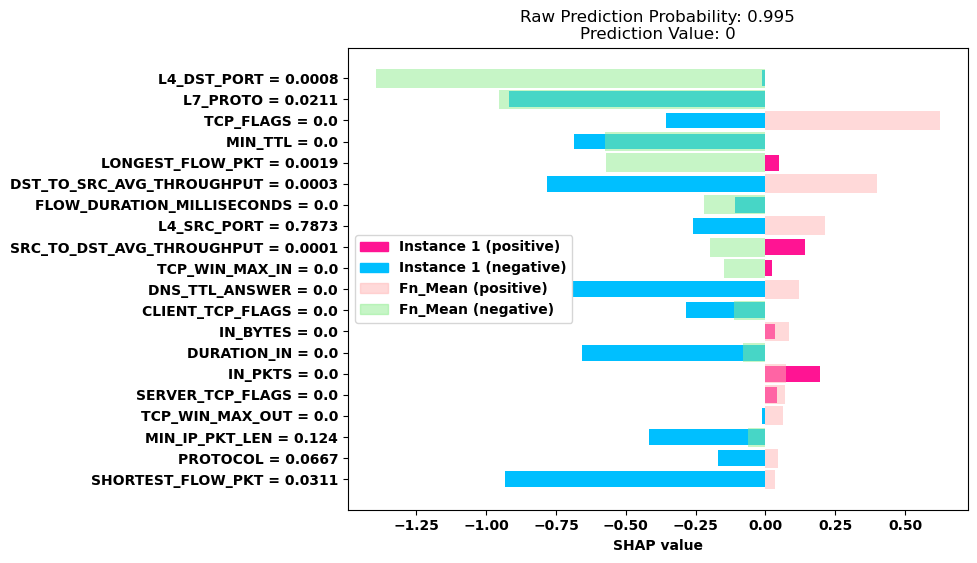

------------------------------------------------------------------------------------------------------------------------------------------------------


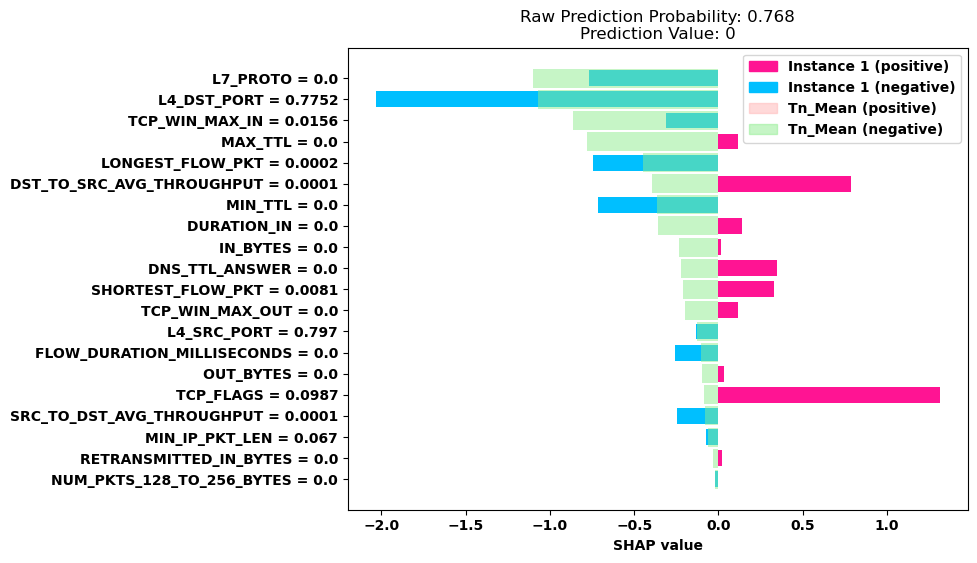

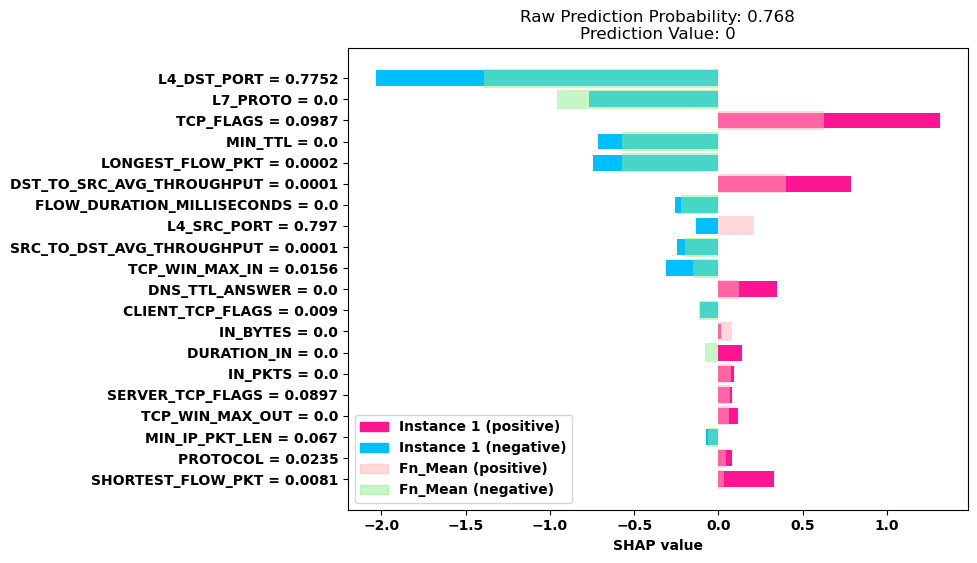

In [107]:
# tn_random_case = tn_shap_values[random.randrange(tp_tn_random_size-1)]
# # print(np.abs(tn_random_case.values))
# plot_overlapping_shap(tn_random_case.values[tp_top_20_features], tp_shap_values_mean[tp_top_20_features], feature_names[tp_top_20_features], tn_random_case.data[tp_top_20_features], 'TP_Mean')
# plot_overlapping_shap(tn_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], tn_random_case.data[tn_top_20_features], 'TN_Mean')
# plot_overlapping_shap(tn_random_case.values[fp_top_20_features], fp_shap_values_mean[fp_top_20_features], feature_names[fp_top_20_features], fp_random_case.data[fp_top_20_features], 'FP_Mean')
# plot_overlapping_shap(tn_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], fn_random_case.data[fn_top_20_features], 'FN_Mean')
# plt.rcParams["figure.figsize"] = (8,6)
# plt.yticks(rotation=0)
# plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
# plt.show()

for i in range(10):
    print('-'*150)
    rand_idx = random.choice(tn_instances)
    tn_random_case = explainer(X_test[rand_idx])
    # print(np.abs(tn_random_case.values))
    plot_overlapping_shap(tn_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], tn_random_case.data[tn_top_20_features], 'Tn_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    # plot_overlapping_shap(tn_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], tn_random_case.data[tn_top_20_features], 'TN_Mean')
    plot_overlapping_shap(tn_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], tn_random_case.data[fn_top_20_features], 'Fn_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    # plot_overlapping_shap(tn_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], tn_random_case.data[fn_top_20_features], 'FN_Mean')
    plt.rcParams["figure.figsize"] = (8,6)
    plt.yticks(rotation=0)
    plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
    plt.show()

------------------------------------------------------------------------------------------------------------------------------------------------------


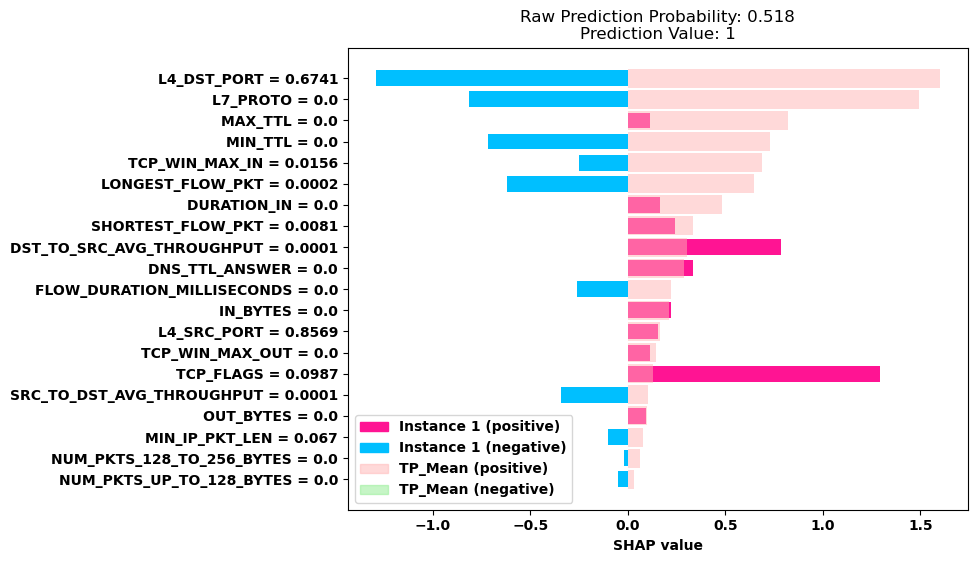

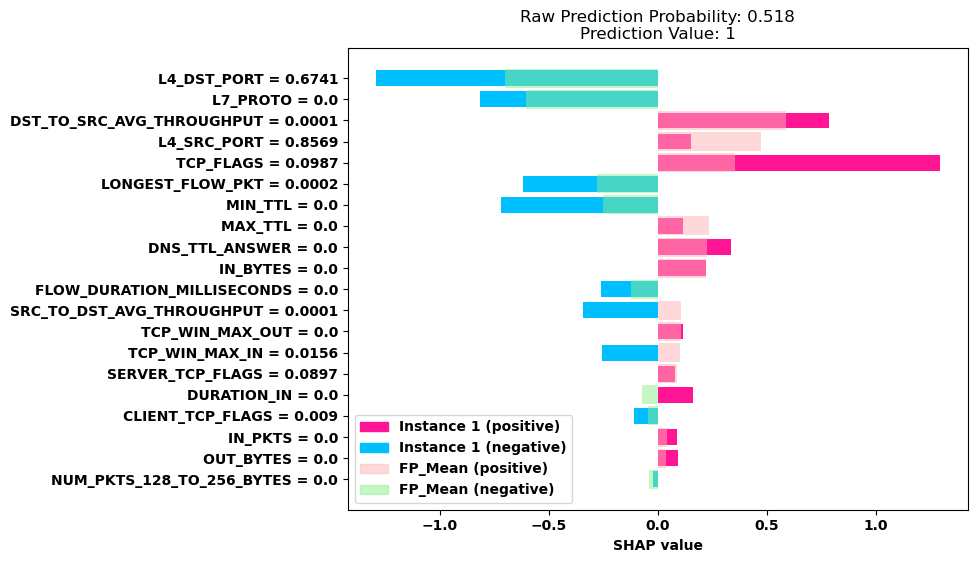

------------------------------------------------------------------------------------------------------------------------------------------------------


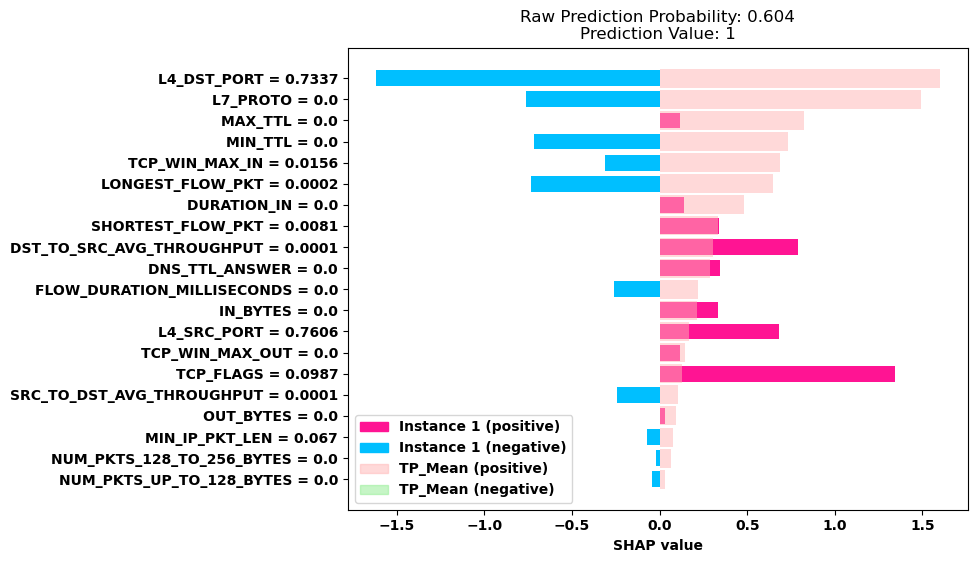

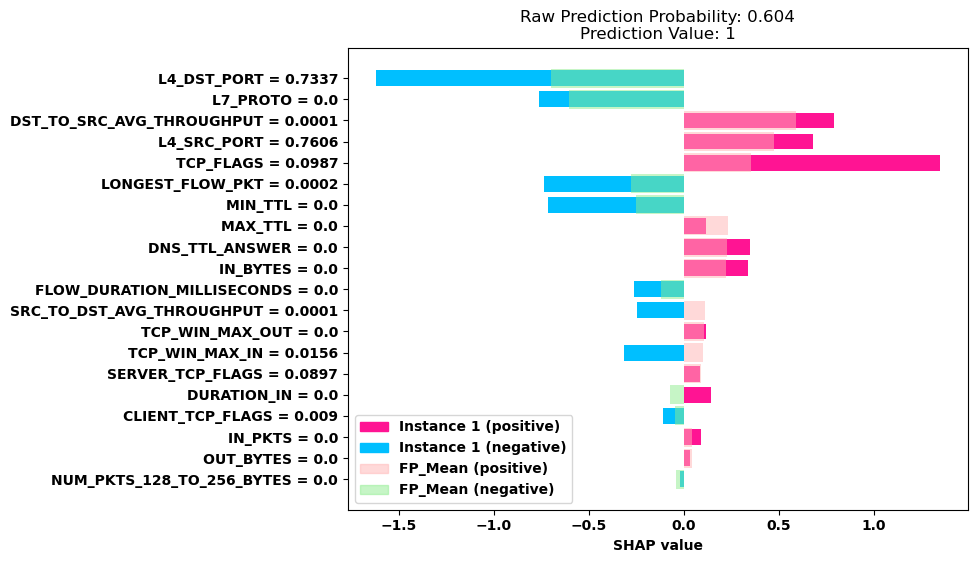

------------------------------------------------------------------------------------------------------------------------------------------------------


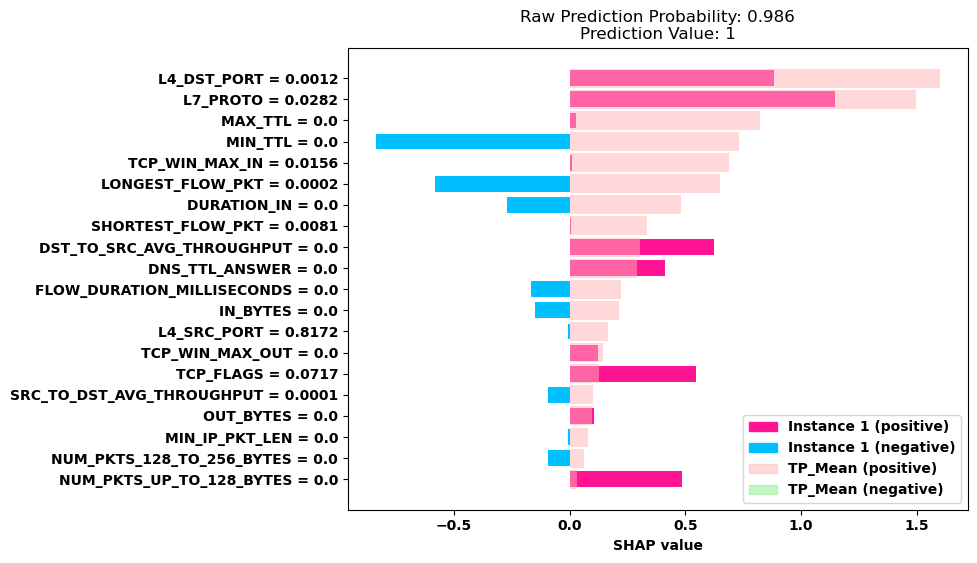

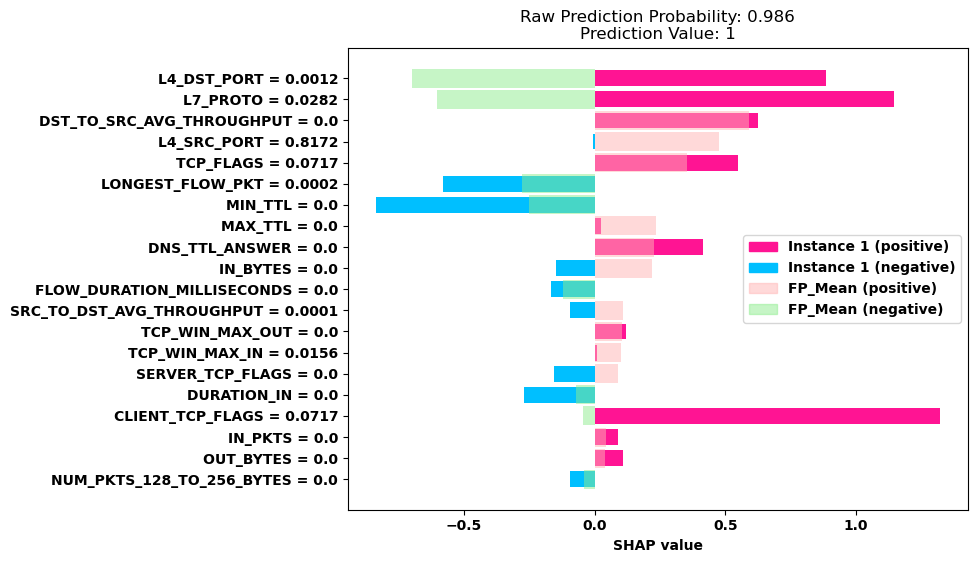

------------------------------------------------------------------------------------------------------------------------------------------------------


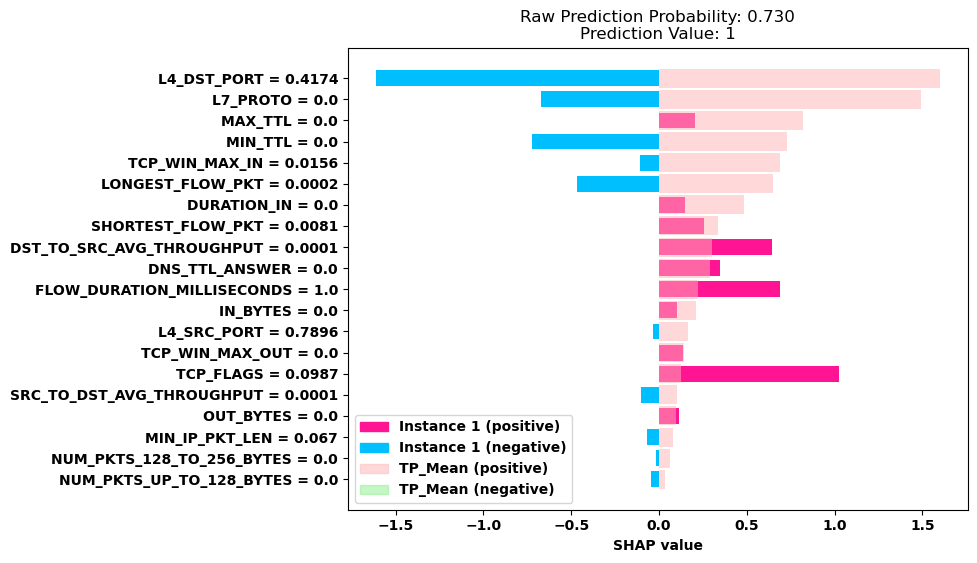

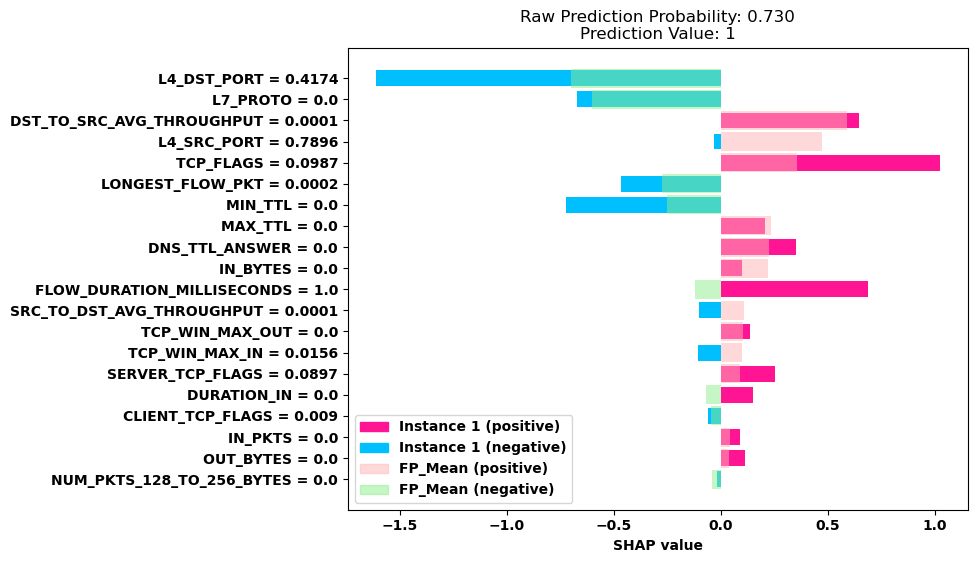

------------------------------------------------------------------------------------------------------------------------------------------------------


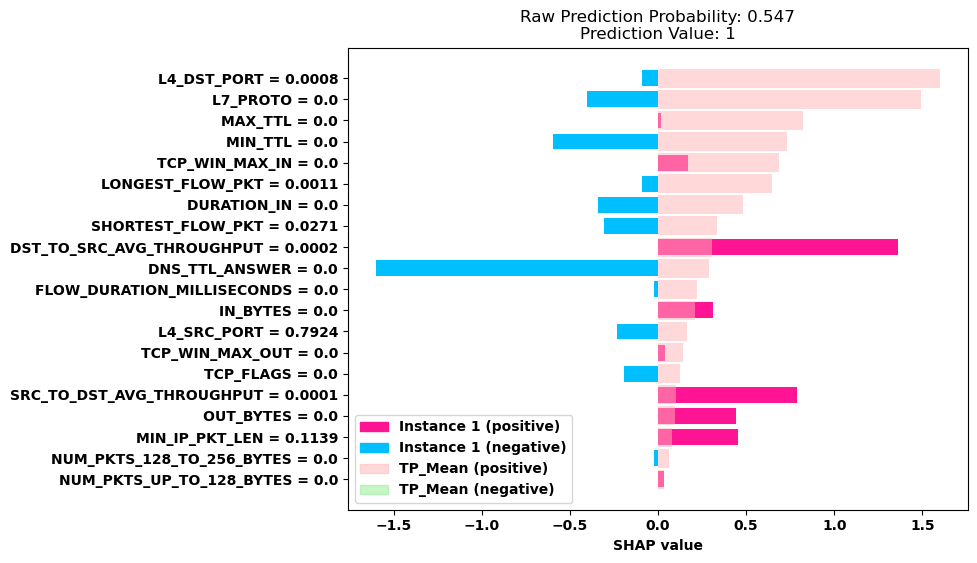

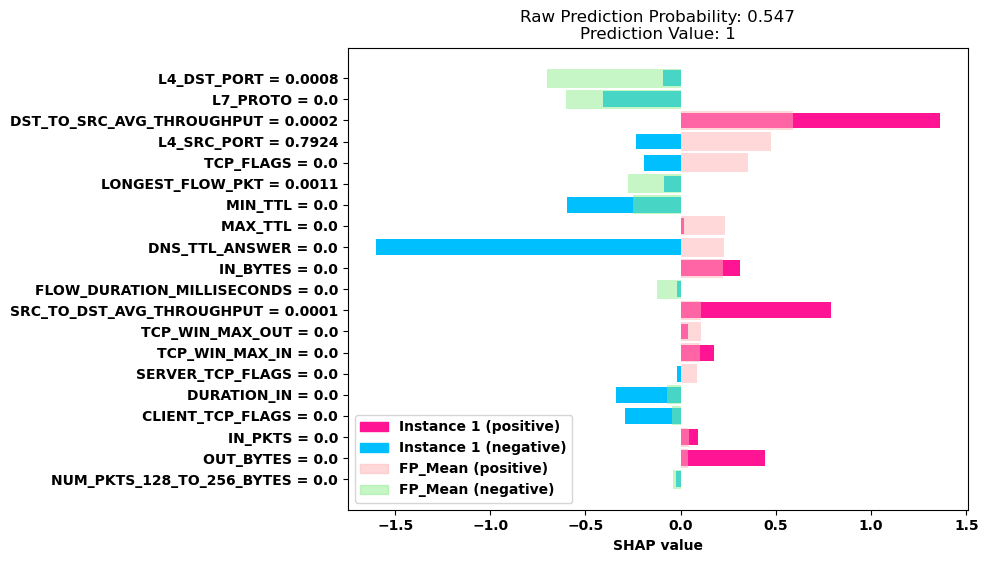

------------------------------------------------------------------------------------------------------------------------------------------------------


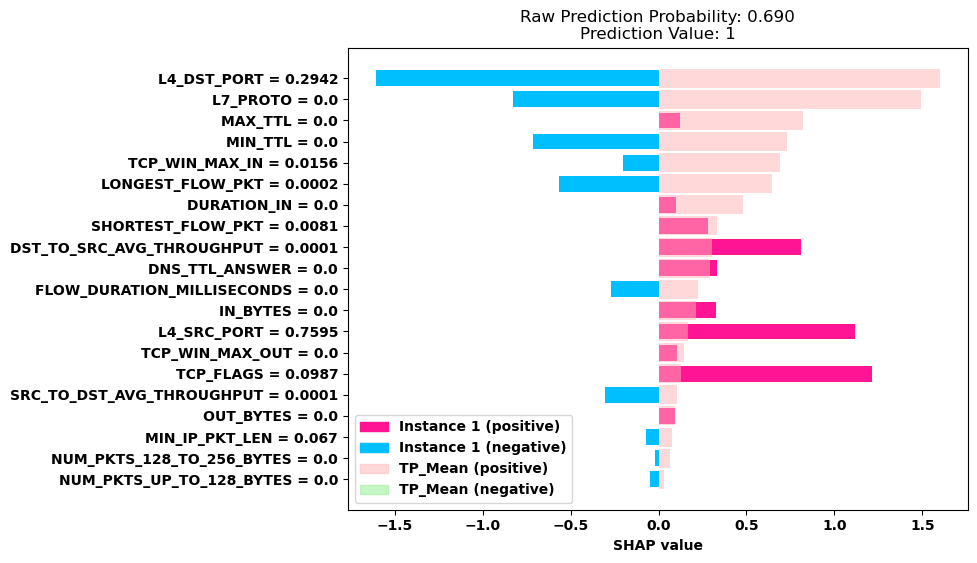

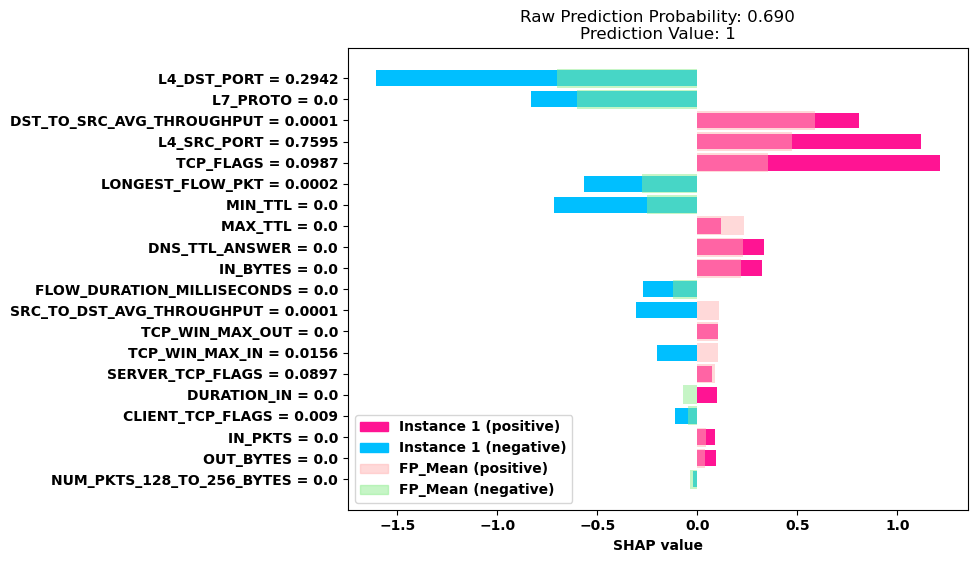

------------------------------------------------------------------------------------------------------------------------------------------------------


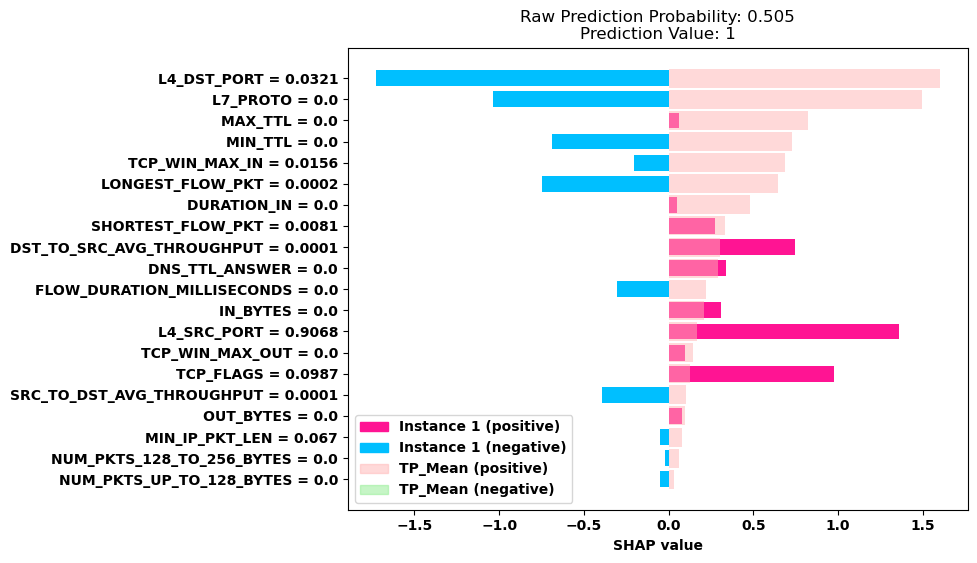

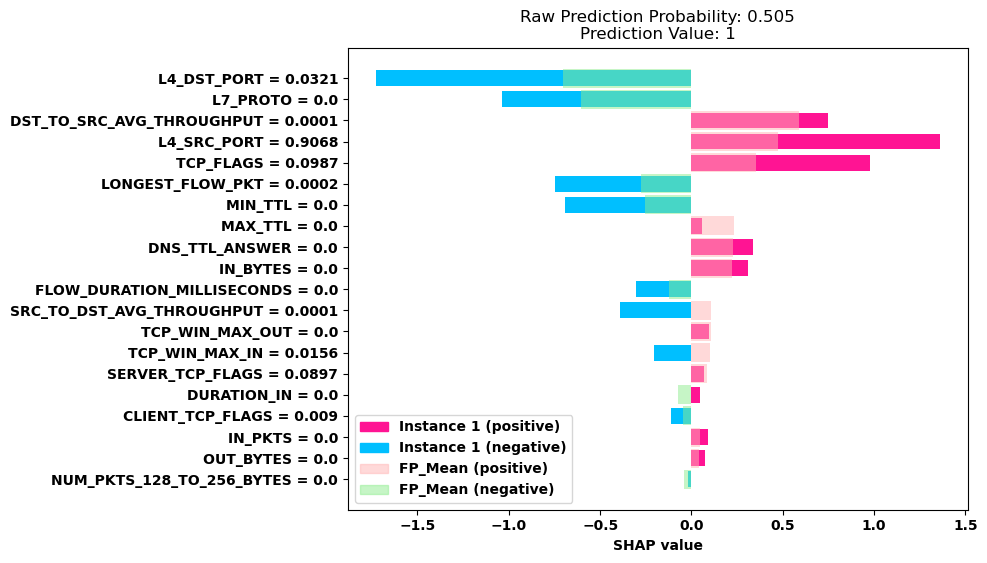

------------------------------------------------------------------------------------------------------------------------------------------------------


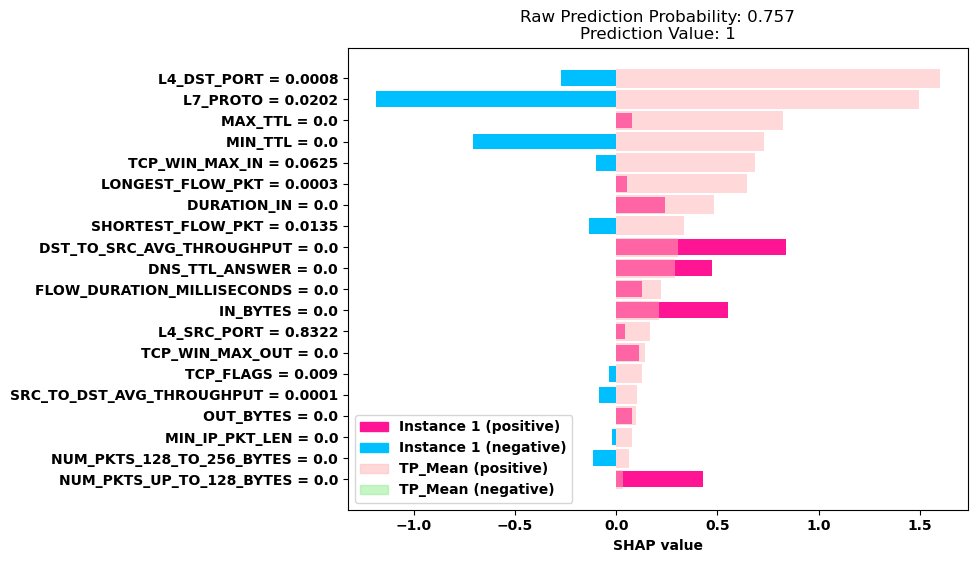

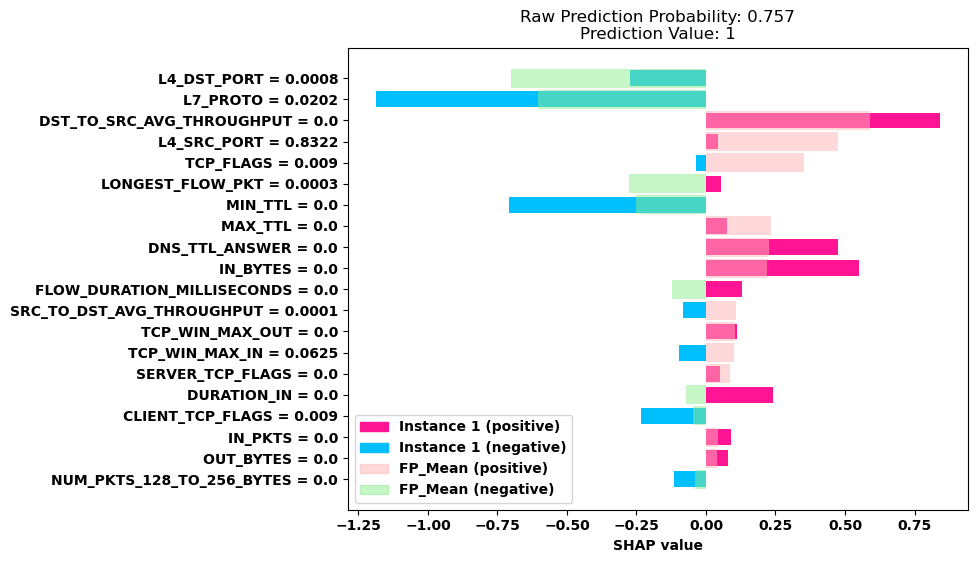

------------------------------------------------------------------------------------------------------------------------------------------------------


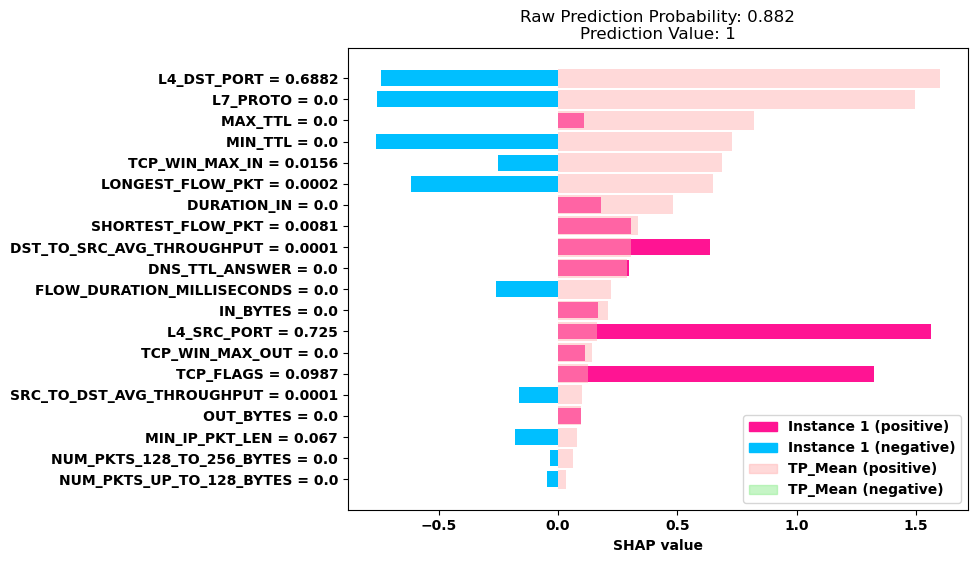

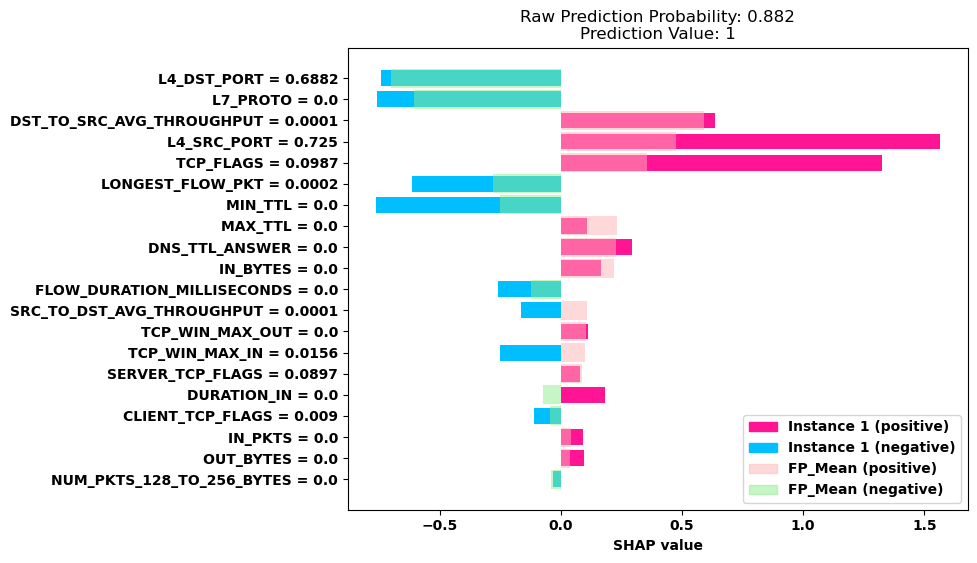

------------------------------------------------------------------------------------------------------------------------------------------------------


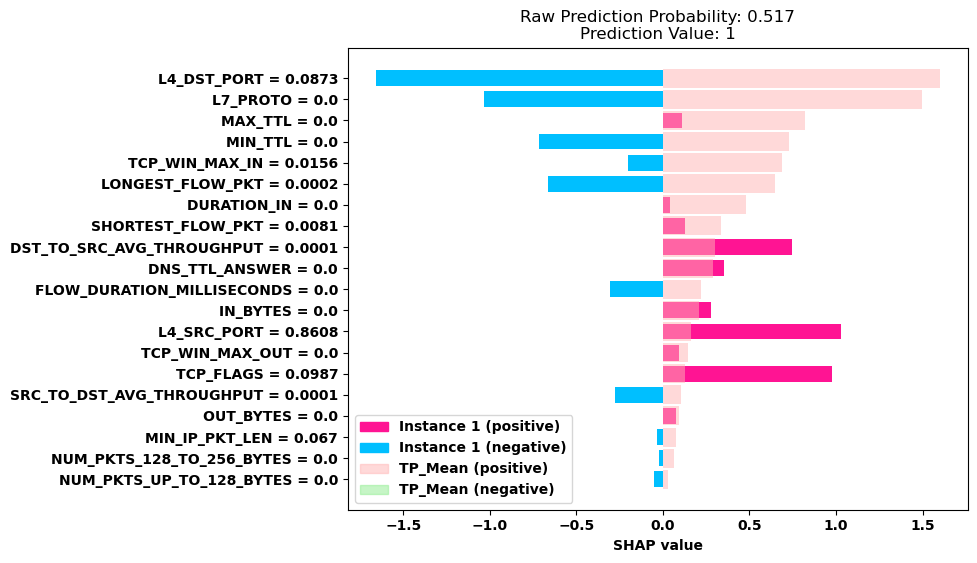

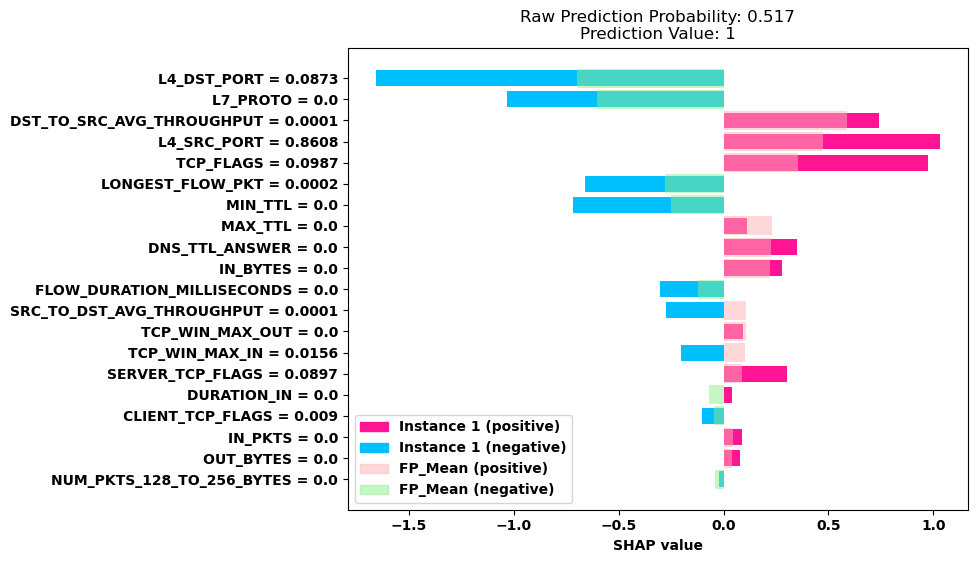

In [108]:
# fp_random_case = fp_shap_values[random.randrange(fp_fn_random_size-1)]
# # print(np.abs(fp_random_case.values))
# plot_overlapping_shap(fp_random_case.values[tp_top_20_features], tp_shap_values_mean[tp_top_20_features], feature_names[tp_top_20_features], fp_random_case.data[tp_top_20_features], 'TP_Mean')
# plot_overlapping_shap(fp_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], tn_random_case.data[tn_top_20_features], 'TN_Mean')
# plot_overlapping_shap(fp_random_case.values[fp_top_20_features], fp_shap_values_mean[fp_top_20_features], feature_names[fp_top_20_features], fp_random_case.data[fp_top_20_features], 'FP_Mean')
# plot_overlapping_shap(fp_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], fn_random_case.data[fn_top_20_features], 'FN_Mean')
# plt.rcParams["figure.figsize"] = (8,6)
# plt.yticks(rotation=0)
# plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
# plt.show()


for i in range(10):
    print('-'*150)
    rand_idx = random.choice(fp_instances)
    fp_random_case = explainer(X_test[rand_idx])
    # print(np.abs(fp_random_case.values))
    plot_overlapping_shap(fp_random_case.values[tp_top_20_features], tp_shap_values_mean[tp_top_20_features], feature_names[tp_top_20_features], fp_random_case.data[tp_top_20_features], 'TP_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    # plot_overlapping_shap(fp_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], tn_random_case.data[tn_top_20_features], 'TN_Mean')
    plot_overlapping_shap(fp_random_case.values[fp_top_20_features], fp_shap_values_mean[fp_top_20_features], feature_names[fp_top_20_features], fp_random_case.data[fp_top_20_features], 'FP_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    # plot_overlapping_shap(fp_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], fn_random_case.data[fn_top_20_features], 'FN_Mean')
    plt.rcParams["figure.figsize"] = (8,6)
    plt.yticks(rotation=0)
    plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
    plt.show()

------------------------------------------------------------------------------------------------------------------------------------------------------


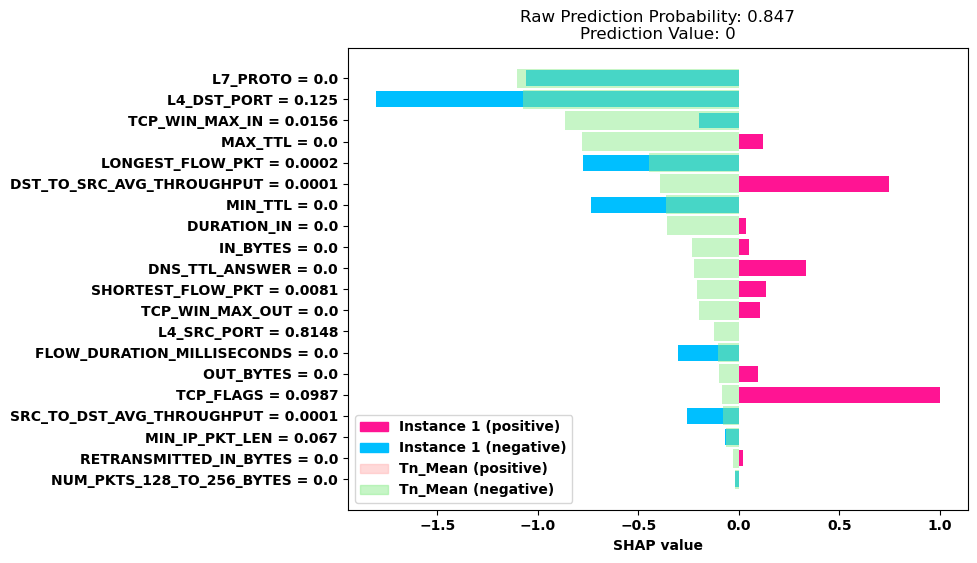

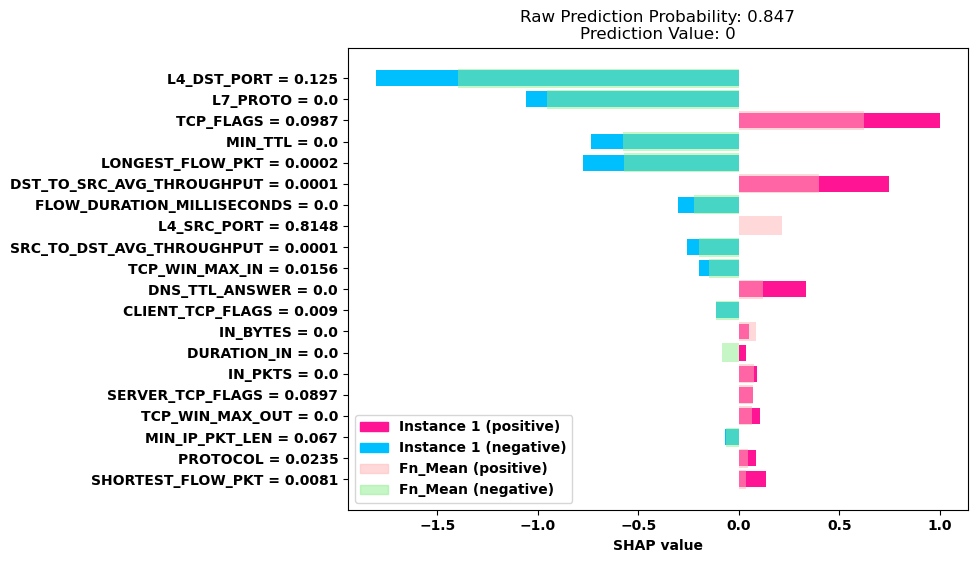

------------------------------------------------------------------------------------------------------------------------------------------------------


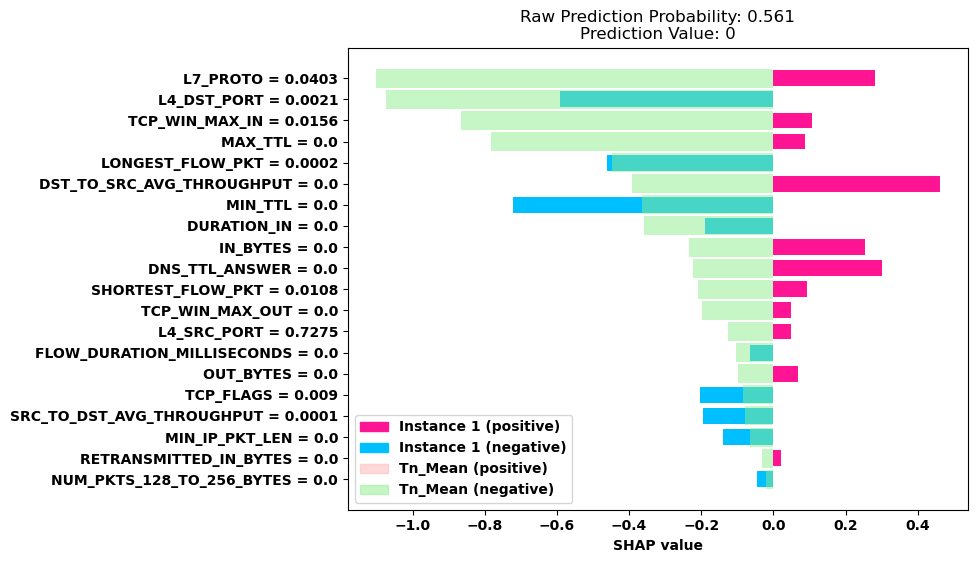

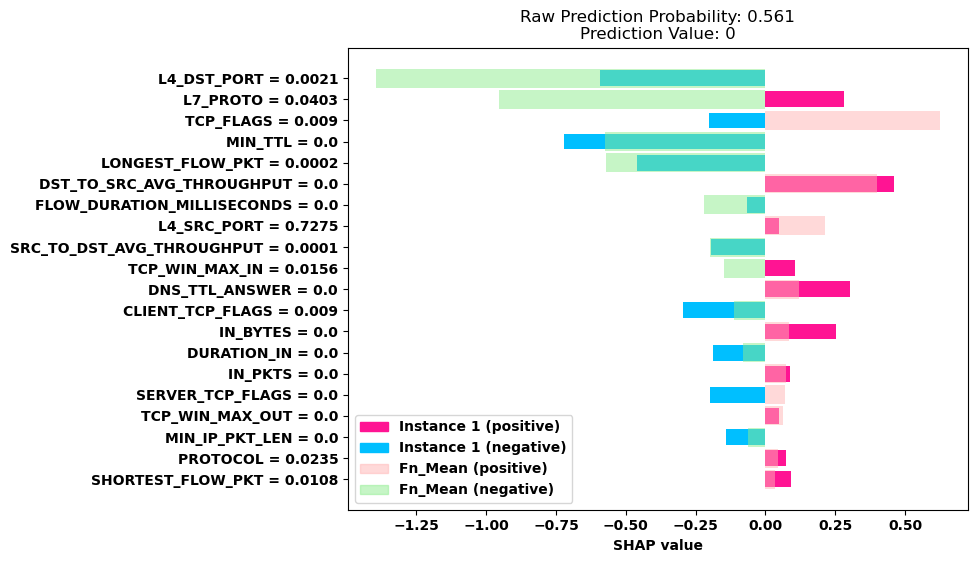

------------------------------------------------------------------------------------------------------------------------------------------------------


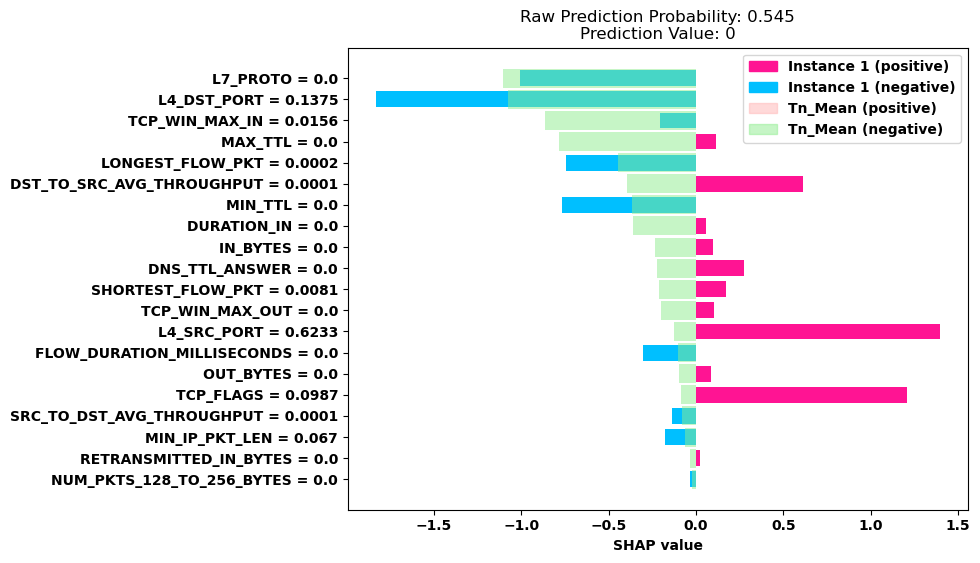

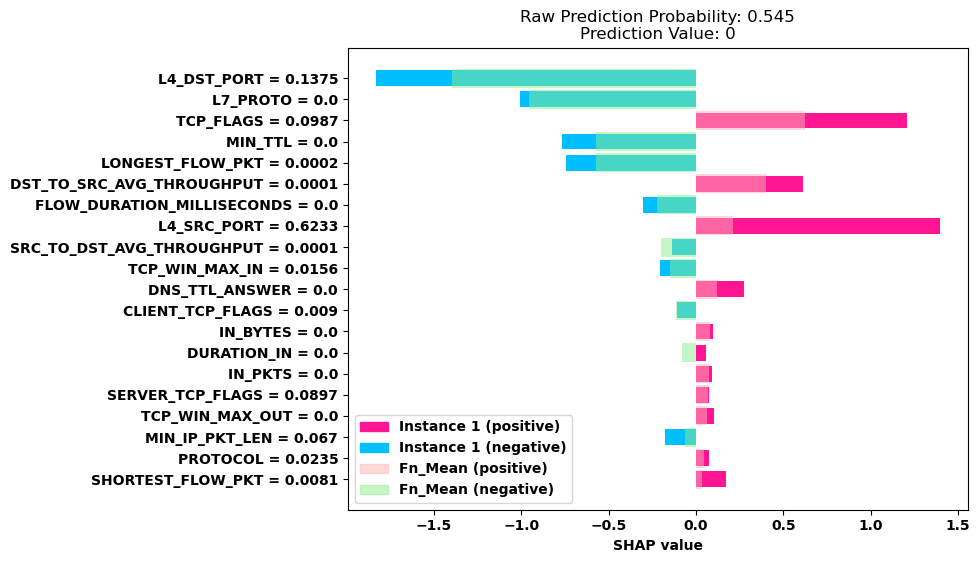

------------------------------------------------------------------------------------------------------------------------------------------------------


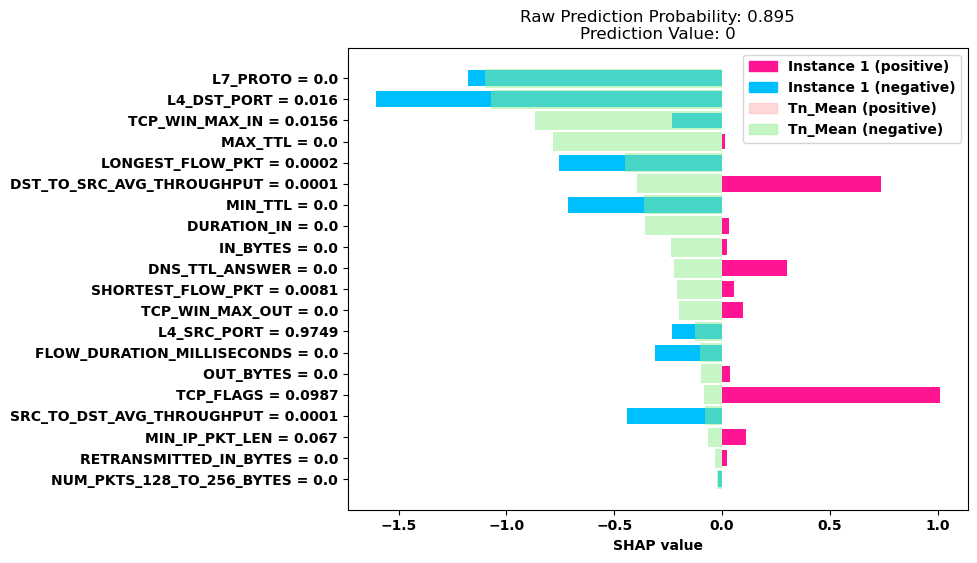

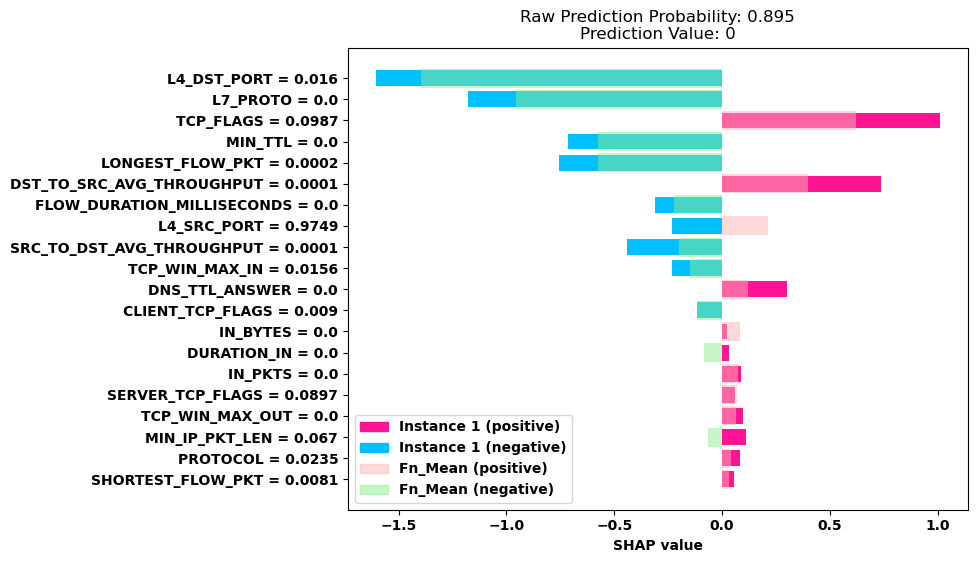

------------------------------------------------------------------------------------------------------------------------------------------------------


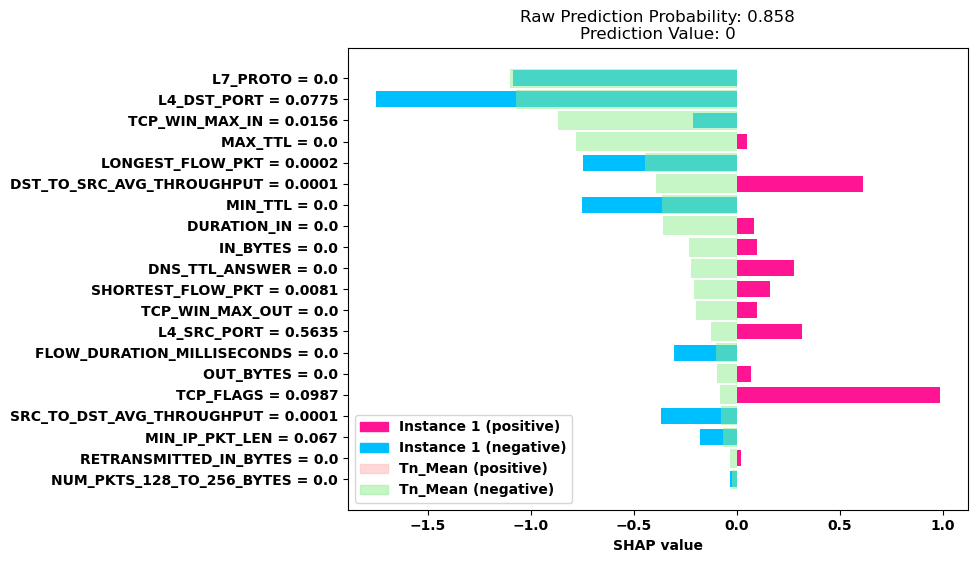

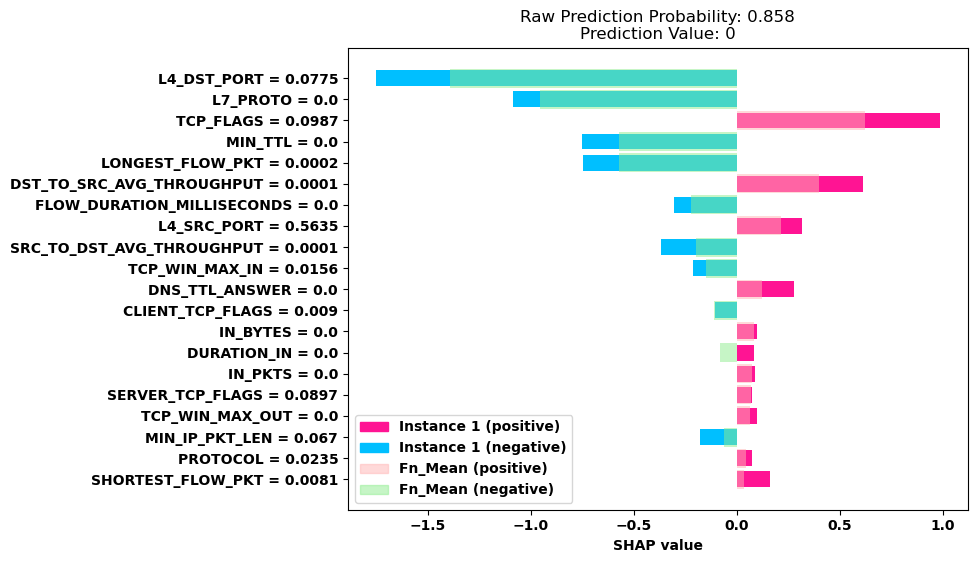

------------------------------------------------------------------------------------------------------------------------------------------------------


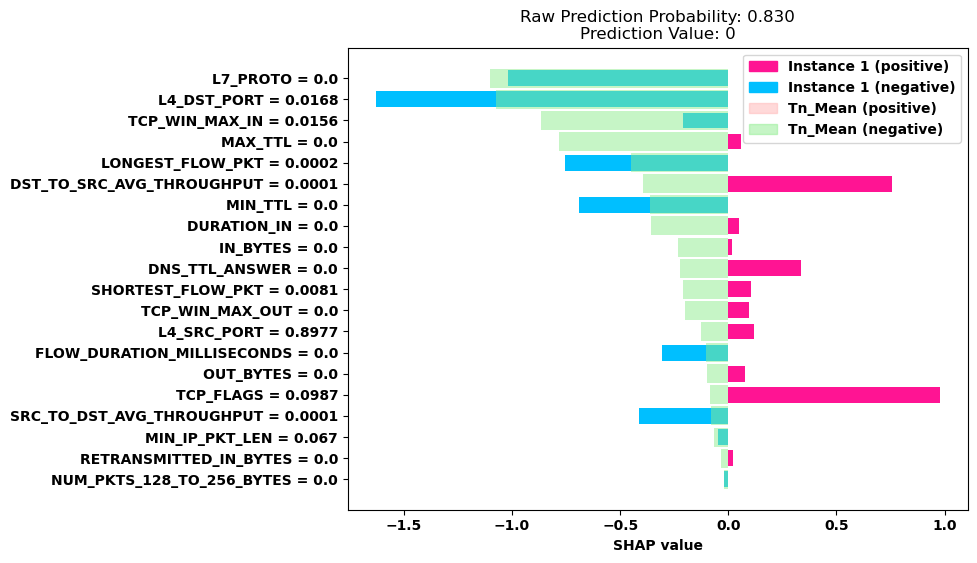

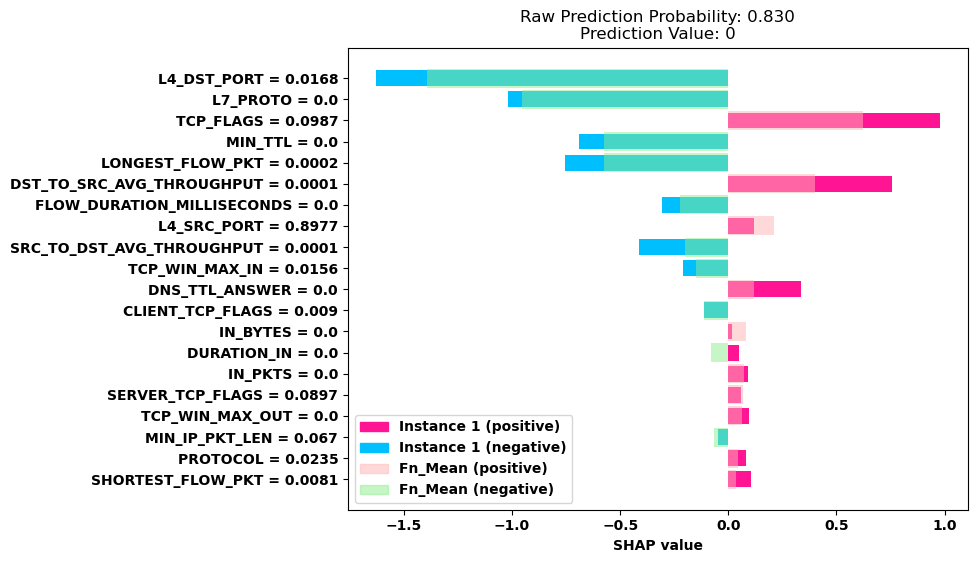

------------------------------------------------------------------------------------------------------------------------------------------------------


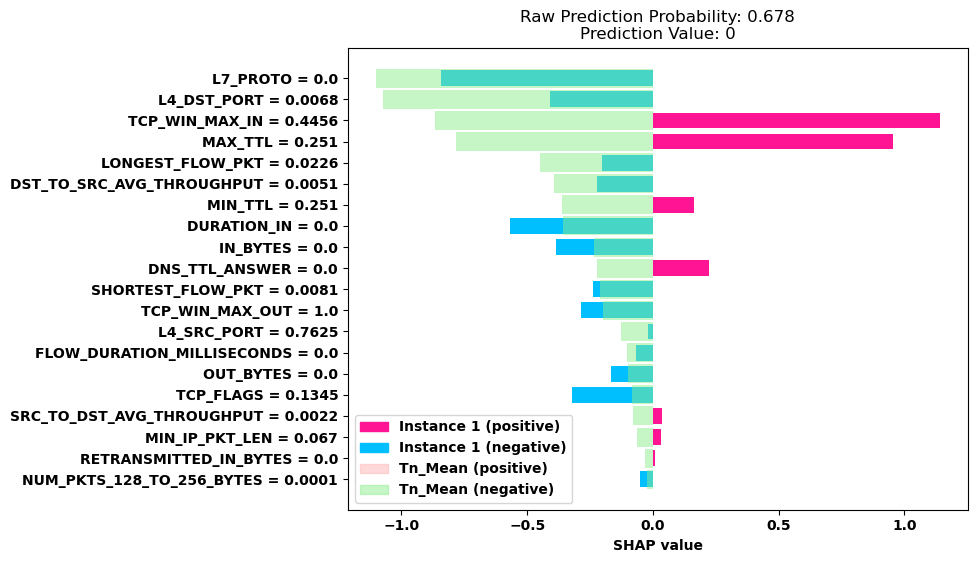

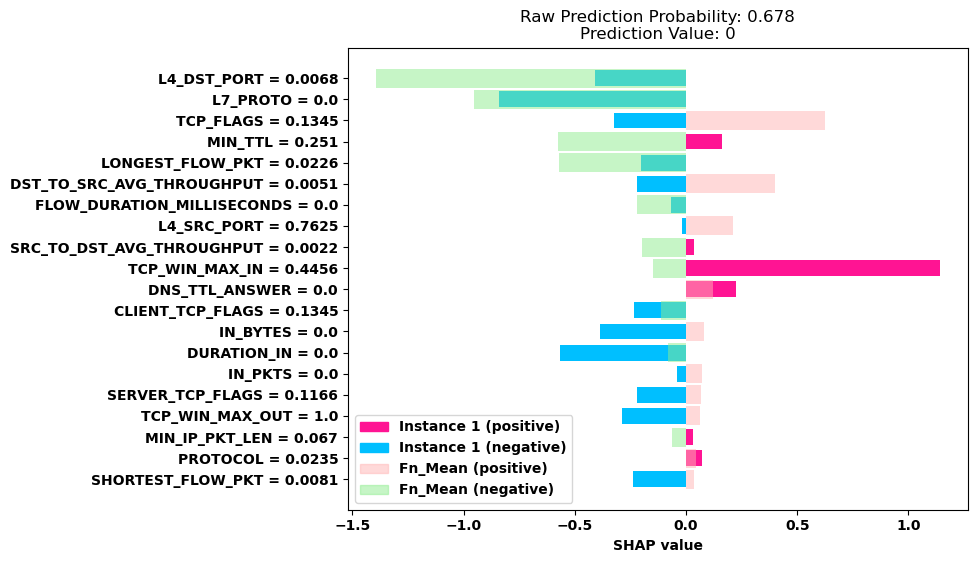

------------------------------------------------------------------------------------------------------------------------------------------------------


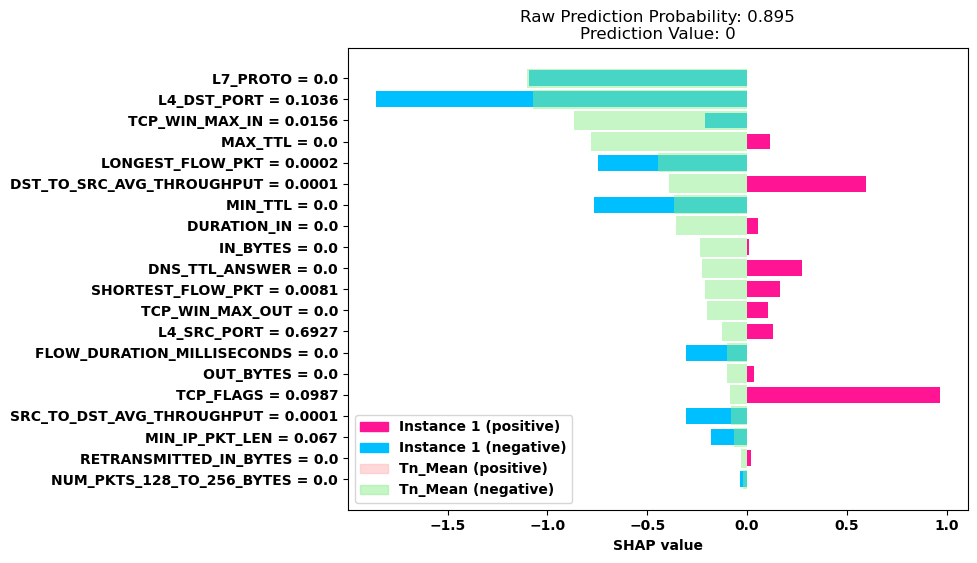

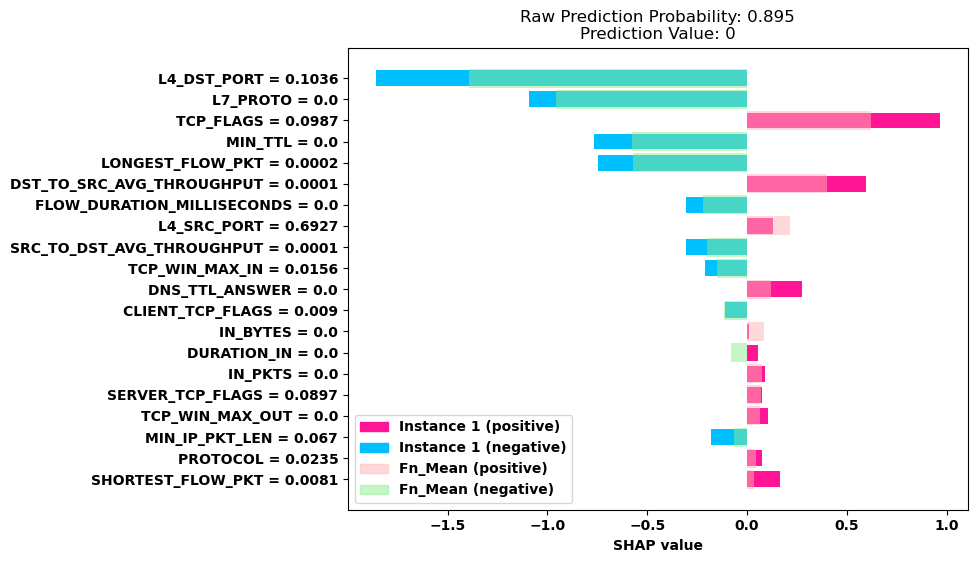

------------------------------------------------------------------------------------------------------------------------------------------------------


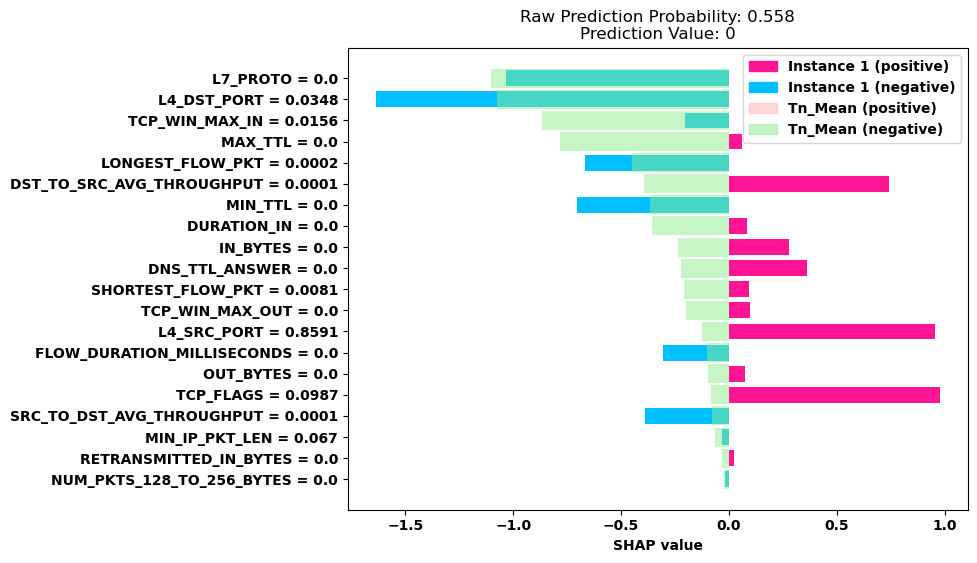

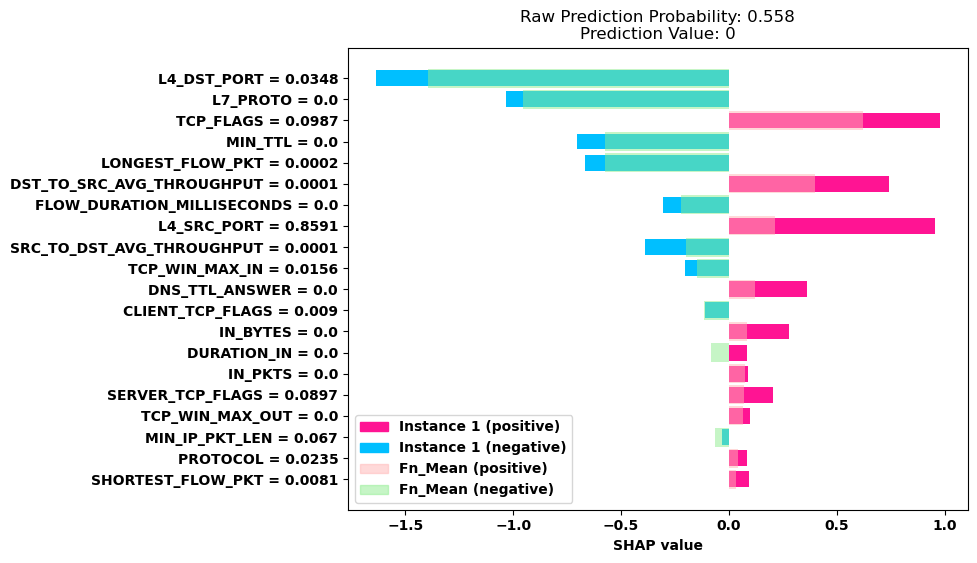

------------------------------------------------------------------------------------------------------------------------------------------------------


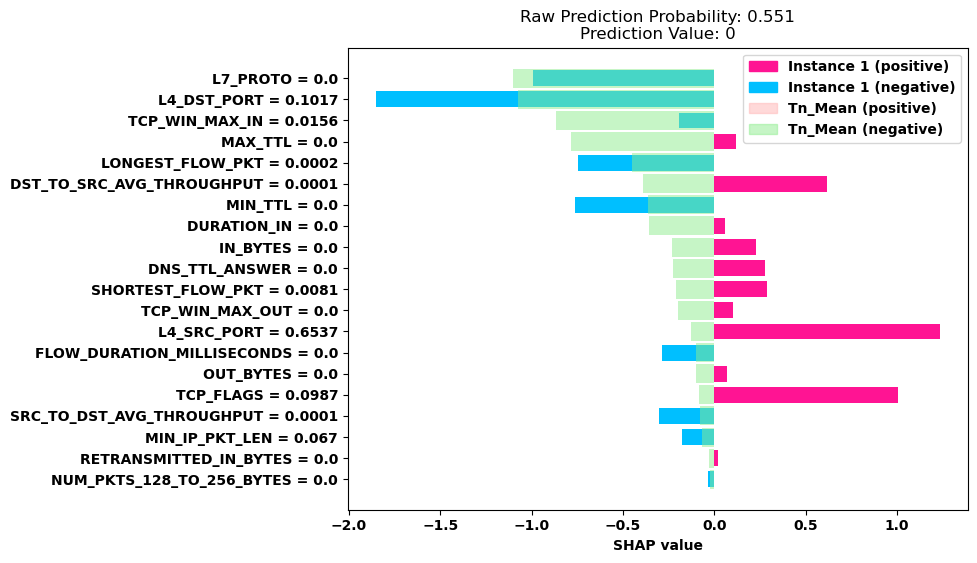

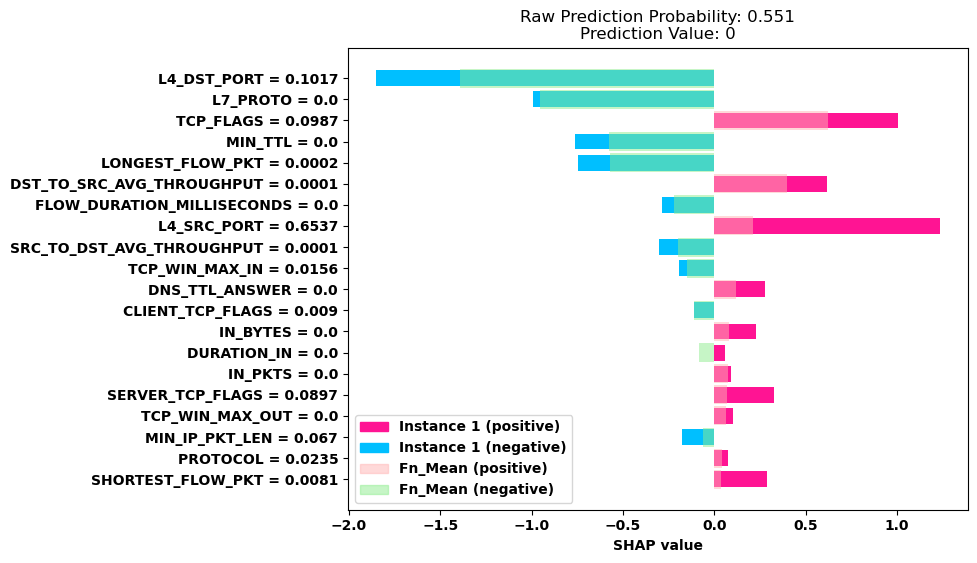

In [109]:
# fn_random_case = fn_shap_values[random.randrange(fp_fn_random_size-1)]
# # print(np.abs(fn_random_case.values))
# plot_overlapping_shap(fn_random_case.values[tp_top_20_features], tp_shap_values_mean[tp_top_20_features], feature_names[tp_top_20_features], fn_random_case.data[tp_top_20_features], 'TP_Mean')
# plot_overlapping_shap(fn_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], tn_random_case.data[tn_top_20_features], 'TN_Mean')
# plot_overlapping_shap(fn_random_case.values[fp_top_20_features], fp_shap_values_mean[fp_top_20_features], feature_names[fp_top_20_features], fp_random_case.data[fp_top_20_features], 'FP_Mean')
# plot_overlapping_shap(fn_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], fn_random_case.data[fn_top_20_features], 'FN_Mean')
# plt.rcParams["figure.figsize"] = (8,6)
# plt.yticks(rotation=0)
# plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
# plt.show()


for i in range(10):
    print('-'*150)
    rand_idx = random.choice(fn_instances)
    fn_random_case = explainer(X_test[rand_idx])
    # print(np.abs(fn_random_case.values))
    plot_overlapping_shap(fn_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], fn_random_case.data[tn_top_20_features], 'Tn_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    # plot_overlapping_shap(fn_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], tn_random_case.data[tn_top_20_features], 'TN_Mean')
    plot_overlapping_shap(fn_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], fn_random_case.data[fn_top_20_features], 'Fn_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    # plot_overlapping_shap(fn_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], fn_random_case.data[fn_top_20_features], 'FN_Mean')
    plt.rcParams["figure.figsize"] = (8,6)
    plt.yticks(rotation=0)
    plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
    plt.show()

In [110]:
tp_tn_random_size = 35
fp_fn_random_size = 15

random_35_tp_instances = np.random.choice(tp_instances, size=tp_tn_random_size, replace=False)
random_35_tn_instances = np.random.choice(tn_instances, size=tp_tn_random_size, replace=False)
random_15_fp_instances = np.random.choice(fp_instances, size=fp_fn_random_size, replace=False)
random_15_fn_instances = np.random.choice(fn_instances, size=fp_fn_random_size, replace=False)

print(random_35_tp_instances)
print(random_35_tn_instances)
print(random_15_fp_instances)
print(random_15_fn_instances)

[531509 249337 213793 434679 291118 319925 536153 398900 210895 479886
  28278 299090 360344    135  76239  80622 420579 233046 405425 417000
 197413 121206 423278 431408 332793 316816 219379 355676 470569 318852
 110433 371241 289890 124627 224373]
[453772 236143 520340 187075 291527 491728 379291  60037 331319 349674
 195188 285735 202501 194748 484306 157543 504017 207404  24107 268428
 224537 374924 188230 463038 179203 553119 452076 332258 159315   2002
  30350 534917 200250 188496 151972]
[416329 288174 222898 210419 181490 265111 344645 110459 401738 482331
 562609 393955 285920 226880 453489]
[483725 558502 261503 426132 300596 308706  20444 558712 412684 332728
 453757 211995 257076 350955 544970]


In [111]:
# [531509 249337 213793 434679 291118 319925 536153 398900 210895 479886
#   28278 299090 360344    135  76239  80622 420579 233046 405425 417000
#  197413 121206 423278 431408 332793 316816 219379 355676 470569 318852
#  110433 371241 289890 124627 224373]
# [453772 236143 520340 187075 291527 491728 379291  60037 331319 349674
#  195188 285735 202501 194748 484306 157543 504017 207404  24107 268428
#  224537 374924 188230 463038 179203 553119 452076 332258 159315   2002
#   30350 534917 200250 188496 151972]
# [416329 288174 222898 210419 181490 265111 344645 110459 401738 482331
#  562609 393955 285920 226880 453489]
# [483725 558502 261503 426132 300596 308706  20444 558712 412684 332728
#  453757 211995 257076 350955 544970]

In [115]:
for i in random_15_fn_instances:
    rand_idx = i
    fn_random_case = explainer(X_test[rand_idx])

    plot_overlapping_shap(fn_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], fn_random_case.data[tn_top_20_features], 'Tn_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    plt.savefig('../Images/NF_UQ/'+str(i)+'_tn_compare.png')
    plt.close()
    
    plot_overlapping_shap(fn_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], fn_random_case.data[fn_top_20_features], 'Fn_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    plt.savefig('../Images/NF_UQ/'+str(i)+'_fn_compare.png')
    
    plt.close()

In [116]:
for i in random_35_tn_instances:
    rand_idx = i
    tn_random_case = explainer(X_test[rand_idx])

    plot_overlapping_shap(tn_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], tn_random_case.data[tn_top_20_features], 'Tn_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    plt.savefig('../Images/NF_UQ/'+str(i)+'_tn_compare.png')
    plt.close()
    plot_overlapping_shap(tn_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], tn_random_case.data[fn_top_20_features], 'Fn_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    plt.savefig('../Images/NF_UQ/'+str(i)+'_fn_compare.png')
    plt.close()

In [117]:
for i in random_15_fp_instances:
    rand_idx = i
    fp_random_case = explainer(X_test[rand_idx])

    plot_overlapping_shap(fp_random_case.values[tp_top_20_features], tp_shap_values_mean[tp_top_20_features], feature_names[tp_top_20_features], fp_random_case.data[tp_top_20_features], 'Tp_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    plt.savefig('../Images/NF_UQ/'+str(i)+'_tp_compare.png')
    plt.close()
    plot_overlapping_shap(fp_random_case.values[fp_top_20_features], fp_shap_values_mean[fp_top_20_features], feature_names[fp_top_20_features], fp_random_case.data[fp_top_20_features], 'Fp_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    plt.savefig('../Images/NF_UQ/'+str(i)+'_fp_compare.png')
    plt.close()

In [118]:
for i in random_35_tp_instances:
    rand_idx = i
    tp_random_case = explainer(X_test[rand_idx])

    plot_overlapping_shap(tp_random_case.values[tp_top_20_features], tp_shap_values_mean[tp_top_20_features], feature_names[tp_top_20_features], tp_random_case.data[tp_top_20_features], 'Tp_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    plt.savefig('../Images/NF_UQ/'+str(i)+'_tp_compare.png')
    plt.close()
    plot_overlapping_shap(tp_random_case.values[fp_top_20_features], fp_shap_values_mean[fp_top_20_features], feature_names[fp_top_20_features], tp_random_case.data[fp_top_20_features], 'Fp_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    plt.savefig('../Images/NF_UQ/'+str(i)+'_fp_compare.png')
    plt.close()